# MSDS 7331 Data Mining  /  Lab 3
#####  Due:  Sunday, Dec 10th, 2017
### Project team:- 
- **Alfeo Sabay**
- **Mustafa Sakarwala**
- **Aravind Veluchamy**
- **Hari Sanadhya**

The dataset used for this lab is a new dataset that we have not used before in our earlier labs. So all the work shown in this notebook is net new and is not copied from previous lab submissions.

# Table of Contents
##### <a href="#Part1">Part 1: Business Understanding </a>
##### <a href="#Part2">Part 2: Data Understanding 1 </a>
##### <a href="#Part3">Part 3: Data Understanding 2 </a>
### Modeling and Evaluation - GraphLab (Python 2)
##### <a href="#Part4a">Part 4a: Modeling and Evaluation 1 </a>
##### <a href="#Part5a">Part 5a: Modeling and Evaluation 2 -3 </a>
#### combining part 2 and 3 since all the models have their respective visualizations included
##### <a href="#Part7a">Part 7a: Modeling and Evaluation 4 </a>
### Modeling and Evaluation - Surpriselib and Tensorflow (Python 3)
##### <a href="#Part4a">Part 4b: Modeling and Evaluation 1 </a>
##### <a href="#Part5a">Part 5b: Modeling and Evaluation 2 </a>
##### <a href="#Part6a">Part 6b: Modeling and Evaluation 3 </a>
##### <a href="#Part7a">Part 7b: Modeling and Evaluation 4 </a>
##### <a href="#Part8">Part 8: Deployment </a>
##### <a href="#Part9">Part 9: Exceptional Work </a>

<a id="Part1"></a>
## Business Understanding
This dataset is downloaded from Kaggle (https://www.kaggle.com/jiashenliu/515k-hotel-reviews-data-in-europe). 
The data was generated by scrapping from http://www.booking.com/. 

A growing reliance on the Internet as an information source when making choices about tourism products raises the need for more research into electronic word of mouth. With the growth of tourism industry due to easier global commute, Online reviews are an important source of information for customers booking accommodation and travel as most of the time, they don't know the place beforehand and would like to consider opinions of visitors who had visited the place earlier. Most customers review Online Travel Agencies (OTAs) and review sites before making a booking decision and with the increase in mobile devices and internet connectivity, this number is increasing everyday, and hence, enhancing the importance of
online reviews for travel decisions. Customers trust reviews by other travellers more than they do official business communication, because they assume that **the reviews are independent**.

Although some issues around fake reviews have reduced the trusts that consumers place in them, they still affect most travel decisions. 

The reviews are not only used by the customers but by the Hotel Management to complement traditional market research and reveal many insights on how well a hotel is meeting its guests’ expectations. Management use this information to identify gaps in their service offering and launch remedial action to make sure that guests are satisfied in the future.

Through this study, we planned to create a recommendation system which based on the reviews will suggest some recommendations to the User. This will make the search easier as if the recommendation system is effective in suggesting better hotels, then the need of the user to go through the reviews one by one and make the decision accordingly will not be required thus making the system usage easier to use, efficient and fast, hence increasing customer satisfaction experience with the technology and ultimately promoting the tool to more users. 

In order to measure the effectiveness of the algorithm, we have used RMSE and precision-recall statistics. We have considered precision-recall as the measurement statistics as out of all the hotels list in an area, only some would be recommended (top 3 to top 5) based on what the user is looking for, making this a compelling case of class imbalance. Since the recommendation algorithm performance is decided by the algorithms accuracy in making every recommendation correct (precision), and getting as many positives recommendations as positives as possible (recall), we used the PR statistics. Additionally, we will use cross validation in viewing how well the recommendation engine generalizes using the subsamples selected from the given sample of population.

<a id="Part2"></a>
## Data Understanding 1
This section defines the meaning and the quality of the data. This includes definition of the attributes in the dataset with details regarding the meaning and type of the data, missing values, duplicate records etc. with their detailed analysis describing whether they are an issue or are legitimate values with supportive reason behind the same.

In [176]:
# Import the required libraries
%matplotlib inline

import seaborn as sns
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import missingno as mno

In [177]:
# Import the dataset into Pandas dataframe
df_hotel_review = pd.read_csv('Hotel_Reviews/Hotel_Reviews.csv', skipinitialspace=True, engine='python')
df_hotel_review.head()

,Hotel_Address,Additional_Number_of_Scoring,Review_Date,Average_Score,Hotel_Name,Reviewer_Nationality,Negative_Review,Review_Total_Negative_Word_Counts,Total_Number_of_Reviews,Positive_Review,Review_Total_Positive_Word_Counts,Total_Number_of_Reviews_Reviewer_Has_Given,Reviewer_Score,Tags,days_since_review,lat,lng
0,s Gravesandestraat 55 Oost 1092 AA Amsterdam N...,194,8/3/2017,7.7,Hotel Arena,Russia,I am so angry that i made this post available ...,397,1403,Only the park outside of the hotel was beautiful,11,7,2.9,"[' Leisure trip ', ' Couple ', ' Duplex Double...",0 days,52.360576,4.915968
1,s Gravesandestraat 55 Oost 1092 AA Amsterdam N...,194,8/3/2017,7.7,Hotel Arena,Ireland,No Negative,0,1403,No real complaints the hotel was great great l...,105,7,7.5,"[' Leisure trip ', ' Couple ', ' Duplex Double...",0 days,52.360576,4.915968
2,s Gravesandestraat 55 Oost 1092 AA Amsterdam N...,194,7/31/2017,7.7,Hotel Arena,Australia,Rooms are nice but for elderly a bit difficult...,42,1403,Location was good and staff were ok It is cute...,21,9,7.1,"[' Leisure trip ', ' Family with young childre...",3 days,52.360576,4.915968
3,s Gravesandestraat 55 Oost 1092 AA Amsterdam N...,194,7/31/2017,7.7,Hotel Arena,United Kingdom,My room was dirty and I was afraid to walk bar...,210,1403,Great location in nice surroundings the bar an...,26,1,3.8,"[' Leisure trip ', ' Solo traveler ', ' Duplex...",3 days,52.360576,4.915968
4,s Gravesandestraat 55 Oost 1092 AA Amsterdam N...,194,7/24/2017,7.7,Hotel Arena,New Zealand,You When I booked with your company on line yo...,140,1403,Amazing location and building Romantic setting,8,3,6.7,"[' Leisure trip ', ' Couple ', ' Suite ', ' St...",10 days,52.360576,4.915968


In [178]:
# View the shape of the Data Frame
df_hotel_review.shape

(515738, 17)

In [179]:
# View the concise summary of a DataFrame.
df_hotel_review.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 515738 entries, 0 to 515737
Data columns (total 17 columns):
Hotel_Address                                 515738 non-null object
Additional_Number_of_Scoring                  515738 non-null int64
Review_Date                                   515738 non-null object
Average_Score                                 515738 non-null float64
Hotel_Name                                    515738 non-null object
Reviewer_Nationality                          515215 non-null object
Negative_Review                               514741 non-null object
Review_Total_Negative_Word_Counts             515738 non-null int64
Total_Number_of_Reviews                       515738 non-null int64
Positive_Review                               515544 non-null object
Review_Total_Positive_Word_Counts             515738 non-null int64
Total_Number_of_Reviews_Reviewer_Has_Given    515738 non-null int64
Reviewer_Score                                515738 non-null flo

By default, days_since_review field should be read as numeric. Since its object field, we need to analyze all the distince values in this field.

In [180]:
df_hotel_review.days_since_review.unique()

array(['0 days', '3 days', '10 days', '17 days', '25 days', '26 days',
       '27 days', '28 days', '30 days', '31 days', '34 days', '35 days',
       '44 days', '45 days', '52 days', '54 days', '66 days', '68 days',
       '70 days', '73 days', '74 days', '79 days', '84 days', '86 days',
       '93 days', '98 days', '99 days', '105 day', '106 day', '107 day',
       '109 day', '111 day', '115 day', '120 day', '127 day', '134 day',
       '136 day', '137 day', '138 day', '140 day', '150 day', '164 day',
       '167 day', '170 day', '175 day', '178 day', '186 day', '188 day',
       '190 day', '196 day', '207 day', '217 day', '218 day', '225 day',
       '226 day', '227 day', '231 day', '232 day', '233 day', '234 day',
       '235 day', '236 day', '239 day', '261 day', '269 day', '270 day',
       '274 day', '276 day', '277 day', '281 day', '282 day', '283 day',
       '294 day', '295 day', '296 day', '301 day', '303 day', '310 day',
       '318 day', '319 day', '325 day', '328 day', '3

Remove the character part from the days_since_review field and then change it to numeric.

In [181]:
df_hotel_review['days_since_review'] = df_hotel_review['days_since_review'].apply(lambda x: int(x.strip().split(' ')[0]))

In [182]:
df_hotel_review.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 515738 entries, 0 to 515737
Data columns (total 17 columns):
Hotel_Address                                 515738 non-null object
Additional_Number_of_Scoring                  515738 non-null int64
Review_Date                                   515738 non-null object
Average_Score                                 515738 non-null float64
Hotel_Name                                    515738 non-null object
Reviewer_Nationality                          515215 non-null object
Negative_Review                               514741 non-null object
Review_Total_Negative_Word_Counts             515738 non-null int64
Total_Number_of_Reviews                       515738 non-null int64
Positive_Review                               515544 non-null object
Review_Total_Positive_Word_Counts             515738 non-null int64
Total_Number_of_Reviews_Reviewer_Has_Given    515738 non-null int64
Reviewer_Score                                515738 non-null flo

Since this dataset does not have identifying user information, we planned to use the Reveiwer Nationality combined with Total_Number_of_Reviews_Reviewer_Has_Given field to create user profile. 
Also this dataset does not have any unique ID uniquely pointing to the particular hotel. We need this field as of now, combination of Hotel Name, Hotel Address, Latitude and Longitude are required to be used to uniquely determine the hotel. So based on these attribues, we will create a unique identifier namely Hotel_ID to identify distinct hotels.

In [183]:
# View unique values of Reviewers Nationality
df_hotel_review.Reviewer_Nationality.unique()

array(['Russia ', 'Ireland ', 'Australia ', 'United Kingdom ',
       'New Zealand ', 'Poland ', 'Belgium ', 'Norway ', 'France ',
       'Italy ', 'Canada ', 'Netherlands ', 'Germany ',
       'United States of America ', 'Hungary ', 'Israel ', 'Switzerland ',
       'India ', 'United Arab Emirates ', 'Malaysia ', 'Denmark ',
       'South Africa ', 'Rwanda ', 'Finland ', 'Portugal ', 'Luxembourg ',
       'Spain ', 'Malta ', 'China ', 'Turkey ', 'Ukraine ', 'Gibraltar ',
       'Argentina ', 'Abkhazia Georgia ', 'Isle of Man ', 'Sweden ',
       'Croatia ', 'Saudi Arabia ', 'Lithuania ', 'Slovenia ', 'Panama ',
       'Austria ', 'Brazil ', 'Taiwan ', 'Iceland ', 'Iran ',
       'Liechtenstein ', 'Chile ', 'Hong Kong ',
       'United States Minor Outlying Islands ', 'Morocco ', 'Oman ',
       'Lebanon ', 'Qatar ', 'Nigeria ', 'Romania ', 'Czech Republic ',
       'Greece ', 'Thailand ', 'Singapore ', 'Guernsey ', 'Latvia ',
       'Namibia ', 'Japan ', 'Egypt ', 'Slovakia ', 'South

#### Missing value analysis

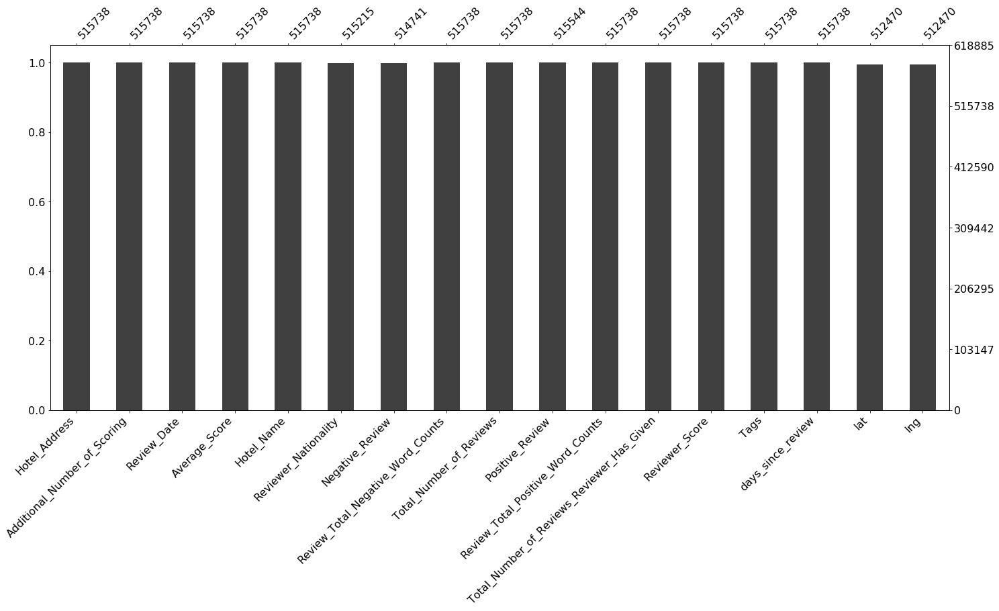

In [184]:
mno.bar(df_hotel_review)

Above graph shows that only a few records have missing values as compared to the number of records in the entire dataset. Looks like less then 1% of the records have missing information. 
Out of the 17 attributes present in the dataset, 5 attributes namely Reviewer_Nationality, Negative_Review, Positive_Review, lat and lng have missing values that too miximum missing values in lat and lng field with (515738 - 512470) 3268 missing values.

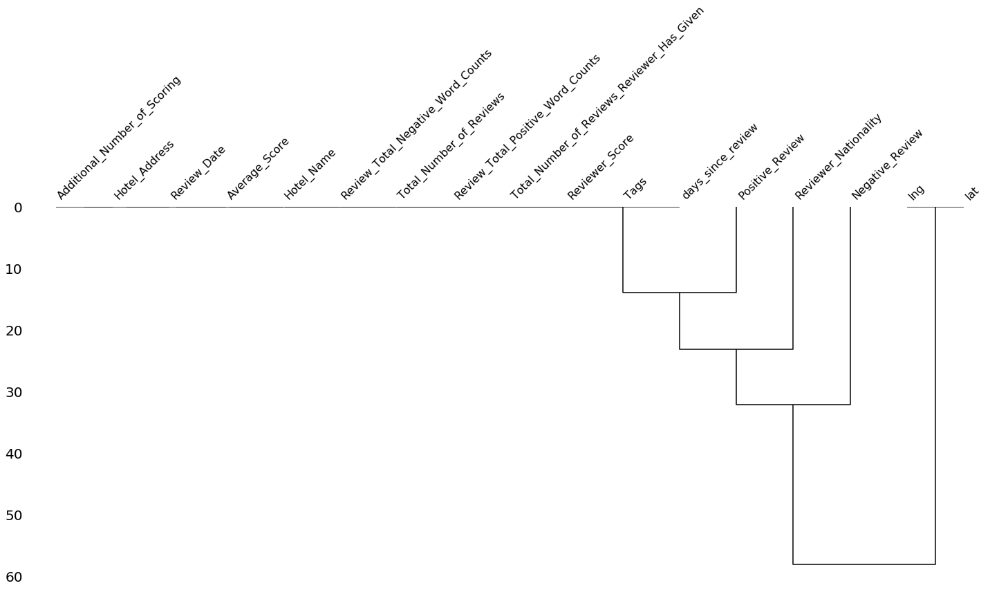

In [185]:
mno.dendrogram(df_hotel_review)

From the above dendogram of missing data, we got to know that the latitude and longitude information, if missing, is missing together. There is no instance when any one of them is present and other is missing. <br>
Since missng latitude and longitude values can be obtained by address, lets analyze the records with missing coordinates separately

In [186]:
df_hotel_review[df_hotel_review.isnull().any(axis=1)]['Hotel_Address'].count()

4898

The above output shows that in the entire dataset, there are a total of 4898 records having any missing values or in other words, (515738 - 4898) 510840 records have no missing values.

To analyze the missing values, we extracted all the records having missing values into another dataframe.

In [187]:
df_null = df_hotel_review[df_hotel_review.isnull().any(axis=1)].reset_index(drop=True)
df_null.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4898 entries, 0 to 4897
Data columns (total 17 columns):
Hotel_Address                                 4898 non-null object
Additional_Number_of_Scoring                  4898 non-null int64
Review_Date                                   4898 non-null object
Average_Score                                 4898 non-null float64
Hotel_Name                                    4898 non-null object
Reviewer_Nationality                          4375 non-null object
Negative_Review                               3901 non-null object
Review_Total_Negative_Word_Counts             4898 non-null int64
Total_Number_of_Reviews                       4898 non-null int64
Positive_Review                               4704 non-null object
Review_Total_Positive_Word_Counts             4898 non-null int64
Total_Number_of_Reviews_Reviewer_Has_Given    4898 non-null int64
Reviewer_Score                                4898 non-null float64
Tags                     

Since if given the name and address of the location, its possible to determine the coordinates (latitude and longitude) of the location, we further segmented the records having missing coordinates into a separate dataframe.

In [188]:
df_missing_coord = df_null[df_null[['lat','lng']].isnull().any(axis=1)].reset_index(drop=True)
df_null = df_null[df_null[['lat','lng']].isnull().any(axis=1)==False].reset_index(drop=True)
df_missing_coord.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3268 entries, 0 to 3267
Data columns (total 17 columns):
Hotel_Address                                 3268 non-null object
Additional_Number_of_Scoring                  3268 non-null int64
Review_Date                                   3268 non-null object
Average_Score                                 3268 non-null float64
Hotel_Name                                    3268 non-null object
Reviewer_Nationality                          3265 non-null object
Negative_Review                               3254 non-null object
Review_Total_Negative_Word_Counts             3268 non-null int64
Total_Number_of_Reviews                       3268 non-null int64
Positive_Review                               3266 non-null object
Review_Total_Positive_Word_Counts             3268 non-null int64
Total_Number_of_Reviews_Reviewer_Has_Given    3268 non-null int64
Reviewer_Score                                3268 non-null float64
Tags                     

Its possible that the records with missing coordinates may have coordinate information present in some other record in the dataset. To check for this, we extracted all distinct hotels from the missing coordinates dataframe.

In [189]:
unique_null_hotels = df_missing_coord[['Hotel_Name','Hotel_Address']].drop_duplicates().reset_index(drop=True)
unique_null_hotels.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17 entries, 0 to 16
Data columns (total 2 columns):
Hotel_Name       17 non-null object
Hotel_Address    17 non-null object
dtypes: object(2)
memory usage: 352.0+ bytes


Now, extract all the distinct hotels from the entire dataset having latitude and langitude information present

In [190]:
df_list_hotels = df_hotel_review[['Hotel_Address','Hotel_Name', 'lat', 'lng']].drop_duplicates().reset_index(drop=True)
df_list_hotels = df_list_hotels[df_list_hotels.isnull().any(axis=1)==False].reset_index(drop=True)
df_list_hotels.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1477 entries, 0 to 1476
Data columns (total 4 columns):
Hotel_Address    1477 non-null object
Hotel_Name       1477 non-null object
lat              1477 non-null float64
lng              1477 non-null float64
dtypes: float64(2), object(2)
memory usage: 46.2+ KB


Perform the join of the two dataframes created above to find if the hotels having missing coordinates have coordinate information present in any record in the entire dataset.

In [191]:
pd.merge(unique_null_hotels, df_list_hotels, on=['Hotel_Address','Hotel_Name'])

,Hotel_Name,Hotel_Address,lat,lng


Since the Hotels with missing coordinates are not present in the list of Hotels with coordinates, so we cannot get the coordinates from the existing data. Let us explore the libraries which can be used to determine the coordinates given the address of the location. 

So lets create the table with the hotel attributes again. In order to search for coordinates, we took out the Hotel entity data into a separate table to reduce the number of location lookups that would be required to find the missing attributes. Also create the Hotel_ID identifier which will uniquely identify the hotel.

In [192]:
df_list_hotels = df_hotel_review[['Hotel_Address','Hotel_Name', 'lat', 'lng', 'Average_Score']].drop_duplicates().reset_index(drop=True)
df_list_hotels['Hotel_ID_num'] = df_list_hotels.index + 1
df_list_hotels['Hotel_ID'] = df_list_hotels.Hotel_ID_num.apply(lambda x: str(x).rjust(5,'0'))
df_list_hotels.drop('Hotel_ID_num', axis=1, inplace=True)
df_list_hotels = df_list_hotels[['Hotel_ID', 'Hotel_Name', 'Hotel_Address', 'lat', 'lng', 'Average_Score']]
df_list_hotels.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1494 entries, 0 to 1493
Data columns (total 6 columns):
Hotel_ID         1494 non-null object
Hotel_Name       1494 non-null object
Hotel_Address    1494 non-null object
lat              1477 non-null float64
lng              1477 non-null float64
Average_Score    1494 non-null float64
dtypes: float64(3), object(3)
memory usage: 70.1+ KB


So we have a total of 1494 distinct hotels in the dataset with coordinate information present for 1477 hotels. So we need to determine the coordinates of 18 hotels.

Before proceeding further with the analysis, lets add Hotel_ID field into the original dataset and remove other Hotel Fields which we will add again after the analysis of missing geometrical coordinates of Hotels is completed.

In [193]:
df_hotel_review = pd.merge(df_hotel_review, df_list_hotels, on=['Hotel_Address','Hotel_Name', 'lat', 'lng', 'Average_Score'])
df_hotel_review.drop(['Hotel_Address','Hotel_Name', 'lat', 'lng', 'Average_Score'], axis=1, inplace=True)
print(df_hotel_review.shape)
df_hotel_review.describe(include='all').T

(515738, 13)


,count,unique,top,freq,mean,std,min,25%,50%,75%,max
Additional_Number_of_Scoring,515738,NaN,NaN,NaN,498.082,500.538,1,169,341,660,2682
Review_Date,515738,731,8/2/2017,2585,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Reviewer_Nationality,515215,226,United Kingdom,245246,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Negative_Review,514741,330009,No Negative,127890,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Review_Total_Negative_Word_Counts,515738,NaN,NaN,NaN,18.5395,29.6908,0,2,9,23,408
Total_Number_of_Reviews,515738,NaN,NaN,NaN,2743.74,2317.46,43,1161,2134,3613,16670
Positive_Review,515544,412599,No Positive,35946,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Review_Total_Positive_Word_Counts,515738,NaN,NaN,NaN,17.7765,21.8042,0,5,11,22,395
Total_Number_of_Reviews_Reviewer_Has_Given,515738,NaN,NaN,NaN,7.166,11.0402,1,1,3,8,355
Reviewer_Score,515738,NaN,NaN,NaN,8.39508,1.63786,2.5,7.5,8.8,9.6,10


Lets explore the library using which we can determine the missing coordinate information.

In [194]:
from googlegeocoder import GoogleGeocoder
geocoder = GoogleGeocoder()

In [195]:
# Function that will return the coordinates (latitude and longitute) corresponding to the address passed as the parameter
def coord_lookup(geocoder_obj, address):
    try:
        search = geocoder_obj.get(address)
    except ValueError:
        return [None, None]
    first_result = search[0]
    output =  [
        first_result.geometry.location.lat,
        first_result.geometry.location.lng
    ]
    return output;

In [196]:
# Look for the coordinates using just the Hotel Address
for i, rows in df_list_hotels.iterrows():
    if pd.isnull(rows.lat):
        x = coord_lookup(geocoder, rows.Hotel_Address)
        df_list_hotels.set_value(i, ['lat','lng'], x)

In [197]:
df_list_hotels.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1494 entries, 0 to 1493
Data columns (total 6 columns):
Hotel_ID         1494 non-null object
Hotel_Name       1494 non-null object
Hotel_Address    1494 non-null object
lat              1478 non-null float64
lng              1478 non-null float64
Average_Score    1494 non-null float64
dtypes: float64(3), object(3)
memory usage: 70.1+ KB


We were able to find only one address coordinates using the above logic. Lets see the address values of Hotels with missing coordinates  and see if it needs to altered to get the coordinates as it may be possible that the address contains some messy data.

In [198]:
for rows in df_list_hotels.itertuples():
    if pd.isnull(rows.lat):
        print(rows.Hotel_ID, "\t", rows.Hotel_Name,"\n\t",  rows.Hotel_Address)

00283 	 Mercure Paris Gare Montparnasse 
	 20 Rue De La Ga t 14th arr 75014 Paris France
00332 	 Holiday Inn Paris Montmartre 
	 23 Rue Damr mont 18th arr 75018 Paris France
00512 	 Maison Albar Hotel Paris Op ra Diamond 
	 4 rue de la P pini re 8th arr 75008 Paris France
00958 	 City Hotel Deutschmeister 
	 Gr nentorgasse 30 09 Alsergrund 1090 Vienna Austria
00988 	 Hotel Park Villa 
	 Hasenauerstra e 12 19 D bling 1190 Vienna Austria
01023 	 Fleming s Selection Hotel Wien City 
	 Josefst dter Stra e 10 12 08 Josefstadt 1080 Vienna Austria
01024 	 Cordial Theaterhotel Wien 
	 Josefst dter Stra e 22 08 Josefstadt 1080 Vienna Austria
01054 	 Hotel Daniel Vienna 
	 Landstra er G rtel 5 03 Landstra e 1030 Vienna Austria
01138 	 Roomz Vienna 
	 Paragonstra e 1 11 Simmering 1110 Vienna Austria
01162 	 Renaissance Barcelona Hotel 
	 Pau Clar s 122 Eixample 08009 Barcelona Spain
01271 	 Austria Trend Hotel Schloss Wilhelminenberg Wien 
	 Savoyenstra e 2 16 Ottakring 1160 Vienna Austria
01287 

Since all above addresses are not clear with their content, we used the hotel name and the last 5 words of the address (Partial Address) to determine if we can find the hotel coordinates.

In [199]:
for i, rows in df_list_hotels.iterrows():
    if pd.isnull(rows.lat):
        address = " ".join(rows.Hotel_Address.split(sep=' ')[-5:])
        lookup_string = " ".join([rows.Hotel_Name, address])
        df_list_hotels.set_value(i, ['lat','lng'], coord_lookup(geocoder,lookup_string))
df_list_hotels.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1494 entries, 0 to 1493
Data columns (total 6 columns):
Hotel_ID         1494 non-null object
Hotel_Name       1494 non-null object
Hotel_Address    1494 non-null object
lat              1494 non-null float64
lng              1494 non-null float64
Average_Score    1494 non-null float64
dtypes: float64(3), object(3)
memory usage: 70.1+ KB


We were able to get the goegraphical coordinates of all the hotels in our dataset. Lets merge those back into the original dataframe.

In [200]:
df_hotel_review = pd.merge(df_hotel_review, df_list_hotels, on=['Hotel_ID'])
df_hotel_review.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 515738 entries, 0 to 515737
Data columns (total 18 columns):
Additional_Number_of_Scoring                  515738 non-null int64
Review_Date                                   515738 non-null object
Reviewer_Nationality                          515215 non-null object
Negative_Review                               514741 non-null object
Review_Total_Negative_Word_Counts             515738 non-null int64
Total_Number_of_Reviews                       515738 non-null int64
Positive_Review                               515544 non-null object
Review_Total_Positive_Word_Counts             515738 non-null int64
Total_Number_of_Reviews_Reviewer_Has_Given    515738 non-null int64
Reviewer_Score                                515738 non-null float64
Tags                                          515738 non-null object
days_since_review                             515738 non-null int64
Hotel_ID                                      515738 non-null obje

Since we know that fields Review_Total_Negative_Word_Counts and Review_Total_Positive_Word_Counts are the count of the words the reviewer mentioned in his Negative_Review and Positive_Review respectively, the counter fields should be in sink with the number of words in the review fields. But from the above output, we notice that the non missing values in the counter fields are different then the corresponding review field. The counter fields are populated in all the cases whereas the actual review is missing in some cases. So it might be possible that the missing review fields have a word count of 0. Lets see check if the counter fields minimum value is zero or not.

In [201]:
df_hotel_review[['Review_Total_Negative_Word_Counts', 'Review_Total_Positive_Word_Counts']].describe().T

,count,mean,std,min,25%,50%,75%,max
Review_Total_Negative_Word_Counts,515738.0,18.539450,29.690831,0.0,2.0,9.0,23.0,408.0
Review_Total_Positive_Word_Counts,515738.0,17.776458,21.804185,0.0,5.0,11.0,22.0,395.0


when we look into the minimum values of the fields Review_Total_Positive_Word_Counts and Review_Total_Positive_Word_Counts is 0 which is what we were expecting. Lets confirm if our theory behind missing review and its word count is true or not.

In [202]:
x = df_hotel_review[df_hotel_review['Review_Total_Negative_Word_Counts'] == 0]['Negative_Review']
print("Count of records with negative word count as Zero:", x.count())
print("Unique negative review values when the negative word count is Zero:", x.unique())
x = df_hotel_review[df_hotel_review['Review_Total_Positive_Word_Counts'] == 0]['Positive_Review']
print("Count of records with Positive word count as Zero:", x.count())
print("Unique Positive review values when the Positive word count is Zero:", x.unique())

Count of records with negative word count as Zero: 127890
Unique negative review values when the negative word count is Zero: ['No Negative']
Count of records with Positive word count as Zero: 35946
Unique Positive review values when the Positive word count is Zero: ['No Positive']


Above output shows that whenever the negative and positive word count is zero, the review is 'No Negative' and 'No Positive' respectively. We need to verify if the inverse if true as well.

Lets check if the all the reviews containing 'No Negative' and 'No Positive' have review word count as Zero or not

In [203]:
negative_word_count = df_hotel_review[df_hotel_review.Negative_Review.apply(lambda x: str(x).strip().lower() 
    == 'no negative')]['Review_Total_Negative_Word_Counts']
positive_word_count = df_hotel_review[df_hotel_review.Positive_Review.apply(lambda x: str(x).strip().lower() 
    == 'no positive')]['Review_Total_Positive_Word_Counts']
# If all word counts are zero for reviews 'No Negative' and 'No Positive', then the sum of all the values in 
#     series negative_word_count and positive_word_count above should be zero
print("Sum of all word counts when review is 'No Negative' and 'No Positive' is:", 
      negative_word_count.sum() + positive_word_count.sum())
print("Count of records with negative review 'No Negative':", negative_word_count.count())
print("Count of records with positive review 'No Positive':", positive_word_count.count())
y = df_hotel_review[['Negative_Review','Positive_Review']].apply(lambda x: 
    str(x[0]).strip().lower() == 'no negative' or str(x[1]).strip().lower() == 'no positive' , axis=1)
print("Count of records with review as 'No Negative' or 'No Positive':", y.sum())

Sum of all word counts when review is 'No Negative' and 'No Positive' is: 0
Count of records with negative review 'No Negative': 127890
Count of records with positive review 'No Positive': 35946
Count of records with review as 'No Negative' or 'No Positive': 163709


Above output shows that for reviews 'No Negative' and 'No Positive', the word count is zero. 

Our theory that review counter value would be zero when the review is missing fails as when the review words count is zero, the review is either 'No Negative' or 'No Positive'.

Now lets analyze the word count values when the review comments are missing.

In [204]:
x = df_hotel_review[pd.isnull(df_hotel_review['Negative_Review'])]['Review_Total_Negative_Word_Counts']
print("Count of records with missing Negative Review:", x.count())
print("Unique Values of Negative Review word count when negative review is missing:", x.unique())
x = df_hotel_review[pd.isnull(df_hotel_review['Positive_Review'])]['Review_Total_Positive_Word_Counts']
print("Count of records with missing Positive Review:", x.count())
print("Unique Values of Positive Review word count when Positive review is missing:", x.unique())
y = pd.isnull(df_hotel_review[['Negative_Review','Positive_Review']]).apply(lambda x: x[0] or x[1], axis=1)
print("Number of records with missing Negative or Positive review", y.sum())

Count of records with missing Negative Review: 997
Unique Values of Negative Review word count when negative review is missing: [2]
Count of records with missing Positive Review: 194
Unique Values of Positive Review word count when Positive review is missing: [2]
Number of records with missing Negative or Positive review 1126


We have 2 scenarios to deal here:
- when the review words count is zero, the review is either 'No Negative' or 'No Positive'. (163709 records)
- when the review is missing, the review words count is always 2. (1126 instances)

Both of the above cases does not appear as any issue with the data but more likely of some specific condition when they happen as both lead to some specific rule, not any random data inconsistencies.  

From the first condition, it looks like 'No Negative' or 'No Positive' are default comments of the application and if no review comments are left, these are the comments that are written to the database. So for the count to be in sink with the word count, we replaced the review to be blank when the word count was zero.

From the second condition, it appears like there is some speicific condition when the application is not able to save the comment but is counting the number of words in it. Since we cannot figure out what the exact comment was and also the record count for these records is low (1126 records) as compared to the entire dataset (515738 records), we decided to drop these records. 

Before dropping these records, we need to validate if the word counts of the review is correct or not.

**Validation of count of words in the review field with the given counter fields.**

In [205]:
import collections
df_hotel_review['count_neg_word'] = df_hotel_review.Negative_Review.apply(lambda x: 0 if x is None else len(str(x).split()))
df_hotel_review['count_pos_word'] = df_hotel_review.Positive_Review.apply(lambda x: 0 if x is None else len(str(x).split()))
df_hotel_review['diff_count_neg_word'] = df_hotel_review.count_neg_word - df_hotel_review.Review_Total_Negative_Word_Counts
df_hotel_review['diff_count_pos_word'] = df_hotel_review.count_pos_word - df_hotel_review.Review_Total_Positive_Word_Counts
diff_neg = collections.Counter(df_hotel_review.diff_count_neg_word)
diff_pos = collections.Counter(df_hotel_review.diff_count_pos_word)
print("For Negative Review: ", diff_neg)
print("For Positive Review: ", diff_pos)

For Negative Review:  Counter({-2: 223561, -1: 164287, 2: 127890})
For Positive Review:  Counter({-2: 267729, -1: 212063, 2: 35946})


Above output is a Dictionary - Key-value pair where key represents actual difference and value represents the number of records having this difference.

From the above output, we got to know that the word count given in the dataset never matches with the actual word count in the review. This mean that there is some kind of flaw in calculating the word count.

The number of records with the difference of 2 (127890 for negative and 35946 for positive) matches with the number of records having review as 'No Negative' or 'No Positive'. 

The negative differences of -1 and -2 is the result of us reading the file without the leading or trailing spaces which as per us, is the way, the comments should be read by the application as well. Spaces should not be treated as words.
Considering this, we decided to replace the word count given in the dataset with our computed value.

Firstly, replace the 'No Negative' or 'No Positive' review comments by blanks.

In [206]:
df_hotel_review.Positive_Review = df_hotel_review[['Review_Total_Positive_Word_Counts','Positive_Review']].apply(lambda x: 
                                                None if x[0]==0 else x[1], axis=1)
df_hotel_review.Negative_Review = df_hotel_review[['Review_Total_Negative_Word_Counts','Negative_Review']].apply(lambda x: 
                                                None if x[0]==0 else x[1], axis=1)
df_hotel_review.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 515738 entries, 0 to 515737
Data columns (total 22 columns):
Additional_Number_of_Scoring                  515738 non-null int64
Review_Date                                   515738 non-null object
Reviewer_Nationality                          515215 non-null object
Negative_Review                               386851 non-null object
Review_Total_Negative_Word_Counts             515738 non-null int64
Total_Number_of_Reviews                       515738 non-null int64
Positive_Review                               479598 non-null object
Review_Total_Positive_Word_Counts             515738 non-null int64
Total_Number_of_Reviews_Reviewer_Has_Given    515738 non-null int64
Reviewer_Score                                515738 non-null float64
Tags                                          515738 non-null object
days_since_review                             515738 non-null int64
Hotel_ID                                      515738 non-null obje

Now replace the word count given in the dataset with our computed value.

In [207]:
df_hotel_review['count_neg_word'] = df_hotel_review.Negative_Review.apply(lambda x: 0 if x is None else len(str(x).split()))
df_hotel_review['count_pos_word'] = df_hotel_review.Positive_Review.apply(lambda x: 0 if x is None else len(str(x).split()))
df_hotel_review.Review_Total_Negative_Word_Counts = df_hotel_review.count_neg_word
df_hotel_review.Review_Total_Positive_Word_Counts = df_hotel_review.count_pos_word
df_hotel_review.drop(['count_neg_word', 'count_pos_word', 'diff_count_neg_word', 'diff_count_pos_word'], 
                     axis=1, inplace=True)
df_hotel_review.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 515738 entries, 0 to 515737
Data columns (total 18 columns):
Additional_Number_of_Scoring                  515738 non-null int64
Review_Date                                   515738 non-null object
Reviewer_Nationality                          515215 non-null object
Negative_Review                               386851 non-null object
Review_Total_Negative_Word_Counts             515738 non-null int64
Total_Number_of_Reviews                       515738 non-null int64
Positive_Review                               479598 non-null object
Review_Total_Positive_Word_Counts             515738 non-null int64
Total_Number_of_Reviews_Reviewer_Has_Given    515738 non-null int64
Reviewer_Score                                515738 non-null float64
Tags                                          515738 non-null object
days_since_review                             515738 non-null int64
Hotel_ID                                      515738 non-null obje

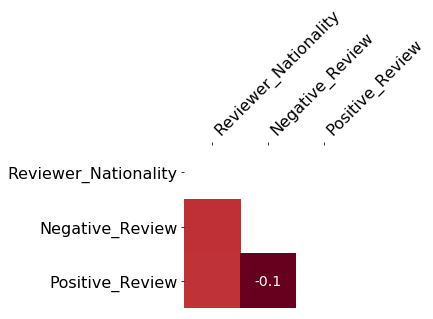

In [208]:
mno.heatmap(df_hotel_review, figsize=(3,3))

The above figure shows a negative correlation between positive review and negative review which means that out of the total missing values in Positive_Review record, 10% of the records are having Negative_Review also blank.

This mean that for all those cases, the reviewer had just given the rating and left without leaving any comment or naration in support of the rating provided.

Also based on the data provided, the nationality of the reviewer cannot be determined. There are 523 (515738 - 515215) records having missing values of reviewers nationality. This number is very small i.e. ard 0.1%, so we decided to drop them from our dataset.

In [209]:
df_hotel_review = df_hotel_review[pd.isnull(df_hotel_review.Reviewer_Nationality) == False].reset_index(drop=True)
df_hotel_review.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 515215 entries, 0 to 515214
Data columns (total 18 columns):
Additional_Number_of_Scoring                  515215 non-null int64
Review_Date                                   515215 non-null object
Reviewer_Nationality                          515215 non-null object
Negative_Review                               386453 non-null object
Review_Total_Negative_Word_Counts             515215 non-null int64
Total_Number_of_Reviews                       515215 non-null int64
Positive_Review                               479144 non-null object
Review_Total_Positive_Word_Counts             515215 non-null int64
Total_Number_of_Reviews_Reviewer_Has_Given    515215 non-null int64
Reviewer_Score                                515215 non-null float64
Tags                                          515215 non-null object
days_since_review                             515215 non-null int64
Hotel_ID                                      515215 non-null obje

Create User_ID field. There is no way using this dataset to group the comments as per users. So we used the nationality and the total number of reviews given by user to create a User_ID field. Though this grouping is not fully accurate, in order to get the sense of how the recommendation engine would work if distinct user information is given, we created this field.

In [210]:
df_hotel_review = df_hotel_review.sort_values(['Reviewer_Nationality', 'Total_Number_of_Reviews_Reviewer_Has_Given'])
df_hotel_review['User_ID']= '000000'

In [211]:
u_id = 0
u_nationality=''
u_nbrReviews = 0
u_counter = 0
for i, row in df_hotel_review.iterrows():
    if row.Reviewer_Nationality.strip() != u_nationality or row.Total_Number_of_Reviews_Reviewer_Has_Given != u_nbrReviews or row.Total_Number_of_Reviews_Reviewer_Has_Given <= u_counter:
        u_id += 1
    row.User_ID = str(u_id).rjust(6,'0')
    df_hotel_review.set_value(i, 'User_ID', row.User_ID)
    if row.Reviewer_Nationality.strip() != u_nationality or row.Total_Number_of_Reviews_Reviewer_Has_Given != u_nbrReviews:
        u_nationality = row.Reviewer_Nationality.strip()
        u_nbrReviews = row.Total_Number_of_Reviews_Reviewer_Has_Given
        u_counter = 0
    if row.Total_Number_of_Reviews_Reviewer_Has_Given <= u_counter:
        u_counter = 0
    else:
        u_counter += 1
df_hotel_review.head()

,Additional_Number_of_Scoring,Review_Date,Reviewer_Nationality,Negative_Review,Review_Total_Negative_Word_Counts,Total_Number_of_Reviews,Positive_Review,Review_Total_Positive_Word_Counts,Total_Number_of_Reviews_Reviewer_Has_Given,Reviewer_Score,Tags,days_since_review,Hotel_ID,Hotel_Name,Hotel_Address,lat,lng,Average_Score,User_ID
237,194,8/25/2015,Abkhazia Georgia,The variety of the breakfast was not as good E...,15,1403,Was convenient because our friends live close ...,29,1,7.5,"[' Leisure trip ', ' Couple ', ' Duplex Double...",709,00001,Hotel Arena,s Gravesandestraat 55 Oost 1092 AA Amsterdam N...,52.360576,4.915968,7.7,000001
14806,68,10/15/2015,Abkhazia Georgia,Nothing,1,255,Very impressive customer service,4,1,10.0,"[' Leisure trip ', ' Couple ', ' Deluxe Room '...",658,00025,Haymarket Hotel,1 Suffolk Place Westminster Borough London SW1...,51.508460,-0.131138,9.6,000002
17602,84,10/10/2015,Abkhazia Georgia,None,0,796,The Hotel is situated close to the Ledru Rolli...,197,1,10.0,"[' Leisure trip ', ' Couple ', ' Classic Doubl...",663,00028,Hotel L Antoine,10 12 rue de Charonne 11th arr 75011 Paris France,48.852422,2.374383,8.9,000002
20250,220,5/23/2017,Abkhazia Georgia,Hotel too hot,3,902,None,0,1,10.0,"[' Leisure trip ', ' Solo traveler ', ' Superi...",72,00038,The Ampersand Hotel,10 Harrington Road Kensington and Chelsea Lond...,51.494308,-0.175558,9.1,000003
42074,397,4/16/2016,Abkhazia Georgia,One thing I would say is the pool is a bit dat...,33,1640,Lovely hotel colleague are very friendly rooms...,51,1,9.6,"[' Leisure trip ', ' Group ', ' Deluxe with Tw...",474,00117,London Marriott Hotel Regents Park,128 King Henry s Road Camden London NW3 3ST Un...,51.542148,-0.170307,8.3,000003


In [212]:
df_hotel_review.reset_index(drop=True, inplace=True)
df_hotel_review.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 515215 entries, 0 to 515214
Data columns (total 19 columns):
Additional_Number_of_Scoring                  515215 non-null int64
Review_Date                                   515215 non-null object
Reviewer_Nationality                          515215 non-null object
Negative_Review                               386453 non-null object
Review_Total_Negative_Word_Counts             515215 non-null int64
Total_Number_of_Reviews                       515215 non-null int64
Positive_Review                               479144 non-null object
Review_Total_Positive_Word_Counts             515215 non-null int64
Total_Number_of_Reviews_Reviewer_Has_Given    515215 non-null int64
Reviewer_Score                                515215 non-null float64
Tags                                          515215 non-null object
days_since_review                             515215 non-null int64
Hotel_ID                                      515215 non-null obje

In [214]:
df_hotel_review.describe(include='all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
Additional_Number_of_Scoring,515215,NaN,NaN,NaN,498.089,500.567,1,169,341,660,2682
Review_Date,515215,731,8/2/2017,2582,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Reviewer_Nationality,515215,226,United Kingdom,245246,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Negative_Review,386453,329656,Nothing,14292,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Review_Total_Negative_Word_Counts,515215,NaN,NaN,NaN,17.354,29.3322,0,1,7,22,406
Total_Number_of_Reviews,515215,NaN,NaN,NaN,2743.62,2317.23,43,1161,2134,3613,16670
Positive_Review,479144,412237,Location,9206,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Review_Total_Positive_Word_Counts,515215,NaN,NaN,NaN,16.3317,21.5646,0,4,10,21,393
Total_Number_of_Reviews_Reviewer_Has_Given,515215,NaN,NaN,NaN,7.17023,11.0439,1,1,3,8,355
Reviewer_Score,515215,NaN,NaN,NaN,8.39547,1.63769,2.5,7.5,8.8,9.6,10


This is the final dataset on which we will be performing the recommendation system. Note that the missing values in Negative_Review and Positive_Review are not an issue as they are genuinely blank.

### **Description of the attributes in the dataframe**
We have a total of 515215 review of scoring of 1494 luxury hotels across Europe in our final dataframe with 19 attributes. Below is the description of all the attributes:-

<table border=1 cellspacing=1 cellpadding=1>
 <tr>
  <td   >
  Attribute Name
  </td>
  <td >
  Data Type
  </td>
  <td >
  Raw/Custom Field
  </td>
  <td >
  Allowed Null Values
  </td>
  <td >
  Description of the field
  </td>
 </tr>
 <tr>
  <td>
  Additional_Number_of_Scoring
  </td>
  <td >
  Integer
  </td>
  <td >
  Raw
  </td>
  <td >
  No
  </td>
  <td >
  There are
  also some guests who just made a scoring on the service rather than a review.
  This number indicates how many valid scores without review in there.
  </td>
 </tr>
 <tr>
  <td  >
  Review_Date
  </td>
  <td >
  String
  </td>
  <td >
  Raw
  </td>
  <td >
  No
  </td>
  <td >
  Date when
  reviewer posted the corresponding review.
  </td>
 </tr>
 <tr>
  <td  >
  Average_Score
  </td>
  <td >
  Float
  </td>
  <td >
  Raw
  </td>
  <td >
  No
  </td>
  <td >
  Average
  Review Score of the hotel based on the comments
  </td>
 </tr>
 <tr>
  <td  >
  Reviewer_Nationality
  </td>
  <td >
  String
  </td>
  <td >
  Raw
  </td>
  <td >
  No
  </td>
  <td >
  Nationality
  of Reviewer
  </td>
 </tr>
 <tr>
  <td  >
  Negative_Review
  </td>
  <td >
  String
  </td>
  <td >
  Raw
  </td>
  <td >
  Yes
  </td>
  <td >
  Negative
  Review the reviewer gave to the hotel. 
  </td>
 </tr>
 <tr>
  <td  >
  Review_Total_Negative_Word_Counts
  </td>
  <td >
  Integer
  </td>
  <td >
  Raw
  </td>
  <td >
  No
  </td>
  <td >
  Total number
  of words in the negative review.
  </td>
 </tr>
 <tr>
  <td  >
  Total_Number_of_Reviews
  </td>
  <td >
  Integer
  </td>
  <td >
  Raw
  </td>
  <td >
  No
  </td>
  <td >
  Total number
  of valid reviews the hotel has.
  </td>
 </tr>
 <tr>
  <td  >
  Positive_Review
  </td>
  <td >
  String
  </td>
  <td >
  Raw
  </td>
  <td >
  Yes
  </td>
  <td >
  Positive
  Review the reviewer gave to the hotel. 
  </td>
 </tr>
 <tr>
  <td  >
  Review_Total_Positive_Word_Counts
  </td>
  <td >
  Integer
  </td>
  <td >
  Raw
  </td>
  <td >
  No
  </td>
  <td >
  Total number
  of words in the positive review.
  </td>
 </tr>
 <tr>
  <td  >
  Total_Number_of_Reviews_Reviewer_Has_Given
  </td>
  <td >
  Integer
  </td>
  <td >
  Raw
  </td>
  <td >
  No
  </td>
  <td >
  Number of
  Reviews the reviewers has given in the past.
  </td>
 </tr>
 <tr>
  <td  >
  Reviewer_Score
  </td>
  <td >
  Float
  </td>
  <td >
  Raw
  </td>
  <td >
  No
  </td>
  <td >
  Score the
  reviewer has given to the hotel, based on his/her experience
  </td>
 </tr>
 <tr>
  <td  >
  Tags
  </td>
  <td >
  String
  </td>
  <td >
  Raw
  </td>
  <td >
  No
  </td>
  <td >
  Tags
  reviewer gave the hotel.
  </td>
 </tr>
 <tr>
  <td  >
  days_since_review
  </td>
  <td >
  Integer
  </td>
  <td >
  Raw
  </td>
  <td >
  No
  </td>
  <td >
  Duration
  between the review date and scrape date.
  </td>
 </tr>
 <tr>
  <td  >
  Hotel_ID
  </td>
  <td >
  String
  </td>
  <td >
  Custom
  </td>
  <td >
  No
  </td>
  <td >
  Unique Hotel
  Identifier
  </td>
 </tr>
 <tr>
  <td  >
  Hotel_Name
  </td>
  <td >
  String
  </td>
  <td >
  Raw
  </td>
  <td >
  No
  </td>
  <td >
  Name of
  Hotel
  </td>
 </tr>
 <tr>
  <td  >
  Hotel_Address
  </td>
  <td >
  String
  </td>
  <td >
  Raw
  </td>
  <td >
  No
  </td>
  <td >
  Address of
  hotel.
  </td>
 </tr>
 <tr>
  <td  >
  lat
  </td>
  <td >
  Float
  </td>
  <td >
  Raw
  </td>
  <td >
  No
  </td>
  <td >
  Latitude of
  the hotel
  </td>
 </tr>
 <tr>
  <td  >
  lng
  </td>
  <td >
  Float
  </td>
  <td >
  Raw
  </td>
  <td >
  No
  </td>
  <td >
  longtitude
  of the hotel
  </td>
 </tr>
 <tr>
  <td  >
  User_ID
  </td>
  <td >
  String
  </td>
  <td >
  Custom
  </td>
  <td >
  No
  </td>
  <td >
  Unique User
  Identifier
  </td>
 </tr>
</table>

\* Raw/Custom field mean that Raw field is present in the actual dataset, Custom field is not present in the actual dataset but is created by us.

<a id="Part3"></a>
## Data Understanding 2
This section includes the visualization of important attributes in the dataset.

In [215]:
import folium

Create a map showing all the hotels in the dataset using the latitude and longitude information. The map created can be zoomed in and out to visualize the location details more closely.<br>
The circles representing the hotel locations on the map can be clicked to give a popup displaying hotel name and average rating of the hotel.

In [216]:
from IPython.core.display import HTML

In [217]:
this_map = folium.Map()

def plotDot(point):
    '''input: series that contains a numeric named latitude and a numeric named longitude
    this function creates a CircleMarker and adds it to the map'''
    folium.CircleMarker(location=[point.lat, point.lng], radius=2, popup = point.Hotel_Name + ', Avarage Rating:' + str(point.Average_Score)).add_to(this_map)
#use df.apply(,axis=1) to "iterate" through every row in your dataframe
df_list_hotels.apply(plotDot, axis = 1)


#Set the zoom to the maximum possible
this_map.fit_bounds(this_map.get_bounds())

#Save the map to an HTML file
this_map.save('simple_dot_plot.html')

** Please run this code to get the graph displayed. The HTML file generated above is a part of our submission **

In [2]:
%%HTML
<iframe width='100%' height=500, src='simple_dot_plot.html'></iframe>

From the above graph, we got to know that the Hotels that were reviewed in the survey are some hotels in or around the following places in Europe:-
1. London
2. Paris
3. Barcelona
4. Novara
5. Wien
6. Amsterdam

Based on our understanding of the online review system, 
1. Its highly likely that a person who is writing more number of words in negative comments would give less rating to the hotel. (negative linear relation)
* Similarily its highly likely that a person who is writing more number of words in positive comments would give more rating to the hotel. (positive linear relation)
* A person who is writing review comments (negative, positive or both), the more number of words, he/she writes in the positive comments as compared to negative comments, the more chances of the positive rating by the person.

To verify this relation, we decided to plot the linear regression of 
1. Negative review word count with reviewer rating
* Positive review word count with reviewer rating
* Difference of Positive and Negative review word count with reviewer rating <br>

We expect the results from the plot to show negative linear relation in the first case and positive linear relation in other two cases.

range of  Review_Total_Negative_Word_Counts  ->  1  to  406
range of  Review_Total_Positive_Word_Counts  ->  1  to  393
range of  Diff_between_Positive_and_Negative_Word_Count  ->  11  to  791
range of  Reviewer_Score  ->  2.5  to  10.0


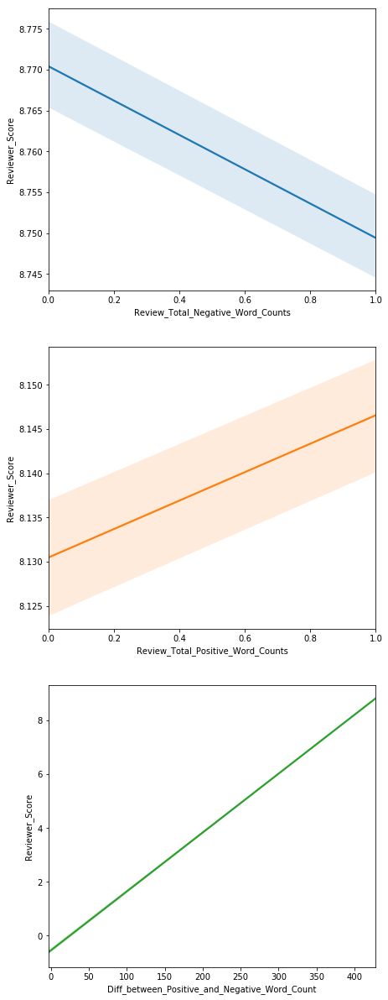

In [44]:
y=df_hotel_review["Reviewer_Score"]
x1 = df_hotel_review['Review_Total_Negative_Word_Counts'].apply(lambda x: x if x>0 else np.NaN)
x2 = df_hotel_review['Review_Total_Positive_Word_Counts'].apply(lambda x: x if x>0 else np.NaN)
# Since the maximum value of Negative review word count is 406, we added 410 to the difference of the word count
#    to have it positive.
x3 = df_hotel_review[['Review_Total_Negative_Word_Counts','Review_Total_Positive_Word_Counts']].apply(lambda x: 
                410 + x[1] - x[0] if x[1] > 0 or x[0]>0 else np.NaN , axis=1)
x3.name = 'Diff_between_Positive_and_Negative_Word_Count'
print("range of ", x1.name, " -> ", x1.min(), " to ",x1.max())
print("range of ", x2.name, " -> ", x2.min(), " to ",x2.max())
print("range of ", x3.name, " -> ", x3.min(), " to ",x3.max())
print("range of ", y.name, " -> ", y.min(), " to ",y.max())
fig, (ax1, ax2, ax3) = plt.subplots(nrows = 3 ,figsize=(7,21))
sns.regplot(x=x1,y=y,scatter = False, ax=ax1)
sns.regplot(x=x2,y=y,scatter = False, ax=ax2)
sns.regplot(x=x3,y=y,scatter = False, ax=ax3)
plt.show()

The above three plots proves that our theory regarding the relation of the number of words with the reviewer rating holds true.


The hotel reviews can be used by the hotel management to improve their ratings. If thats the case, then with time, the rating of the hotel should increase. To visualize this, we took the 10 hotels which were rated the most number of times in out dataset and plot the ratings with time to see if there is any difference.

In [45]:
df_10_hotels_reviewed_the_most = pd.DataFrame(df_hotel_review.groupby(['Hotel_ID'])['Reviewer_Score'].count())
df_10_hotels_reviewed_the_most.columns = ['Record Count']
df_10_hotels_reviewed_the_most.sort_values(by= 'Record Count', inplace=True, ascending=False)
df_10_hotels_reviewed_the_most = df_10_hotels_reviewed_the_most.head(10).reset_index()
df_10_hotels_reviewed_the_most

,Hotel_ID,Record Count
0,00187,4786
1,00487,4250
2,01481,4167
3,01272,3577
4,00690,3207
5,00014,2952
6,01493,2763
7,00325,2627
8,00498,2565
9,00026,2551


In [66]:
df_data_10_most_reviwed_hotels = pd.merge(df_hotel_review, df_10_hotels_reviewed_the_most, on=['Hotel_ID'])[['Hotel_ID', 'Hotel_Name', 'days_since_review', 'Reviewer_Score']]
df_data_10_most_reviwed_hotels.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 33445 entries, 0 to 33444
Data columns (total 4 columns):
Hotel_ID             33445 non-null object
Hotel_Name           33445 non-null object
days_since_review    33445 non-null int64
Reviewer_Score       33445 non-null float64
dtypes: float64(1), int64(1), object(2)
memory usage: 1.3+ MB


[('00498', 'Millennium Gloucester Hotel London')
 ('00487', 'Strand Palace Hotel')
 ('00690', 'DoubleTree by Hilton Hotel London Tower of London')
 ('01272', 'Copthorne Tara Hotel London Kensington')
 ('01493', 'Holiday Inn London Kensington')
 ('00026', 'Intercontinental London The O2')
 ('00325', 'Hilton London Metropole')
 ('00187', 'Britannia International Hotel Canary Wharf')
 ('00014', 'Grand Royale London Hyde Park')
 ('01481', 'Park Plaza Westminster Bridge London')]


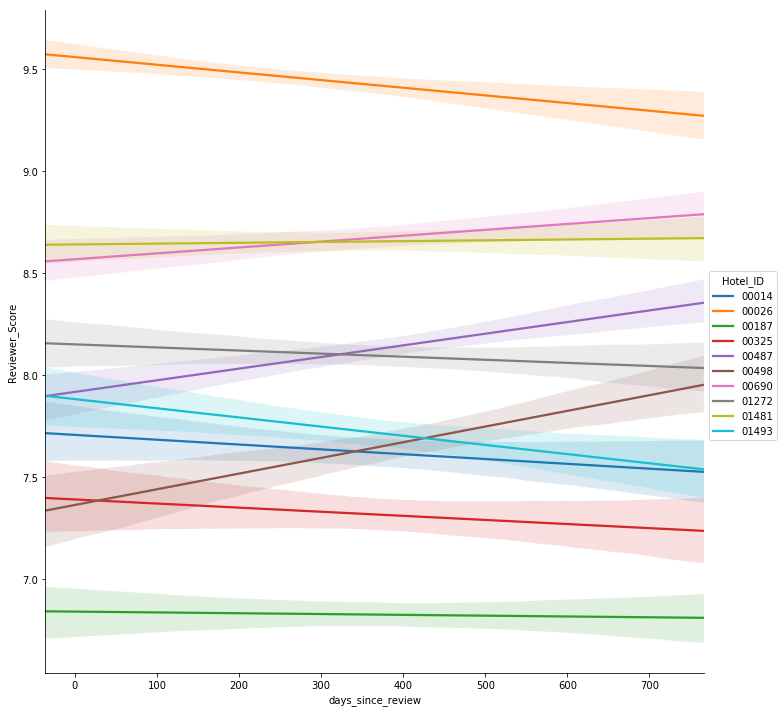

In [81]:
print(df_data_10_most_reviwed_hotels[['Hotel_ID','Hotel_Name']].drop_duplicates().to_records(index=False))
sns.lmplot(data=df_data_10_most_reviwed_hotels, hue='Hotel_ID', x='days_since_review', y = 'Reviewer_Score', scatter=False, size=10)

From the above graph, it appears that only for hotels 'Millennium Gloucester Hotel London', 'Strand Palace Hotel' and 'DoubleTree by Hilton Hotel London Tower of London', the ratings has increased with time. So it may be possible that the Hotel staff for these hotels are looking into the online reviews and are trying to improve on there services. 

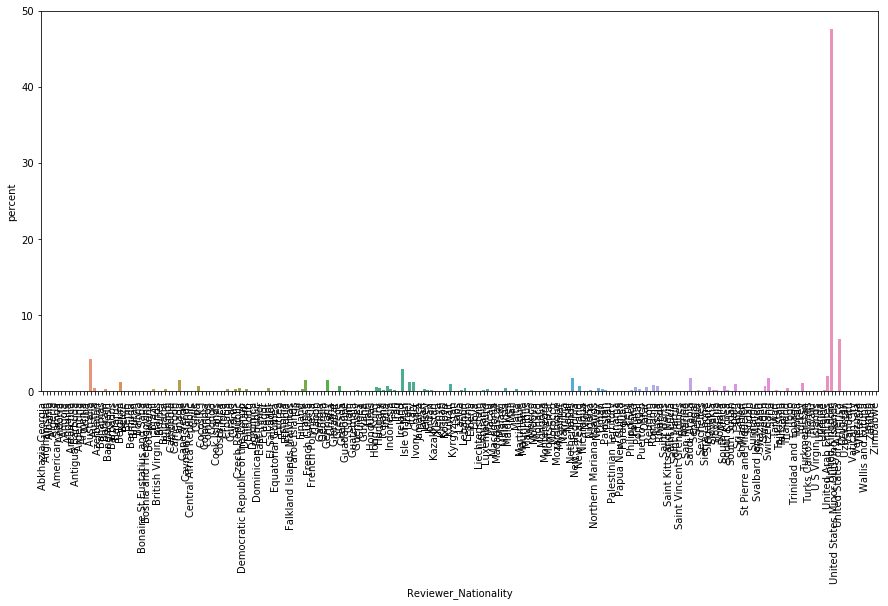

In [146]:
fig, ax = plt.subplots(figsize=(15,7))
for tick in ax.get_xticklabels():
    tick.set_rotation(90)
# sns.stripplot()
sns.barplot(x='Reviewer_Nationality', y ='Reviewer_Nationality', orient="v", data=df_hotel_review, 
            ax=ax, estimator = (lambda x: len(x)/len(df_hotel_review) * 100))
ax.set(ylabel='percent')

Since for most of the countries, the number of reviews made by reviewers is very less, we decided to drop those and just look into the reviews from those nationals which have more then 1% reviews.

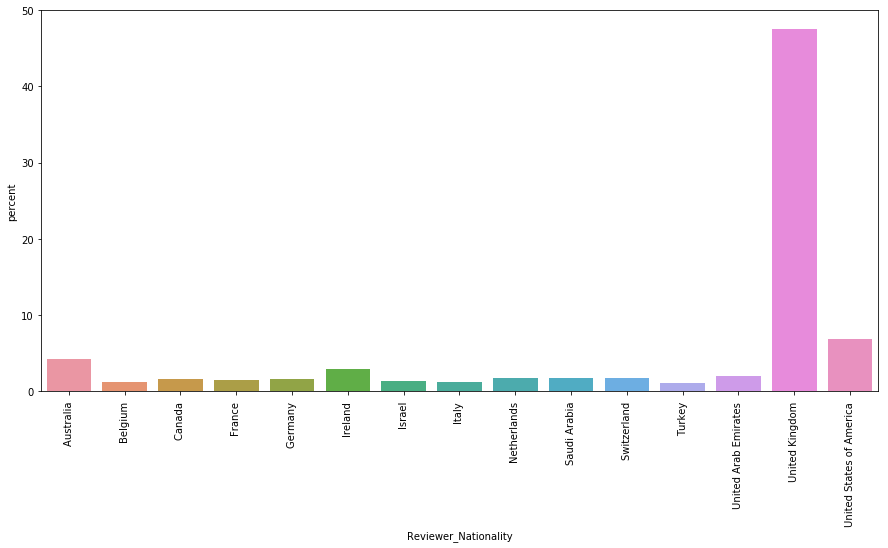

In [155]:
length = len(df_hotel_review)
df_count = pd.DataFrame(df_hotel_review.groupby(['Reviewer_Nationality']).count()['Additional_Number_of_Scoring']).reset_index(drop=False)
df_count = df_count[df_count['Additional_Number_of_Scoring'] > (0.01 * length)].reset_index(drop=True)
df_count.columns = ['Reviewer_Nationality','Count']
df_count.drop('Count', axis=1)
df_plot_df = pd.merge(df_hotel_review, df_count, on='Reviewer_Nationality').reset_index()
fig, ax = plt.subplots(figsize=(15,7))
for tick in ax.get_xticklabels():
    tick.set_rotation(90)
sns.barplot(x='Reviewer_Nationality', y ='Reviewer_Nationality', orient="v", data=df_plot_df, 
            ax=ax, estimator = (lambda x: len(x)/length * 100))
ax.set(ylabel='percent')

From the above graph, we found that most of the reviews were made by the tourists from UK followed by USA and Australia. UK percentage may be higher because its part of Europe so no visa required and its most developed country in Europe which means higher percentage of the population would be high internet users.


Since Graphlabs work on Python 2, export the final dataframe into csv format to import the cleaned data into python 2 and proceed with the modelling

In [113]:
df_hotel_review.to_csv("c:\df_hotel_review.csv")

# Modeling and Evaluation - Graphlab (Python 2)

In [3]:
#from mpl_toolkits.basemap import Basemap
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import graphlab as gl

<a id="Part4a"></a>
## Modeling and Evaluation 1

In [4]:
sf_hotel_review = gl.SFrame.read_csv('/Users/aravind/Downloads/df_hotel_review.csv')

[INFO] graphlab.cython.cy_server: GraphLab Create v2.1 started. Logging: /tmp/graphlab_server_1512958738.log


This non-commercial license of GraphLab Create for academic use is assigned to aveluchamy@smu.edu and will expire on December 03, 2018.


Finished parsing file /Users/aravind/Downloads/df_hotel_review.csv

Parsing completed. Parsed 100 lines in 1.25739 secs.

------------------------------------------------------
Inferred types from first 100 line(s) of file as 
column_type_hints=[int,int,str,float,str,str,int,int,str,int,int,float,list,int,int,str,str,float,float,int]
If parsing fails due to incorrect types, you can correct
the inferred type list above and pass it to read_csv in
the column_type_hints argument
------------------------------------------------------


Read 111649 lines. Lines per second: 51782.1

Finished parsing file /Users/aravind/Downloads/df_hotel_review.csv

Parsing completed. Parsed 515215 lines in 5.72248 secs.

In [10]:
train, test = gl.recommender.util.random_split_by_user(sf_hotel_review,user_id="User_ID", item_id="Hotel_ID",item_test_proportion=0.2)

In [6]:
sf_hotel_review.show()

Canvas is accessible via web browser at the URL: http://localhost:50854/index.html
Opening Canvas in default web browser.


### Explanation of Train and Split

The Train and Test datasets for cross validation has been created using a graphlab function recommender.util.random_split_by_user().This will be used for Training and Evalauting the different models.The training will be done on the 80% of the original dataset and testing will be carried out on the remaining 20%.There is a parameter called Maximum number of users in the recommender.util.random_split_by_user() for which we chose the default to include all  the  unique users(143,270) in the Original Dataset to perform the split in order for the Training Dataset to have adequate information about maximum number of users so that the recommendation System is as accurate as possible.

<a id="Part5a"></a>
## Modeling and Evaluation 2 -3
### Evaluation and Comparison of Item Similarity, Ranking Factorization and Popularity Recommender

We will first create an Item Similarity Recommender on the entire Sframe in order to see how the data behaves .We will examine the results using same parameters using k=5 because the mean number of reviews each reviewer has given is 7.17, so we will let each item keep 7 similar items and keep the similarity type as cosine. We wanted to show the top 5 results so K is set to 5 for the item_item model.

In [10]:
item_item = gl.recommender.item_similarity_recommender.create(sf_hotel_review, 
                                  user_id="User_ID", 
                                  item_id="Hotel_ID", 
                                  target="Reviewer_Score",
                                  only_top_k=7,
                                  similarity_type="cosine")

results = item_item.get_similar_items(k=5)
results.head()

recommendations finished on 9000/142655 queries. users per second: 12037.9

recommendations finished on 10000/142655 queries. users per second: 11962.5

recommendations finished on 11000/142655 queries. users per second: 11930.4

recommendations finished on 12000/142655 queries. users per second: 11947.2

recommendations finished on 13000/142655 queries. users per second: 12020.2

recommendations finished on 14000/142655 queries. users per second: 12011.4

recommendations finished on 15000/142655 queries. users per second: 12066.8

recommendations finished on 16000/142655 queries. users per second: 12127

recommendations finished on 17000/142655 queries. users per second: 12128.2

recommendations finished on 18000/142655 queries. users per second: 12077.5

recommendations finished on 19000/142655 queries. users per second: 12065.1

recommendations finished on 20000/142655 queries. users per second: 12049.2

recommendations finished on 21000/142655 queries. users per second: 12035.9

recommendations finished on 22000/142655 queries. users per second: 12021.8

recommendations finished on 23000/142655 queries. users per second: 12022

recommendations finished on 24000/142655 queries. users per second: 12029.1

recommendations finished on 25000/142655 queries. users per second: 12035.9

recommendations finished on 26000/142655 queries. users per second: 12041.6

recommendations finished on 27000/142655 queries. users per second: 12069

recommendations finished on 28000/142655 queries. users per second: 12083.2

recommendations finished on 29000/142655 queries. users per second: 12108.9

recommendations finished on 30000/142655 queries. users per second: 12101.4

recommendations finished on 31000/142655 queries. users per second: 12088.1

recommendations finished on 32000/142655 queries. users per second: 12096.4

recommendations finished on 33000/142655 queries. users per second: 12078.8

recommendations finished on 34000/142655 queries. users per second: 12053

recommendations finished on 35000/142655 queries. users per second: 12027.3

recommendations finished on 36000/142655 queries. users per second: 11986.5

recommendations finished on 37000/142655 queries. users per second: 11944.4

recommendations finished on 38000/142655 queries. users per second: 11908.7

recommendations finished on 39000/142655 queries. users per second: 11887.2

recommendations finished on 40000/142655 queries. users per second: 11874.5

recommendations finished on 41000/142655 queries. users per second: 11857.1

recommendations finished on 42000/142655 queries. users per second: 11847.1

recommendations finished on 43000/142655 queries. users per second: 11830.7

recommendations finished on 44000/142655 queries. users per second: 11832

recommendations finished on 45000/142655 queries. users per second: 11828.3

recommendations finished on 46000/142655 queries. users per second: 11837.9

recommendations finished on 47000/142655 queries. users per second: 11841.2

recommendations finished on 48000/142655 queries. users per second: 11830.7

recommendations finished on 49000/142655 queries. users per second: 11817.1

recommendations finished on 50000/142655 queries. users per second: 11784.7

recommendations finished on 51000/142655 queries. users per second: 11773.6

recommendations finished on 52000/142655 queries. users per second: 11763.9

recommendations finished on 53000/142655 queries. users per second: 11760.6

recommendations finished on 54000/142655 queries. users per second: 11751.4

recommendations finished on 55000/142655 queries. users per second: 11747.4

recommendations finished on 56000/142655 queries. users per second: 11743.4

recommendations finished on 57000/142655 queries. users per second: 11735.4

recommendations finished on 58000/142655 queries. users per second: 11716.3

recommendations finished on 59000/142655 queries. users per second: 11708.2

recommendations finished on 60000/142655 queries. users per second: 11697.5

recommendations finished on 61000/142655 queries. users per second: 11685.5

recommendations finished on 62000/142655 queries. users per second: 11681.2

recommendations finished on 63000/142655 queries. users per second: 11681.2

recommendations finished on 64000/142655 queries. users per second: 11677.8

recommendations finished on 65000/142655 queries. users per second: 11675.7

recommendations finished on 66000/142655 queries. users per second: 11658

recommendations finished on 67000/142655 queries. users per second: 11627.9

recommendations finished on 68000/142655 queries. users per second: 11620.3

recommendations finished on 69000/142655 queries. users per second: 11614.3

recommendations finished on 70000/142655 queries. users per second: 11613.6

recommendations finished on 71000/142655 queries. users per second: 11615.2

recommendations finished on 72000/142655 queries. users per second: 11605

recommendations finished on 73000/142655 queries. users per second: 11595.8

recommendations finished on 74000/142655 queries. users per second: 11588.2

recommendations finished on 75000/142655 queries. users per second: 11581.9

recommendations finished on 76000/142655 queries. users per second: 11573

recommendations finished on 77000/142655 queries. users per second: 11564.2

recommendations finished on 78000/142655 queries. users per second: 11556.2

recommendations finished on 79000/142655 queries. users per second: 11524.1

recommendations finished on 80000/142655 queries. users per second: 11503.5

recommendations finished on 81000/142655 queries. users per second: 11487.6

recommendations finished on 82000/142655 queries. users per second: 11471.6

recommendations finished on 83000/142655 queries. users per second: 11464.1

recommendations finished on 84000/142655 queries. users per second: 11456.2

recommendations finished on 85000/142655 queries. users per second: 11449.8

recommendations finished on 86000/142655 queries. users per second: 11431.4

recommendations finished on 87000/142655 queries. users per second: 11417.4

recommendations finished on 88000/142655 queries. users per second: 11401.9

recommendations finished on 89000/142655 queries. users per second: 11398.6

recommendations finished on 90000/142655 queries. users per second: 11384.1

recommendations finished on 91000/142655 queries. users per second: 11370

recommendations finished on 92000/142655 queries. users per second: 11344.1

recommendations finished on 93000/142655 queries. users per second: 11335.6

recommendations finished on 94000/142655 queries. users per second: 11331.5

recommendations finished on 95000/142655 queries. users per second: 11324.5

recommendations finished on 96000/142655 queries. users per second: 11320.2

recommendations finished on 97000/142655 queries. users per second: 11315

recommendations finished on 98000/142655 queries. users per second: 11307.1

recommendations finished on 99000/142655 queries. users per second: 11291.7

recommendations finished on 100000/142655 queries. users per second: 11287.5

recommendations finished on 101000/142655 queries. users per second: 11268.4

recommendations finished on 102000/142655 queries. users per second: 11260.9

recommendations finished on 103000/142655 queries. users per second: 11250.5

recommendations finished on 104000/142655 queries. users per second: 11236.7

recommendations finished on 105000/142655 queries. users per second: 11218.9

recommendations finished on 106000/142655 queries. users per second: 11192.8

recommendations finished on 107000/142655 queries. users per second: 11169.4

recommendations finished on 108000/142655 queries. users per second: 11153.6

recommendations finished on 109000/142655 queries. users per second: 11145.4

recommendations finished on 110000/142655 queries. users per second: 11134.2

recommendations finished on 111000/142655 queries. users per second: 11118.7

recommendations finished on 112000/142655 queries. users per second: 11110

recommendations finished on 113000/142655 queries. users per second: 11095.8

recommendations finished on 114000/142655 queries. users per second: 11088.8

recommendations finished on 115000/142655 queries. users per second: 11081.4

recommendations finished on 116000/142655 queries. users per second: 11072.9

recommendations finished on 117000/142655 queries. users per second: 11064.3

recommendations finished on 118000/142655 queries. users per second: 11051.2

recommendations finished on 119000/142655 queries. users per second: 11042.1

recommendations finished on 120000/142655 queries. users per second: 11022.7

recommendations finished on 121000/142655 queries. users per second: 11001.3

recommendations finished on 122000/142655 queries. users per second: 10987.6

recommendations finished on 123000/142655 queries. users per second: 10972.6

recommendations finished on 124000/142655 queries. users per second: 10952.7

recommendations finished on 125000/142655 queries. users per second: 10938.6

recommendations finished on 126000/142655 queries. users per second: 10927.6

recommendations finished on 127000/142655 queries. users per second: 10908.6

recommendations finished on 128000/142655 queries. users per second: 10896.6

recommendations finished on 129000/142655 queries. users per second: 10880.5

recommendations finished on 130000/142655 queries. users per second: 10862.7

recommendations finished on 131000/142655 queries. users per second: 10850.3

recommendations finished on 132000/142655 queries. users per second: 10835.9

recommendations finished on 133000/142655 queries. users per second: 10824.2

recommendations finished on 134000/142655 queries. users per second: 10809.4

recommendations finished on 135000/142655 queries. users per second: 10796.3

recommendations finished on 136000/142655 queries. users per second: 10784.5

recommendations finished on 137000/142655 queries. users per second: 10767.2

recommendations finished on 138000/142655 queries. users per second: 10739.6

recommendations finished on 139000/142655 queries. users per second: 10715.8

recommendations finished on 140000/142655 queries. users per second: 10684.5

recommendations finished on 141000/142655 queries. users per second: 10628.8

recommendations finished on 142000/142655 queries. users per second: 10507.4

Recsys training: model = item_similarity

Warning: Ignoring columns X1, Additional_Number_of_Scoring, Review_Date, Average_Score, Reviewer_Nationality, Negative_Review, Review_Total_Negative_Word_Counts, Total_Number_of_Reviews, Positive_Review, Review_Total_Positive_Word_Counts, Total_Number_of_Reviews_Reviewer_Has_Given, Tags, days_since_review, Hotel_Name, Hotel_Address, lat, lng;

To use these columns in scoring predictions, use a model that allows the use of additional features.

Preparing data set.

Data has 515215 observations with 142655 users and 1494 items.

Data prepared in: 0.458551s

Training model from provided data.

Gathering per-item and per-user statistics.

+--------------------------------+------------+

| Elapsed Time (Item Statistics) | % Complete |

+--------------------------------+------------+

| 1.272ms                        | 11.75      |

| 26.462ms                       | 100        |

+--------------------------------+------------+

Setting up lookup tables.

Processing data in one pass using dense lookup tables.

+-------------------------------------+------------------+-----------------+

| Elapsed Time (Constructing Lookups) | Total % Complete | Items Processed |

+-------------------------------------+------------------+-----------------+

| 34.831ms                            | 0                | 0               |

| 87.319ms                            | 100              | 1494            |

+-------------------------------------+------------------+-----------------+

Finalizing lookup tables.

Generating candidate set for working with new users.

Finished training in 0.127885s

Hotel_ID,similar,score,rank
1,2,0.133329808712,1
1,3,0.0896713137627,2
1,4,0.083836376667,3
1,7,0.0501026511192,4
1,13,0.0413222908974,5
25,24,0.112155914307,1
25,26,0.0768604874611,2
25,19,0.0560061335564,3
25,23,0.0446230173111,4
25,28,0.0419268608093,5


In [13]:
print rmse_results.viewkeys()

dict_keys(['rmse_by_user', 'precision_recall_overall', 'rmse_by_item', 'precision_recall_by_user', 'rmse_overall'])


In [14]:
rmse_results['rmse_by_item']

Hotel_ID,count,rmse
232,1,7.5973096558
187,7,5.65306490827
1180,2,9.47177316971
1323,2,7.5974460151
614,1,6.9
1158,1,8.3
1072,1,10.0
695,1,8.16587768793
454,3,8.41933679859
1211,1,7.9


In [15]:
rmse_results['rmse_by_user']

User_ID,count,rmse
55604,3,8.35030769086
44185,2,6.21592120327
126306,2,8.17280191572
39048,2,7.14492827116
23002,1,9.2
11637,2,8.93916670586
10801,4,8.562397938
43224,1,9.99824269891
36660,1,7.28469141722
124544,1,10.0


In [16]:
rmse_results['precision_recall_by_user']

User_ID,cutoff,precision,recall,count
406,1,0.0,0.0,1
406,2,0.0,0.0,1
406,3,0.0,0.0,1
406,4,0.0,0.0,1
406,5,0.0,0.0,1
406,6,0.0,0.0,1
406,7,0.0,0.0,1
406,8,0.0,0.0,1
406,9,0.0,0.0,1
406,10,0.0,0.0,1


### Vizualization A - Below is the average precision and recall per user at given cutoffs, and how they vary.

In [19]:
import graphlab.aggregate as agg

agg_list = [agg.AVG('precision'),agg.STD('precision'),agg.AVG('recall'),agg.STD('recall')]

rmse_results['precision_recall_by_user'].groupby('cutoff',agg_list)


cutoff,Avg of precision,Stdv of precision,Avg of recall,Stdv of recall
16,0.0153487229862,0.0313789767217,0.161186734026,0.33807389059
10,0.0218074656189,0.0470742658589,0.152556366358,0.336347260841
36,0.00785854616896,0.015537950434,0.175219852184,0.34709262592
26,0.0102765603748,0.0207158260404,0.168834783422,0.342980644257
41,0.00699602280895,0.0139338321937,0.17572589493,0.347410343463
3,0.0386378519974,0.106707077517,0.0888366545046,0.267467188291
1,0.0530451866405,0.224123615031,0.0363808588268,0.172427319902
6,0.030124426981,0.0666385485507,0.131960426607,0.316589211471
11,0.0201821753885,0.0430067008769,0.154193563476,0.336655197284
2,0.0461689587426,0.144751188665,0.0704345588923,0.240304386302


### Vizualization B - RMSE by Reviewer and Hotel

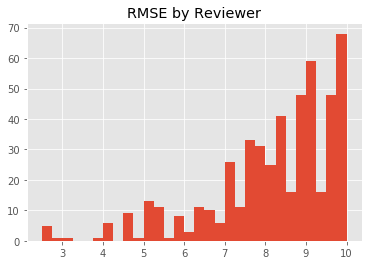

In [17]:
from matplotlib import pyplot as plt
%matplotlib inline
plt.style.use('ggplot')

rmsevals = rmse_results['rmse_by_user']['rmse']
rmsevals = rmsevals[rmse_results['rmse_by_user']['count']>0]

plt.hist(rmsevals,bins=30)
plt.title('RMSE by Reviewer')
plt.show()

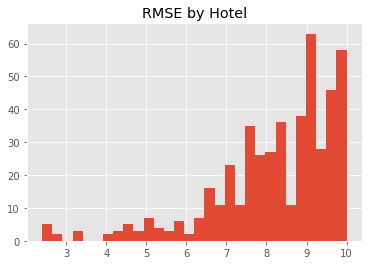

In [18]:
rmsevals = rmse_results['rmse_by_item']['rmse']
rmsevals = rmsevals[rmse_results['rmse_by_item']['count']>0]

plt.hist(rmsevals,bins=30)
plt.title('RMSE by Hotel')
plt.show()

the Item-Item Model using item_similarity_recommender 
The first run above uses the Item Similarity Model. Observation of the histogram of RMSE by Reviewer and by Hotel above is showing left skew with the majority of the high RMSE values between 7.5 and 10 on a reviewer scale of 10. This indicates that the model is not a good recommendation model if basing the evaluation on RMSE alone. 

Another set of metrics of interest are the per user precision and the per user recall. Per user precision here means that of all the items rated by each user, how many did the recommender find? Per user recall here means that of the number of items that the recomender suggests, how many were rated positively by the user? Above we are looking at the average value at every cut-off. We see for example that from a cutoff range of 1 to 36, our average precision is about 1 to 4% and our average recall is about 3 to 18%. This means for example that on the average, at 11 suggested hotels, the item item recommender only found 2% of the hotels rated by the users. However of the 11 hotels suggested by the item item recommender, 16% were rated positively by the users (2 hotels out of 11). Still not a very good model if basing it by aggregate ave precision and recall grouped by cutoffs.  

Just as an experiment (to understand graphlab models a little more), we were curious whether or not the above results would change if we trimmed the dataset down to only contain the target "Reviewer Score", "User_ID" and "Hotel_ID".  It didn't make much difference in terms of the RMSE outputs and Precision and Recall outputs, so we decided to stick with the full dataset with 20 attributes.

 ## Cross Validated Collaborative Filtering for Item Similarity  Recommender

Next we will be running the item similarity recommender along with cross validation using the Train and Test Data.

In [14]:
from IPython.display import display
from IPython.display import Image

gl.canvas.set_target('ipynb')


item_item = gl.recommender.item_similarity_recommender.create(train, 
                                  user_id="User_ID", 
                                  item_id="Hotel_ID", 
                                  target="Reviewer_Score",
                                  only_top_k=5,
                                  similarity_type="cosine")

rmse_results_item = item_item.evaluate(test)


Recsys training: model = item_similarity

Warning: Ignoring columns X1, Additional_Number_of_Scoring, Review_Date, Average_Score, Reviewer_Nationality, Negative_Review, Review_Total_Negative_Word_Counts, Total_Number_of_Reviews, Positive_Review, Review_Total_Positive_Word_Counts, Total_Number_of_Reviews_Reviewer_Has_Given, Tags, days_since_review, Hotel_Name, Hotel_Address, lat, lng;

To use these columns in scoring predictions, use a model that allows the use of additional features.

Preparing data set.

Data has 514451 observations with 142648 users and 1494 items.

Data prepared in: 1.23158s

Training model from provided data.

Gathering per-item and per-user statistics.

+--------------------------------+------------+

| Elapsed Time (Item Statistics) | % Complete |

+--------------------------------+------------+

| 16.317ms                       | 0.5        |

| 98.191ms                       | 100        |

+--------------------------------+------------+

Setting up lookup tables.

Processing data in one pass using dense lookup tables.

+-------------------------------------+------------------+-----------------+

| Elapsed Time (Constructing Lookups) | Total % Complete | Items Processed |

+-------------------------------------+------------------+-----------------+

| 118.28ms                            | 0                | 0               |

| 334.474ms                           | 100              | 1494            |

+-------------------------------------+------------------+-----------------+

Finalizing lookup tables.

Generating candidate set for working with new users.

Finished training in 0.438675s


Precision and recall summary statistics by cutoff
+--------+-----------------+-----------------+
| cutoff |  mean_precision |   mean_recall   |
+--------+-----------------+-----------------+
|   1    | 0.0530451866405 | 0.0363808588268 |
|   2    | 0.0461689587426 | 0.0704345588923 |
|   3    | 0.0386378519974 | 0.0888366545046 |
|   4    | 0.0358546168959 |  0.108974179063 |
|   5    | 0.0333988212181 |  0.125084198709 |
|   6    |  0.030124426981 |  0.131960426607 |
|   7    |  0.026943586865 |  0.136937505847 |
|   8    | 0.0252946954813 |  0.145188979325 |
|   9    | 0.0231390526086 |  0.14829965385  |
|   10   | 0.0218074656189 |  0.152556366358 |
+--------+-----------------+-----------------+
[10 rows x 3 columns]

('\nOverall RMSE: ', 8.347975481866307)

Per User RMSE (best)
+---------+-------+------+
| User_ID | count | rmse |
+---------+-------+------+
|  56829  |   1   | 2.5  |
+---------+-------+------+
[1 rows x 3 columns]


Per User RMSE (worst)
+---------+-------+------+

## Cross Validated Collaborative Filtering for Ranking Factorization Recommender

Next we look at the Ranking Factorization Recommender model with the same parameters as the item item model. We will primarily be looking at the per user precision and recall average outputs aggregated at the same cutoffs as the prior item item model above and make a comparison to see if the Ranking Factorization Recommender performs better with the same Hotel Review dataset. In this model we have hidden factors in the algorithm that represent the user factor matrix and the factor item matrix. We use the default parameters at this run.

In [20]:
rec1 = gl.recommender.ranking_factorization_recommender.create(train, 
                                  user_id="User_ID", 
                                  item_id="Hotel_ID", 
                                  target="Reviewer_Score")

rmse_results_factor = rec1.evaluate(test)

Recsys training: model = ranking_factorization_recommender

Preparing data set.

Data has 514451 observations with 142648 users and 1494 items.

Data prepared in: 5.82445s

Training ranking_factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 32       |

| regularization                 | L2 Regularization on Factors                     | 1e-09    |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1e-09    |

| ranking_regularization         | Rank-based Regularization Weight                 | 0.25     |

| max_iterations                 | Maximum Number of Iterations                     | 25       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 64306 / 514451 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.63158           | Not Viable                               |

| 1       | 0.657895          | Not Viable                               |

| 2       | 0.164474          | 1.52822                                  |

| 3       | 0.0822368         | 1.1058                                   |

| 4       | 0.0411184         | 2.4653                                   |

+---------+-------------------+------------------------------------------+

| Final   | 0.0822368         | 1.1058                                   |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 240us        | 5.25767           | 1.63746               |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 7.52s        | 4.2256            | 1.60395               | 0.0822368   |

| 2       | 14.46s       | 1.79671           | 1.06912               | 0.0822368   |

| 3       | 20.11s       | 0.770286          | 0.694813              | 0.0822368   |

| 4       | 25.45s       | 0.412407          | 0.51437               | 0.0822368   |

| 5       | 29.81s       | 0.261178          | 0.415859              | 0.0822368   |

| 6       | 34.52s       | 0.184356          | 0.353552              | 0.0822368   |

| 7       | 39.18s       | 0.141191          | 0.312635              | 0.0822368   |

| 8       | 44.00s       | 0.113673          | 0.283691              | 0.0822368   |

| 9       | 49.06s       | 0.0941774         | 0.259486              | 0.0822368   |

| 10      | 54.80s       | 0.0773926         | 0.237129              | 0.0822368   |

| 11      | 1m 0s        | 0.0668479         | 0.220458              | 0.0822368   |

| 12      | 1m 5s        | 0.0577805         | 0.20706               | 0.0822368   |

| 13      | 1m 11s       | 0.0535909         | 0.20044               | 0.0822368   |

| 14      | 1m 16s       | 0.0498205         | 0.195095              | 0.0822368   |

| 15      | 1m 21s       | 0.0465792         | 0.190096              | 0.0822368   |

| 16      | 1m 26s       | 0.0448232         | 0.188391              | 0.0822368   |

| 17      | 1m 32s       | 0.0445816         | 0.189125              | 0.0822368   |

| 18      | 1m 38s       | 0.0433712         | 0.188342              | 0.0822368   |

| 19      | 1m 44s       | 0.04263           | 0.188084              | 0.0822368   |

| 20      | 1m 48s       | 0.0420093         | 0.187009              | 0.0822368   |

| 21      | 1m 53s       | 0.0404507         | 0.184465              | 0.0822368   |

| 22      | 1m 57s       | 0.0405329         | 0.185573              | 0.0822368   |

| 23      | 2m 2s        | 0.0405883         | 0.186323              | 0.0822368   |

| 24      | 2m 7s        | 0.0402811         | 0.18637               | 0.0822368   |

| 25      | 2m 12s       | 0.0397241         | 0.184959              | 0.0822368   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.0404866

Final training RMSE: 0.188624


Precision and recall summary statistics by cutoff
+--------+-------------------+-------------------+
| cutoff |   mean_precision  |    mean_recall    |
+--------+-------------------+-------------------+
|   1    |  0.00196463654224 | 0.000654878847413 |
|   2    |  0.00098231827112 | 0.000654878847413 |
|   3    |  0.00130975769483 |  0.00098231827112 |
|   4    |  0.00098231827112 |  0.00098231827112 |
|   5    | 0.000785854616896 |  0.00098231827112 |
|   6    |  0.00098231827112 |  0.00294695481336 |
|   7    | 0.000841987089531 |  0.00294695481336 |
|   8    |  0.0012278978389  |  0.00687622789784 |
|   9    |  0.00109146474569 |  0.00687622789784 |
|   10   |  0.00117878192534 |  0.00785854616896 |
+--------+-------------------+-------------------+
[10 rows x 3 columns]

('\nOverall RMSE: ', 1.517551069097725)

Per User RMSE (best)
+---------+-------+----------------+
| User_ID | count |      rmse      |
+---------+-------+----------------+
|  38284  |   1   | 0.013821881447 |
+-

In [21]:
rmse_results['precision_recall_by_user'].groupby('cutoff',[agg.AVG('precision'),agg.STD('precision'),agg.AVG('recall'),agg.STD('recall')])

cutoff,Avg of precision,Stdv of precision,Avg of recall,Stdv of recall
16,0.00110510805501,0.00823698911162,0.0109692206942,0.0940389835192
10,0.00117878192534,0.0107929915087,0.00785854616896,0.0812168590923
36,0.000927745033835,0.00528600331558,0.0187809898026,0.120262517187
26,0.000906755327188,0.00631391588613,0.0130975769483,0.100304214612
41,0.00105419521779,0.00541069998114,0.0248386191412,0.138585483143
3,0.00130975769483,0.0208535472536,0.00098231827112,0.0164894280446
1,0.00196463654224,0.0442806588196,0.000654878847413,0.0147602196065
6,0.00098231827112,0.0127575374845,0.00294695481336,0.0472103610025
11,0.00107161993213,0.00981181046245,0.00785854616896,0.0812168590923
2,0.00098231827112,0.0221403294098,0.000654878847413,0.0147602196065


#### Average Precision and Recall aggregates at given cutoffs of the Ranking Factorization model.
As can be seen above, from a range of cutoffs of 1 to 36, the average precision is from .09 to a high of .19%. The average recall ranges from .06 to 2.4%. This is worse compared to the same aggregate outputs of the item item model which were 1 to 4% average precision and 3 to 18% average recall.

Next we are adjusting the number of factors parameters and the regularization for interaction terms and linear regularization for for linear term. We try 35 factors and default values le-10 for regularization parameters and make a comparixon of the item item and ranking factorization recommender models. 

In [12]:
rec1 = gl.recommender.ranking_factorization_recommender.create(train, 
                                  user_id="User_ID", 
                                  item_id="Hotel_ID", 
                                  target="Reviewer_Score",
                                  num_factors=35,                 # override the default value
                                  regularization=1e-10,           # override the default value
                                  linear_regularization = 1e-10)   # override the default value

rmse_results_factor2 = rec1.evaluate(test)

Recsys training: model = ranking_factorization_recommender

Preparing data set.

Data has 514451 observations with 142648 users and 1494 items.

Data prepared in: 5.95644s

Training ranking_factorization_recommender for recommendations.

+--------------------------------+--------------------------------------------------+----------+

| Parameter                      | Description                                      | Value    |

+--------------------------------+--------------------------------------------------+----------+

| num_factors                    | Factor Dimension                                 | 35       |

| regularization                 | L2 Regularization on Factors                     | 1e-10    |

| solver                         | Solver used for training                         | adagrad  |

| linear_regularization          | L2 Regularization on Linear Coefficients         | 1e-10    |

| ranking_regularization         | Rank-based Regularization Weight                 | 0.25     |

| max_iterations                 | Maximum Number of Iterations                     | 25       |

+--------------------------------+--------------------------------------------------+----------+

Optimizing model using SGD; tuning step size.

Using 64306 / 514451 points for tuning the step size.

+---------+-------------------+------------------------------------------+

| Attempt | Initial Step Size | Estimated Objective Value                |

+---------+-------------------+------------------------------------------+

| 0       | 2.63158           | Not Viable                               |

| 1       | 0.657895          | Not Viable                               |

| 2       | 0.164474          | 1.50516                                  |

| 3       | 0.0822368         | Not Viable                               |

| 4       | 0.0205592         | 3.29864                                  |

+---------+-------------------+------------------------------------------+

| Final   | 0.164474          | 1.50516                                  |

+---------+-------------------+------------------------------------------+

Starting Optimization.

+---------+--------------+-------------------+-----------------------+-------------+

| Iter.   | Elapsed Time | Approx. Objective | Approx. Training RMSE | Step Size   |

+---------+--------------+-------------------+-----------------------+-------------+

| Initial | 172us        | 5.25726           | 1.63762               |             |

+---------+--------------+-------------------+-----------------------+-------------+

| 1       | 10.45s       | DIVERGED          | DIVERGED              | 0.164474    |

| RESET   | 13.88s       | 5.25794           | 1.63785               |             |

| 1       | 27.02s       | DIVERGED          | DIVERGED              | 0.0822368   |

| RESET   | 31.35s       | 5.25802           | 1.6377                |             |

| 1       | 39.56s       | 3.72481           | 1.52661               | 0.0411184   |

| 2       | 48.58s       | 1.53854           | 0.975059              | 0.0411184   |

| 3       | 55.54s       | 0.627068          | 0.589616              | 0.0411184   |

| 4       | 1m 1s        | 0.302592          | 0.394159              | 0.0411184   |

| 5       | 1m 8s        | 0.174788          | 0.292869              | 0.0411184   |

| 6       | 1m 13s       | 0.118515          | 0.242213              | 0.0411184   |

| 7       | 1m 19s       | 0.083622          | 0.200276              | 0.0411184   |

| 8       | 1m 25s       | 0.0633216         | 0.173137              | 0.0411184   |

| 9       | 1m 31s       | 0.0505937         | 0.156757              | 0.0411184   |

| 10      | 1m 36s       | 0.043224          | 0.14647               | 0.0411184   |

| 11      | 1m 42s       | 0.0373981         | 0.139639              | 0.0411184   |

| 12      | 1m 48s       | 0.0324958         | 0.131755              | 0.0411184   |

| 13      | 1m 55s       | 0.0291369         | 0.125375              | 0.0411184   |

| 14      | 2m 0s        | 0.0252083         | 0.116891              | 0.0411184   |

| 15      | 2m 6s        | 0.0224428         | 0.111404              | 0.0411184   |

| 16      | 2m 13s       | 0.0207098         | 0.107589              | 0.0411184   |

| 17      | 2m 19s       | 0.0190046         | 0.103994              | 0.0411184   |

| 18      | 2m 25s       | 0.017399          | 0.10055               | 0.0411184   |

| 19      | 2m 30s       | 0.0161983         | 0.0970011             | 0.0411184   |

| 20      | 2m 36s       | 0.0155143         | 0.0963077             | 0.0411184   |

| 21      | 2m 41s       | 0.015096          | 0.0964225             | 0.0411184   |

| 22      | 2m 47s       | 0.014872          | 0.0984316             | 0.0411184   |

| 23      | 2m 54s       | 0.0145502         | 0.0994356             | 0.0411184   |

| 24      | 3m 0s        | 0.0131745         | 0.0937583             | 0.0411184   |

| 25      | 3m 6s        | 0.0130649         | 0.0940035             | 0.0411184   |

+---------+--------------+-------------------+-----------------------+-------------+

Optimization Complete: Maximum number of passes through the data reached.

Computing final objective value and training RMSE.

Final objective value: 0.0124086

Final training RMSE: 0.0926048


Precision and recall summary statistics by cutoff
+--------+------------------+------------------+
| cutoff |  mean_precision  |   mean_recall    |
+--------+------------------+------------------+
|   1    |       0.0        |       0.0        |
|   2    | 0.00294695481336 | 0.00294695481336 |
|   3    | 0.00196463654224 | 0.00294695481336 |
|   4    | 0.00196463654224 | 0.00392927308448 |
|   5    | 0.00157170923379 | 0.00392927308448 |
|   6    | 0.00130975769483 | 0.00392927308448 |
|   7    | 0.00112264945271 | 0.00392927308448 |
|   8    | 0.00147347740668 | 0.00459903554206 |
|   9    | 0.00152805064396 | 0.00525391438947 |
|   10   | 0.00137524557957 | 0.00525391438947 |
+--------+------------------+------------------+
[10 rows x 3 columns]

('\nOverall RMSE: ', 1.675325007747328)

Per User RMSE (best)
+---------+-------+------------------+
| User_ID | count |       rmse       |
+---------+-------+------------------+
|  125669 |   1   | 0.00182398118822 |
+---------+-------+---

## Cross Validated Collaborative Filtering for Popularity Recommender Model

Create a model that makes recommendations using item popularity rankings based on the mean value of Target which is Reviewer Score in this case. 

In [20]:
pop_rec = gl.recommender.popularity_recommender.create(train, 
                                  user_id="User_ID", 
                                  item_id="Hotel_ID", 
                                  target="Reviewer_Score",
                                  verbose=False)

result_content_pop = pop_rec.evaluate(test)

Recsys training: model = popularity


Precision and recall summary statistics by cutoff
+--------+-------------------+-------------------+
| cutoff |   mean_precision  |    mean_recall    |
+--------+-------------------+-------------------+
|   1    |        0.0        |        0.0        |
|   2    |        0.0        |        0.0        |
|   3    |        0.0        |        0.0        |
|   4    |        0.0        |        0.0        |
|   5    |        0.0        |        0.0        |
|   6    |        0.0        |        0.0        |
|   7    |        0.0        |        0.0        |
|   8    |  0.00024557956778 | 0.000654878847413 |
|   9    | 0.000218292949138 | 0.000654878847413 |
|   10   | 0.000196463654224 | 0.000654878847413 |
+--------+-------------------+-------------------+
[10 rows x 3 columns]

('\nOverall RMSE: ', 1.5437127808447002)

Per User RMSE (best)
+---------+-------+-------+
| User_ID | count |  rmse |
+---------+-------+-------+
|  81954  |   1   | 0.002 |
+---------+-------+-------+
[1 rows x

## Comparison of Item Similarity (M0) Model versus Ranking Factorization (M1) Model versus Popularity Recommender (M2) Model.

In [22]:
comparison = gl.recommender.util.compare_models(test, [item_item, rec1,pop_rec])

PROGRESS: Evaluate model M0

Precision and recall summary statistics by cutoff
+--------+-----------------+-----------------+
| cutoff |  mean_precision |   mean_recall   |
+--------+-----------------+-----------------+
|   1    | 0.0530451866405 | 0.0363808588268 |
|   2    | 0.0461689587426 | 0.0704345588923 |
|   3    | 0.0386378519974 | 0.0888366545046 |
|   4    | 0.0358546168959 |  0.108974179063 |
|   5    | 0.0333988212181 |  0.125084198709 |
|   6    |  0.030124426981 |  0.131960426607 |
|   7    |  0.026943586865 |  0.136937505847 |
|   8    | 0.0252946954813 |  0.145188979325 |
|   9    | 0.0231390526086 |  0.14829965385  |
|   10   | 0.0218074656189 |  0.152556366358 |
+--------+-----------------+-----------------+
[10 rows x 3 columns]

('\nOverall RMSE: ', 8.347975481866307)

Per User RMSE (best)
+---------+-------+------+
| User_ID | count | rmse |
+---------+-------+------+
|  56829  |   1   | 2.5  |
+---------+-------+------+
[1 rows x 3 columns]


Per User RMSE (worst

In [23]:
 comparisonstruct = gl.compare(test,[item_item, rec1,pop_rec])

PROGRESS: Evaluate model M0

Precision and recall summary statistics by cutoff
+--------+-----------------+-----------------+
| cutoff |  mean_precision |   mean_recall   |
+--------+-----------------+-----------------+
|   1    | 0.0530451866405 | 0.0363808588268 |
|   2    | 0.0461689587426 | 0.0704345588923 |
|   3    | 0.0386378519974 | 0.0888366545046 |
|   4    | 0.0358546168959 |  0.108974179063 |
|   5    | 0.0333988212181 |  0.125084198709 |
|   6    |  0.030124426981 |  0.131960426607 |
|   7    |  0.026943586865 |  0.136937505847 |
|   8    | 0.0252946954813 |  0.145188979325 |
|   9    | 0.0231390526086 |  0.14829965385  |
|   10   | 0.0218074656189 |  0.152556366358 |
+--------+-----------------+-----------------+
[10 rows x 3 columns]

PROGRESS: Evaluate model M1

Precision and recall summary statistics by cutoff
+--------+------------------+------------------+
| cutoff |  mean_precision  |   mean_recall    |
+--------+------------------+------------------+
|   1    |    

In [24]:
# The graph submitted by the below statement requires the code to execute. Its not imported by the notebook.
#  So we have created the image of the graph and included the graph from the image in the code following this statement.
gl.show_comparison(comparisonstruct,[item_item, rec1,pop_rec])

Please run the code below to include the graph. The impage is submitted as a part of our submission.

In [1]:
%%HTML
<iframe width='100%' height=500, src='Cross Validation.jpeg'></iframe>

## Inference from the Precision Recall Curve 
In the above Precision versus Recall plot, clearly the Item Item model outperforms the Ranking Factorization Recommender Model. It is observed that as the cutoffs increase from 1 through 46, the precision decreases and the recall increases resulting in the negatively sloping graph. Observing the Ranking Factorization Recommender graph line, the precision and recall start at zero at a cutoff of 1 and progressively both the precision and recall increase as the cutoff increases showing a slightly positive slope. Both precision never get higher than .00058 and recall not more than .0036 or .36%. 

AS the cutoffs increase, it makes sense that precision would decrease because we have nearly 1500 hotels and also because of geographic locations, the reviewers don't have a natural choice to stay at all of the hotels. Rarely will travelers have familiarity with a majority of the hotel choices.

As far as the Popularity Recommender model is concerned the results are negligible as it can be seen from plot precision and recall are right at the orgin.Therefore this is not the best of the models.

The best models starting from the best to worst are:
1. Item Similarity
2. Ranking Factorization
3. Item Popularity



# Automated Parameter Search

In [18]:
params = {'user_id': 'User_ID', 
          'item_id': 'Hotel_ID', 
          'target': 'Reviewer_Score',
          'num_factors': [8, 12, 16, 24, 35], 
          'regularization':[0.001] ,
          'linear_regularization': [0.001]}

job = gl.model_parameter_search.create( (train,test),
        gl.recommender.ranking_factorization_recommender.create,
        params,
        max_models=5,
        environment=None)

[INFO] graphlab.deploy.job: Validating job.
[INFO] graphlab.deploy.job: Creating a LocalAsync environment called 'async'.
[INFO] graphlab.deploy.map_job: Validation complete. Job: 'Model-Parameter-Search-Dec-10-2017-21-34-4500000' ready for execution
[INFO] graphlab.deploy.map_job: Job: 'Model-Parameter-Search-Dec-10-2017-21-34-4500000' scheduled.
[INFO] graphlab.deploy.job: Validating job.
[INFO] graphlab.deploy.map_job: A job with name 'Model-Parameter-Search-Dec-10-2017-21-34-4500000' already exists. Renaming the job to 'Model-Parameter-Search-Dec-10-2017-21-34-4500000-34937'.
[INFO] graphlab.deploy.map_job: Validation complete. Job: 'Model-Parameter-Search-Dec-10-2017-21-34-4500000-34937' ready for execution
[INFO] graphlab.deploy.map_job: Job: 'Model-Parameter-Search-Dec-10-2017-21-34-4500000-34937' scheduled.


In [ ]:
job.get_status()

In [26]:
job_result = job.get_results()

job_result.head()

Columns:
	model_id	int
	item_id	str
	linear_regularization	float
	max_iterations	int
	num_factors	int
	num_sampled_negative_examples	int
	ranking_regularization	float
	regularization	float
	target	str
	user_id	str
	training_precision@5	float
	training_recall@5	float
	training_rmse	float
	validation_precision@5	float
	validation_recall@5	float
	validation_rmse	float

Rows: 5

Data:
+----------+----------+-----------------------+----------------+-------------+-------------------------------+
| model_id | item_id  | linear_regularization | max_iterations | num_factors | num_sampled_negative_examples |
+----------+----------+-----------------------+----------------+-------------+-------------------------------+
|    1     | Hotel_ID |         0.001         |       50       |      12     |               8               |
|    0     | Hotel_ID |         0.001         |       25       |      35     |               4               |
|    3     | Hotel_ID |         0.001         |       25       |      35     |               8               |
|    2     | Hotel_ID |         0.001         |       25       |      12     |               8               |
|    4     | Hotel_ID |         0.001         |       50       |      8      |               8               |
+----------+----------+-----------------------+----------------+-------------+-------------------------------+
+------------------------+----------------+----------------+---------+
| ranking_regularization | regularization |     target     | user_id |
+------------------------+----------------+----------------+---------+
|          0.1           |     0.001      | Reviewer_Score | User_ID |
|          0.1           |     0.001      | Reviewer_Score | User_ID |
|          0.5           |     0.001      | Reviewer_Score | User_ID |
|          0.5           |     0.001      | Reviewer_Score | User_ID |
|          0.1           |     0.001      | Reviewer_Score | User_ID |
+------------------------+----------------+----------------+---------+
+----------------------+-------------------+---------------+------------------------+
| training_precision@5 | training_recall@5 | training_rmse | validation_precision@5 |
+----------------------+-------------------+---------------+------------------------+
|   0.0102462004374    |  0.0175661938897  | 1.28382079307 |    0.00157170923379    |
|   0.00958162750266   |  0.0165813082048  | 1.29416598453 |    0.00196463654224    |
|   0.00950030845157   |   0.016096966342  | 1.63152912419 |    0.00196463654224    |
|   0.00674247097751   |  0.0113890738982  |  1.664033488  |    0.00157170923379    |
|   0.0102462004374    |  0.0175661938897  | 1.28611056022 |    0.00157170923379    |
+----------------------+-------------------+---------------+------------------------+
+---------------------+-----------------+
| validation_recall@5 | validation_rmse |
+---------------------+-----------------+
|   0.00343811394892  |  1.30976442827  |
|   0.00409299279633  |  1.32052094231  |
|   0.00392927308448  |   1.6442661537  |
|   0.00376555337263  |  1.67271838451  |
|   0.00343811394892  |  1.31164266329  |
+---------------------+-----------------+
[5 rows x 16 columns]

In [27]:
bst_prms = job.get_best_params()
bst_prms

{'item_id': 'Hotel_ID',
 'linear_regularization': 0.001,
 'max_iterations': 50,
 'num_factors': 12,
 'num_sampled_negative_examples': 8,
 'ranking_regularization': 0.1,
 'regularization': 0.001,
 'target': 'Reviewer_Score',
 'user_id': 'User_ID'}

In [28]:
models = job.get_models()
models

[Class                            : RankingFactorizationRecommender
 
 Schema
 ------
 User ID                          : User_ID
 Item ID                          : Hotel_ID
 Target                           : Reviewer_Score
 Additional observation features  : 17
 User side features               : []
 Item side features               : []
 
 Statistics
 ----------
 Number of observations           : 514451
 Number of users                  : 142648
 Number of items                  : 1494
 
 Training summary
 ----------------
 Training time                    : 327.9828
 
 Model Parameters
 ----------------
 Model class                      : RankingFactorizationRecommender
 num_factors                      : 35
 binary_target                    : 0
 side_data_factorization          : 1
 solver                           : auto
 nmf                              : 0
 max_iterations                   : 25
 
 Regularization Settings
 -----------------------
 regularization               

In [29]:
comparisonstruct = gl.compare(test,models)
# The graph submitted by the below statement requires the code to execute. Its not imported by the notebook.
#  So we have created the image of the graph and included the graph from the image in the code following this statement.
gl.show_comparison(comparisonstruct,models)

PROGRESS: Evaluate model M0

Precision and recall summary statistics by cutoff
+--------+-------------------+------------------+
| cutoff |   mean_precision  |   mean_recall    |
+--------+-------------------+------------------+
|   1    |        0.0        |       0.0        |
|   2    |  0.00098231827112 | 0.00196463654224 |
|   3    | 0.000654878847413 | 0.00196463654224 |
|   4    |  0.00098231827112 | 0.00261951538965 |
|   5    |  0.00196463654224 | 0.00409299279633 |
|   6    |  0.00229207596595 | 0.00802226588081 |
|   7    |  0.00224529890542 | 0.00851342501637 |
|   8    |  0.00196463654224 | 0.00851342501637 |
|   9    |  0.00196463654224 | 0.0104780615586  |
|   10   |  0.00176817288802 | 0.0104780615586  |
+--------+-------------------+------------------+
[10 rows x 3 columns]

PROGRESS: Evaluate model M1

Precision and recall summary statistics by cutoff
+--------+------------------+------------------+
| cutoff |  mean_precision  |   mean_recall    |
+--------+-----------

Please run the code below to include the graph. The impage is submitted as a part of our submission.

In [2]:
%%HTML
<iframe width='100%' height=500, src='Parameter Search - PR.jpeg'></iframe>

### Model Parameter Search Results
In this run, we setup a set of factorization parameters for the ranking factorization recommender model with values of 8, 12, 16, 24, 35 and just using default regularization values. It turns out that the best factor parameter is 8 for Model 0 resulting in the above validation precision of .19% and recall of .40% and RMSE of 1.32.  Here RMSE looks to be much improved from the test validation set in comparison to the item item RMSE in the previous model of over 8 overall. If basing this model quality on RMSE alone, this model is better than the item item model, However if we look at the precision and recall output, there is not much improvement. It is worth noting that both Model 0 and Model 3 perform best (starting at cutoff of around 8) when looking at the precision and recall values.


<a id="Part7a"></a>
## Modeling and Evaluation 4
### Summary 
In this lab, we chose to try 3 different recommender models using the Graphlab library in order to compare how they perform the Hotel Review Database. We chose Item Similarity Recommender Model, Ranking Factorization Model and the Popularity Recommender Model. For each of these models, we use the Hotel Review Dataset and created an 80-20 Training and Test split with the default parameter of max number of users (143,270).

The model comparisons were based on examining the RMSE, and the Precision and Recall outputs given by the result objects of each model. We observed that with a data set of this size (~500K) User Reviews of Hotels and 20 attributes, the RMSE values were very high and left skewed on a scale of 1-10 meaning the majority of the RMSE by User and RMSE by Items were on the upper end of the scale. By evaluating the all the models based on RMSE alone, we could not judge which models were better than the other. We were  able to make more comparisons when examining the Precision and Recall outputs of the models because  they were very small in magnitude (the best being Item Item with a Precision of < .06 and Recall < .2), we could still compare it with the Precision and Recall values of the Ranking Factorization and Popularity Recommender Models (outputs almost negligible). Since by definition Precision is the the number of items found by the model from the number of items rated by the user, the numbers would likely be small due to the number of hotels of around 1400 and 143K unique users. For Recall, it is the number of positive ratings by the user compared to the number of hotels suggested by the model. As expected these ratios are very small in magnitude, however it still allowed us to see via the plots which model was best in comparison.

We also ran an automated Model Search Parameter using the gl.model_parameter_search.create() function. We ran the Parameter search for the Ranking Factorization Recommender passing in Factor parameters of 8, 12, 16, 24, 35 to consider using 5 model trials.  The best performing model used 8 factors. It turns out that the best factor parameter is 8 for Model 0 resulting in the above validation precision of .19% and recall of .40% and RMSE of 1.32. Here RMSE looks to be much improved from the test validation set in comparison to the item item RMSE in the previous model of over 8 overall. If basing this model quality on RMSE alone, this model is better than the item item model, However if we look at the precision and recall output, there is not much improvement. It is worth noting that both Model 0 and Model 3 perform best (starting at cutoff of around 8) when looking at the precision and recall values. The Search Parameter Technique is similar to the Grid Search that we did for Classifiers in Sklearn where we primarily used it to automate parameter selection for SVM Classifier parameters in the Mini Lab.

The most compelling findings of the Recommender Lab is how important the Precision and Recall metrics are in evaluating whether the recommender is good or good enough. The RMSE gives us an initial look at the performance of the model however it does not tell us the whole story. The other finding worth noting is that for a dataset such as this (Hotel Review) with seasonal changes in traveller patterns, the Traning and Test set would have to be retrained at least every month in for the model to acquire the user and item affinity accurately based on travel patterns and seasonality.

-------------------------------------------------------------------------------------------------------------------
-------------------------------------------------------------------------------------------------------------------

# Modeling and Evaluation - Surpriselib and Tensorflow (Python 3)
<a id="Part4b"></a>
## Modelling and Evaluation 1

### Recommendation using Surprise Library (Python 3)

In [212]:
df_hotel_review = pd.read_csv("c:\df_hotel_review.csv", index_col=0)
df_hotel_review['Hotel_ID'] = df_hotel_review1.Hotel_ID.apply(lambda x: str(x).rjust(5,'0'))
df_hotel_review['User_ID'] = df_hotel_review1.User_ID.apply(lambda x: str(x).rjust(5,'0'))
df_hotel_review.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 515215 entries, 0 to 515214
Data columns (total 19 columns):
Additional_Number_of_Scoring                  515215 non-null int64
Review_Date                                   515215 non-null object
Reviewer_Nationality                          515215 non-null object
Negative_Review                               386453 non-null object
Review_Total_Negative_Word_Counts             515215 non-null int64
Total_Number_of_Reviews                       515215 non-null int64
Positive_Review                               479144 non-null object
Review_Total_Positive_Word_Counts             515215 non-null int64
Total_Number_of_Reviews_Reviewer_Has_Given    515215 non-null int64
Reviewer_Score                                515215 non-null float64
Tags                                          515215 non-null object
days_since_review                             515215 non-null int64
Hotel_ID                                      515215 non-null obje

In [92]:
from surprise import SVD
from surprise import BaselineOnly
from surprise import KNNBaseline
from surprise import Dataset                                                     
from surprise import Reader                                                      
from surprise import dump
from surprise.accuracy import rmse 
from surprise import evaluate, print_perf

In [95]:
def precision_recall_at_k(predictions, k=10, threshold=3.5):
    '''Return precision and recall at k metrics for each user.'''

    # First map the predictions to each user.
    user_est_true = defaultdict(list)
    for uid, _, true_r, est, _ in predictions:
        user_est_true[uid].append((est, true_r))

    precisions = dict()
    recalls = dict()
    for uid, user_ratings in user_est_true.items():

        # Sort user ratings by estimated value
        user_ratings.sort(key=lambda x: x[0], reverse=True)

        # Number of relevant items
        n_rel = sum((true_r >= threshold) for (_, true_r) in user_ratings)

        # Number of recommended items in top k
        n_rec_k = sum((est >= threshold) for (est, _) in user_ratings[:k])

        # Number of relevant and recommended items in top k
        n_rel_and_rec_k = sum(((true_r >= threshold) and (est >= threshold))
                              for (est, true_r) in user_ratings[:k])

        # Precision@K: Proportion of recommended items that are relevant
        precisions[uid] = n_rel_and_rec_k / n_rec_k if n_rec_k != 0 else 1

        # Recall@K: Proportion of relevant items that are recommended
        recalls[uid] = n_rel_and_rec_k / n_rel if n_rel != 0 else 1

    return precisions, recalls

In [93]:
def get_top_n(predictions, n=10):
    # First map the predictions to each user.
    top_n = defaultdict(list)
    for uid, iid, true_r, est, _ in predictions:
        top_n[uid].append((iid, est))

    # Then sort the predictions for each user and retrieve the k highest ones.
    for uid, user_ratings in top_n.items():
        user_ratings.sort(key=lambda x: x[1], reverse=True)
        top_n[uid] = user_ratings[:n]

    return top_n

def get_Iu(uid):
    """Return the number of items rated by given user
    
    Args:
        uid: The raw id of the user.
    Returns:
        The number of items rated by the user.
    """
    
    try:
        return len(trainset.ur[trainset.to_inner_uid(uid)])
    except ValueError:  # user was not part of the trainset
        return 0
    
def get_Ui(iid):
    """Return the number of users that have rated given item
    
    Args:
        iid: The raw id of the item.
    Returns:
        The number of users that have rated the item.
    """
    
    try:
        return len(trainset.ir[trainset.to_inner_iid(iid)])
    except ValueError:  # item was not part of the trainset
        return 0

### Splitting Training and Test data set for Surprise lib recommendation

In [94]:
df = pd.DataFrame(df_hotel_review)

# A reader is still needed but only the rating_scale param is requiered.
reader = Reader(rating_scale=(1, 10))
# The columns must correspond to user id, item id and ratings (in that order).
data = Dataset.load_from_df(df[['User_ID', 'Hotel_ID', 'Reviewer_Score']], reader)
data.split(n_folds=3)  # data can now be used normally

trainset = data.build_full_trainset()
testset = trainset.build_testset()

### Matrix Factorization-based algorithms

In [80]:
algo_svd = SVD()
algo_svd.train(trainset)
evaluate(algo_svd, data)
# Than predict ratings for all pairs (u, i) that are NOT in the training set.
predictions_svd = algo_svd.test(testset)
from collections import defaultdict
rmse(predictions_svd)

df_svd = pd.DataFrame(predictions_svd, columns=['uid', 'iid', 'rui', 'est', 'details'])    
df_svd['err'] = abs(df_svd.est - df_svd.rui)
df_svd['Iu'] = df_svd.uid.apply(get_Iu)
df_svd['Ui'] = df_svd.iid.apply(get_Ui)

Evaluating RMSE, MAE of algorithm SVD.

------------
Fold 1
RMSE: 1.6303
MAE:  1.2403
------------
Fold 2
RMSE: 1.6262
MAE:  1.2406
------------
Fold 3
RMSE: 1.6285
MAE:  1.2412
------------
------------
Mean RMSE: 1.6283
Mean MAE : 1.2407
------------
------------
RMSE: 1.2417


#### Calculating precision and recall

In [97]:
precisions_svd, recalls_svd = precision_recall_at_k(predictions_svd, k=5, threshold=4)

# Precision and recall can then be averaged over all users
print(sum(prec for prec in precisions_svd.values()) / len(precisions_svd))
print(sum(rec for rec in recalls_svd.values()) / len(recalls_svd))

0.978818010819
0.941392486464


#### Below we are calculating the top 10 predictions for each user

In [81]:
top_n = get_top_n(predictions_svd, n=10)
# Print the recommended items for each user
for uid, user_ratings in top_n.items():
    print(uid, [iid for (iid, _) in user_ratings])

000001 ['00001']
000002 ['00025', '00028']
000003 ['00038', '00117']
000004 ['00170', '00151']
000005 ['00290', '00235']
000006 ['00413', '00364']
000007 ['00466', '00434']
000008 ['00512', '00498']
000009 ['00626', '00548']
000010 ['00726', '00654']
000011 ['00844', '00838']
000012 ['00853', '00911']
000013 ['00965', '00945']
000014 ['00976', '00965']
000015 ['00989', '01101']
000016 ['01199', '01301']
000017 ['01311', '01401']
000018 ['00245', '00004']
000019 ['00314', '00412', '00392']
000020 ['00498', '00423', '00487']
000021 ['00634', '00676', '00619']
000022 ['00882', '00690', '00935']
000023 ['00982', '01115', '01098']
000024 ['01118', '01161', '01165']
000025 ['01251', '01246', '01230']
000026 ['01274']
000027 ['00444', '00170', '00082']
000028 ['00555', '00708', '00511', '00489']
000029 ['01083', '00940', '01100', '01119']
000030 ['01207', '01230', '01264', '01167']
000031 ['01419', '01314', '01272']
000032 ['00361', '00517', '00205', '00454']
000033 ['00989', '00564', '01019'

001432 ['00668', '00668']
001433 ['00670', '00669']
001434 ['00670', '00671']
001435 ['00671', '00671']
001436 ['00672', '00671']
001437 ['00672', '00672']
001438 ['00672', '00672']
001439 ['00674', '00675']
001440 ['00675', '00675']
001441 ['00675', '00675']
001442 ['00675', '00675']
001443 ['00675', '00675']
001444 ['00675', '00675']
001445 ['00675', '00675']
001446 ['00675', '00675']
001447 ['00676', '00676']
001448 ['00677', '00676']
001449 ['00678', '00679']
001450 ['00679', '00679']
001451 ['00679', '00680']
001452 ['00680', '00680']
001453 ['00680', '00680']
001454 ['00680', '00680']
001455 ['00680', '00680']
001456 ['00681', '00680']
001457 ['00683', '00681']
001458 ['00685', '00684']
001459 ['00686', '00688']
001460 ['00688', '00688']
001461 ['00690', '00689']
001462 ['00690', '00690']
001463 ['00690', '00690']
001464 ['00690', '00690']
001465 ['00690', '00690']
001466 ['00690', '00690']
001467 ['00690', '00690']
001468 ['00691', '00691']
001469 ['00691', '00691']
001470 ['006

002432 ['01481', '01481']
002433 ['01481', '01481']
002434 ['01481', '01481']
002435 ['01481', '01481']
002436 ['01481', '01481']
002437 ['01481', '01481']
002438 ['01481', '01481']
002439 ['01481', '01481']
002440 ['01481', '01481']
002441 ['01481', '01481']
002442 ['01481', '01481']
002443 ['01481', '01481']
002444 ['01482', '01481']
002445 ['01484', '01482']
002446 ['01484', '01484']
002447 ['01484', '01484']
002448 ['01486', '01486']
002449 ['01486', '01486']
002450 ['01486', '01486']
002451 ['01486', '01486']
002452 ['01486', '01486']
002453 ['01486', '01486']
002454 ['01487', '01487']
002455 ['01487', '01487']
002456 ['01488', '01488']
002457 ['01488', '01488']
002458 ['01488', '01490']
002459 ['01491', '01490']
002460 ['01492', '01493']
002461 ['01493', '01493']
002462 ['01493', '01493']
002463 ['01493', '01493']
002464 ['01493', '01493']
002465 ['01493', '01493']
002466 ['01493', '01493']
002467 ['01493', '01493']
002468 ['01493', '01493']
002469 ['01493', '01493']
002470 ['014

003682 ['01235', '01236', '01236', '01234']
003683 ['01239', '01237', '01238', '01238']
003684 ['01243', '01243', '01240', '01242']
003685 ['01243', '01243', '01244', '01244']
003686 ['01247', '01246', '01246', '01246']
003687 ['01250', '01250', '01250', '01247']
003688 ['01256', '01256', '01253', '01252']
003689 ['01260', '01256', '01256', '01256']
003690 ['01262', '01260', '01261', '01261']
003691 ['01263', '01263', '01263', '01262']
003692 ['01264', '01264', '01263', '01263']
003693 ['01265', '01267', '01267', '01266']
003694 ['01267', '01267', '01267', '01267']
003695 ['01267', '01272', '01272', '01268']
003696 ['01272', '01272', '01272', '01272']
003697 ['01272', '01272', '01272', '01272']
003698 ['01272', '01272', '01272', '01272']
003699 ['01272', '01272', '01272', '01273']
003700 ['01278', '01274', '01280', '01281']
003701 ['01284', '01284', '01284', '01282']
003702 ['01286', '01286', '01286', '01286']
003703 ['01289', '01289', '01289', '01287']
003704 ['01289', '01289', '01289

004931 ['00319', '00311', '00298', '00298', '00327', '00327', '00308', '00304', '00304', '00325']
004932 ['00336', '00334', '00338', '00338', '00338', '00351', '00341', '00331', '00331', '00331']
004933 ['00409', '00393', '00391', '00391', '00382', '00411', '00364', '00364', '00364', '00364']
004934 ['00414', '00414', '00430', '00415', '00432', '00413', '00413', '00413', '00413', '00423']
004935 ['00444', '00444', '00434', '00434', '00434', '00456', '00451', '00448', '00454', '00454']
004936 ['00456', '00486', '00457', '00473', '00473', '00466', '00466', '00464', '00472', '00469']
004937 ['00507', '00504', '00529', '00529', '00512', '00501', '00525', '00525', '00522', '00522']
004938 ['00555', '00582', '00577', '00529', '00529', '00529', '00569', '00586', '00548', '00535']
004939 ['00588', '00613', '00617', '00598', '00592', '00604', '00604', '00587', '00597', '00602']
004940 ['00642', '00632', '00625', '00625', '00625', '00625', '00638', '00638', '00650', '00643']
004941 ['00677', '00

006181 ['00463', '00473', '00614', '00429', '00597', '00498', '00498', '00498']
006182 ['00844', '00895', '00858', '00704', '00862', '00862', '00862', '00656']
006183 ['01001', '00997', '00973', '00909', '00908', '00908', '00972', '00985']
006184 ['01083', '01049', '01091', '01085', '01010', '01117', '01067', '01053']
006185 ['01222', '01198', '01198', '01157', '01169', '01126', '01230', '01200']
006186 ['01282', '01305', '01272', '01272', '01272', '01302', '01263', '01263']
006187 ['01428', '01325', '01387', '01330', '01389', '01425', '01461', '01461']
006188 ['01477']
006189 ['00066', '00076', '00008', '00024', '00012', '00012', '00075', '00014']
006190 ['00141', '00136', '00136', '00149', '00131', '00176', '00102', '00148', '00193']
006191 ['00212', '00293', '00293', '00207', '00325', '00325', '00307', '00224', '00224']
006192 ['00456', '00502', '00495', '00405', '00454', '00375', '00498', '00498', '00528']
006193 ['00614', '00590', '00598', '00598', '00575', '00548', '00624', '0058

007431 ['00789', '00844', '00805', '00848', '00852', '00858', '00838', '00802', '00832', '00827']
007432 ['00877', '00906', '00906', '00909', '00904', '00913', '00913', '00908', '00908', '00890']
007433 ['00914', '00914', '00914', '00914', '00914', '00915', '00946', '00926', '00935', '00939']
007434 ['01007', '00971', '00990', '00977', '01009', '01010', '01010', '01006', '00958', '00957']
007435 ['01058', '01058', '01043', '01044', '01033', '01057', '01059', '01017', '01021', '01023']
007436 ['01079', '01126', '01143', '01112', '01100', '01100', '01106', '01120', '01078', '01067']
007437 ['01175', '01158', '01144', '01166', '01143', '01181', '01147', '01157', '01157', '01188']
007438 ['01220', '01200', '01212', '01229', '01199', '01199', '01195', '01224', '01189', '01201']
007439 ['01291', '01291', '01305', '01238', '01263', '01301', '01280', '01282', '01275', '01230']
007440 ['01314', '01317', '01330', '01351', '01365', '01333', '01328', '01328', '01334', '01358']
007441 ['01442', '01

008681 ['00174', '00174']
008682 ['00174', '00176']
008683 ['00176', '00180']
008684 ['00180', '00180']
008685 ['00180', '00182']
008686 ['00183', '00184']
008687 ['00185', '00186']
008688 ['00186', '00187']
008689 ['00187', '00187']
008690 ['00187', '00187']
008691 ['00187', '00187']
008692 ['00187', '00187']
008693 ['00190', '00190']
008694 ['00191', '00191']
008695 ['00193', '00193']
008696 ['00195', '00199']
008697 ['00199', '00201']
008698 ['00205', '00205']
008699 ['00206', '00206']
008700 ['00207', '00207']
008701 ['00210', '00210']
008702 ['00211', '00211']
008703 ['00211', '00211']
008704 ['00211', '00211']
008705 ['00211', '00211']
008706 ['00211', '00211']
008707 ['00211', '00211']
008708 ['00211', '00211']
008709 ['00211', '00212']
008710 ['00212', '00212']
008711 ['00212', '00212']
008712 ['00212', '00212']
008713 ['00212', '00212']
008714 ['00212', '00212']
008715 ['00212', '00213']
008716 ['00214', '00213']
008717 ['00214', '00216']
008718 ['00217', '00217']
008719 ['002

009930 ['00274', '00274', '00275']
009931 ['00277', '00275', '00275']
009932 ['00285', '00281', '00283']
009933 ['00289', '00290', '00290']
009934 ['00290', '00291', '00291']
009935 ['00295', '00298', '00298']
009936 ['00304', '00298', '00298']
009937 ['00305', '00308', '00304']
009938 ['00310', '00316', '00316']
009939 ['00322', '00325', '00325']
009940 ['00326', '00330', '00325']
009941 ['00331', '00333', '00330']
009942 ['00338', '00339', '00334']
009943 ['00347', '00341', '00346']
009944 ['00350', '00350', '00347']
009945 ['00351', '00350', '00353']
009946 ['00355', '00355', '00357']
009947 ['00358', '00357', '00361']
009948 ['00362', '00361', '00364']
009949 ['00366', '00364', '00367']
009950 ['00370', '00384', '00375']
009951 ['00389', '00389', '00386']
009952 ['00391', '00391', '00395']
009953 ['00400', '00395', '00395']
009954 ['00414', '00414', '00411']
009955 ['00414', '00414', '00414']
009956 ['00414', '00414', '00416']
009957 ['00423', '00422', '00422']
009958 ['00424', '00

011034 ['00338', '00333']
011035 ['00341', '00347']
011036 ['00355', '00350']
011037 ['00362', '00357']
011038 ['00364', '00369']
011039 ['00374', '00375']
011040 ['00384', '00385']
011041 ['00388', '00389']
011042 ['00392', '00389']
011043 ['00408', '00405']
011044 ['00414', '00410']
011045 ['00421', '00424']
011046 ['00426', '00429']
011047 ['00430', '00430']
011048 ['00434', '00430']
011049 ['00434', '00440']
011050 ['00443', '00443']
011051 ['00445', '00445']
011052 ['00451', '00450']
011053 ['00455', '00454']
011054 ['00456', '00456']
011055 ['00470', '00465']
011056 ['00471', '00471']
011057 ['00471', '00475']
011058 ['00480', '00478']
011059 ['00487', '00487']
011060 ['00488', '00487']
011061 ['00491', '00496']
011062 ['00497', '00498']
011063 ['00498', '00498']
011064 ['00498', '00502']
011065 ['00514', '00512']
011066 ['00516', '00517']
011067 ['00522', '00522']
011068 ['00525', '00525']
011069 ['00525', '00525']
011070 ['00528', '00528']
011071 ['00529', '00529']
011072 ['005

012180 ['00039', '01428', '00989', '01443', '00875', '01430', '00960', '01174', '01174']
012181 ['01458', '01442', '01442', '01203', '00592', '01475', '00033', '01044', '00130', '00588']
012182 ['01263', '01198', '01234', '00907', '00170', '00740', '00809', '00062', '01101', '00625']
012183 ['01314', '01470', '01300', '01381', '00331']
012184 ['01276', '00736', '01087', '01487', '00894', '00609', '01200', '01111', '01061']
012185 ['01458', '01449', '00525', '00859', '01314', '01088', '01322', '01098', '00431', '00210']
012186 ['00094', '01474', '00802']
012187 ['00991', '01276']
012188 ['01279', '01006', '00811', '00344', '00344', '00625', '01234', '01415', '00825', '01277']
012189 ['01042', '01033', '00928', '00980', '01234', '01090', '01178']
012190 ['00607', '01068']
012191 ['01158', '01443', '00089', '01425', '00806', '01128', '01461']
012192 ['00811', '00525', '01425', '01068', '01421']
012193 ['00690', '00429', '00860', '01276', '00008']
012194 ['01182', '01475']
012195 ['00744',

013430 ['01267', '01212', '01253', '01272', '01230']
013431 ['01352', '01294', '01304', '01278', '01358']
013432 ['01360', '01425', '01425', '01425', '01425']
013433 ['01426', '01461', '01461', '01475', '01451']
013434 ['01477', '01493']
013435 ['00002', '00019', '00014', '00014', '00004']
013436 ['00037', '00055', '00040', '00129', '00187', '00187']
013437 ['00256', '00241', '00293', '00291', '00280', '00211']
013438 ['00310', '00451', '00487', '00375', '00341', '00427']
013439 ['00525', '00532', '00488', '00501', '00537', '00505']
013440 ['00576', '00588', '00591', '00577', '00619', '00568']
013441 ['00688', '00688', '00738', '00705', '00679', '00675']
013442 ['00816', '00811', '00811', '00789', '00757', '00745']
013443 ['00939', '00855', '00947', '00838', '00909', '00908']
013444 ['00985', '00987', '00971', '00971', '00961', '01004']
013445 ['01061', '01070', '01080', '01101', '01015', '01015']
013446 ['01190', '01131', '01193', '01188', '01149', '01191']
013447 ['01207', '01222', '

014679 ['01469', '01461']
014680 ['01477', '01470']
014681 ['01478', '01486']
014682 ['01486', '01488']
014683 ['01491', '01488']
014684 ['01493']
014685 ['00002', '00002']
014686 ['00061', '00014', '00074']
014687 ['00124', '00129', '00128']
014688 ['00144', '00133', '00129']
014689 ['00174', '00150', '00148']
014690 ['00188', '00180', '00187']
014691 ['00290', '00263', '00249']
014692 ['00310', '00325', '00298']
014693 ['00350', '00395', '00357']
014694 ['00411', '00414', '00414']
014695 ['00414', '00422', '00424']
014696 ['00454', '00454', '00454']
014697 ['00487', '00454', '00498']
014698 ['00525', '00521', '00563']
014699 ['00573', '00564', '00568']
014700 ['00579', '00603', '00601']
014701 ['00605', '00616', '00607']
014702 ['00675', '00622', '00637']
014703 ['00709', '00704', '00679']
014704 ['00746', '00731', '00753']
014705 ['00782', '00766', '00758']
014706 ['00807', '00808', '00789']
014707 ['00816', '00817', '00809']
014708 ['00823', '00838', '00827']
014709 ['00839', '0085

015929 ['01222', '01224', '01224']
015930 ['01228', '01225', '01224']
015931 ['01228', '01228', '01236']
015932 ['01250', '01247', '01240']
015933 ['01256', '01258', '01253']
015934 ['01263', '01263', '01263']
015935 ['01266', '01266', '01268']
015936 ['01272', '01271', '01271']
015937 ['01274', '01272', '01272']
015938 ['01283', '01275', '01276']
015939 ['01291', '01286', '01288']
015940 ['01291', '01291', '01293']
015941 ['01293', '01295', '01295']
015942 ['01302', '01302', '01302']
015943 ['01305', '01305', '01306']
015944 ['01316', '01316', '01312']
015945 ['01316', '01317', '01317']
015946 ['01325', '01332', '01326']
015947 ['01340', '01334', '01334']
015948 ['01343', '01344', '01344']
015949 ['01349', '01351', '01351']
015950 ['01359', '01361', '01358']
015951 ['01363', '01364', '01364']
015952 ['01371', '01367', '01370']
015953 ['01373', '01390', '01389']
015954 ['01395', '01398', '01398']
015955 ['01415', '01406', '01406']
015956 ['01422', '01425', '01421']
015957 ['01431', '01

017179 ['01006', '01006']
017180 ['01006', '01006']
017181 ['01006', '01006']
017182 ['01007', '01006']
017183 ['01007', '01009']
017184 ['01009', '01009']
017185 ['01009', '01009']
017186 ['01009', '01009']
017187 ['01009', '01009']
017188 ['01010', '01009']
017189 ['01010', '01010']
017190 ['01010', '01010']
017191 ['01010', '01010']
017192 ['01010', '01011']
017193 ['01017', '01016']
017194 ['01017', '01017']
017195 ['01017', '01017']
017196 ['01021', '01021']
017197 ['01021', '01021']
017198 ['01022', '01021']
017199 ['01022', '01022']
017200 ['01023', '01022']
017201 ['01023', '01023']
017202 ['01025', '01023']
017203 ['01026', '01026']
017204 ['01029', '01032']
017205 ['01033', '01034']
017206 ['01034', '01034']
017207 ['01034', '01035']
017208 ['01035', '01035']
017209 ['01035', '01035']
017210 ['01035', '01035']
017211 ['01035', '01036']
017212 ['01038', '01037']
017213 ['01038', '01041']
017214 ['01041', '01041']
017215 ['01042', '01042']
017216 ['01044', '01042']
017217 ['010

018429 ['01101']
018430 ['00014']
018431 ['00069', '00067']
018432 ['00117', '00073']
018433 ['00166', '00167']
018434 ['00186', '00246']
018435 ['00246', '00298']
018436 ['00338', '00325']
018437 ['00338', '00361']
018438 ['00414', '00361']
018439 ['00487', '00436']
018440 ['00502', '00548']
018441 ['00682', '00690']
018442 ['00725', '00713']
018443 ['00726', '00743']
018444 ['00777', '00791']
018445 ['00862', '00875']
018446 ['00959', '00972']
018447 ['01001', '00982']
018448 ['01001', '01004']
018449 ['01030', '01035']
018450 ['01036', '01035']
018451 ['01124', '01199']
018452 ['01207', '01199']
018453 ['01217', '01216']
018454 ['01258', '01261']
018455 ['01291', '01294']
018456 ['01312', '01318']
018457 ['01318', '01318']
018458 ['01373', '01358']
018459 ['01481']
018460 ['00058', '00014']
018461 ['00061', '00068', '00071']
018462 ['00100', '00072', '00316']
018463 ['00415', '00338', '00316']
018464 ['00858', '00826', '00690']
018465 ['00966', '01103', '01013']
018466 ['01200', '01

019678 ['00057', '00057']
019679 ['00057', '00057']
019680 ['00059', '00058']
019681 ['00059', '00059']
019682 ['00060', '00061']
019683 ['00065', '00066']
019684 ['00067', '00069']
019685 ['00070', '00071']
019686 ['00072', '00073']
019687 ['00073', '00074']
019688 ['00081', '00082']
019689 ['00092', '00088']
019690 ['00093', '00094']
019691 ['00101', '00102']
019692 ['00102', '00102']
019693 ['00103', '00117']
019694 ['00117', '00117']
019695 ['00121', '00118']
019696 ['00131', '00129']
019697 ['00133', '00131']
019698 ['00133', '00135']
019699 ['00137', '00141']
019700 ['00143', '00141']
019701 ['00144', '00143']
019702 ['00146', '00145']
019703 ['00147', '00148']
019704 ['00149', '00149']
019705 ['00149', '00149']
019706 ['00149', '00149']
019707 ['00149', '00150']
019708 ['00152', '00155']
019709 ['00156', '00155']
019710 ['00156', '00159']
019711 ['00165', '00164']
019712 ['00168', '00167']
019713 ['00179', '00179']
019714 ['00180', '00180']
019715 ['00180', '00182']
019716 ['001

020928 ['00825', '00838']
020929 ['00841', '00848']
020930 ['00858', '00862']
020931 ['00862', '00862']
020932 ['00863', '00862']
020933 ['00869', '00870']
020934 ['00874', '00874']
020935 ['00875', '00876']
020936 ['00876', '00880']
020937 ['00906', '00890']
020938 ['00908', '00909']
020939 ['00914', '00931']
020940 ['00942', '00945']
020941 ['00948', '00946']
020942 ['00957', '00953']
020943 ['00959', '00959']
020944 ['00960', '00960']
020945 ['00960', '00965']
020946 ['00965', '00972']
020947 ['00972', '00972']
020948 ['00972', '00972']
020949 ['00977', '00989']
020950 ['00992', '01004']
020951 ['01010', '01014']
020952 ['01017', '01014']
020953 ['01032', '01023']
020954 ['01038', '01050']
020955 ['01051', '01078']
020956 ['01080', '01078']
020957 ['01100', '01100']
020958 ['01106', '01106']
020959 ['01108', '01115']
020960 ['01116', '01116']
020961 ['01118', '01117']
020962 ['01123', '01120']
020963 ['01129', '01124']
020964 ['01133', '01134']
020965 ['01143', '01134']
020966 ['011

022178 ['00382', '00364']
022179 ['00386', '00386']
022180 ['00400', '00400']
022181 ['00400', '00400']
022182 ['00413', '00402']
022183 ['00413', '00414']
022184 ['00414', '00422']
022185 ['00425', '00436']
022186 ['00448', '00454']
022187 ['00459', '00471']
022188 ['00473', '00489']
022189 ['00498', '00498']
022190 ['00509', '00499']
022191 ['00525', '00511']
022192 ['00529', '00564']
022193 ['00580', '00577']
022194 ['00580', '00580']
022195 ['00580', '00587']
022196 ['00587', '00587']
022197 ['00588', '00597']
022198 ['00598', '00597']
022199 ['00598', '00601']
022200 ['00650', '00656']
022201 ['00660', '00703']
022202 ['00709', '00713']
022203 ['00715', '00713']
022204 ['00720', '00720']
022205 ['00725', '00734']
022206 ['00781', '00739']
022207 ['00781', '00788']
022208 ['00788', '00788']
022209 ['00791', '00791']
022210 ['00804', '00806']
022211 ['00811', '00811']
022212 ['00812', '00828']
022213 ['00830', '00862']
022214 ['00862', '00862']
022215 ['00866', '00874']
022216 ['008

023428 ['00341', '00341']
023429 ['00341', '00341']
023430 ['00341', '00341']
023431 ['00341', '00342']
023432 ['00343', '00343']
023433 ['00343', '00344']
023434 ['00346', '00344']
023435 ['00347', '00349']
023436 ['00350', '00351']
023437 ['00351', '00356']
023438 ['00357', '00357']
023439 ['00357', '00357']
023440 ['00357', '00357']
023441 ['00357', '00357']
023442 ['00357', '00357']
023443 ['00357', '00357']
023444 ['00358', '00358']
023445 ['00358', '00358']
023446 ['00359', '00358']
023447 ['00360', '00361']
023448 ['00361', '00361']
023449 ['00361', '00361']
023450 ['00361', '00361']
023451 ['00361', '00361']
023452 ['00361', '00361']
023453 ['00363', '00363']
023454 ['00364', '00364']
023455 ['00364', '00364']
023456 ['00364', '00364']
023457 ['00364', '00364']
023458 ['00364', '00364']
023459 ['00364', '00364']
023460 ['00364', '00364']
023461 ['00364', '00364']
023462 ['00364', '00364']
023463 ['00364', '00364']
023464 ['00365', '00364']
023465 ['00367', '00367']
023466 ['003

024677 ['01051', '01051']
024678 ['01051', '01051']
024679 ['01051', '01051']
024680 ['01053', '01053']
024681 ['01053', '01053']
024682 ['01054', '01053']
024683 ['01056', '01056']
024684 ['01058', '01058']
024685 ['01059', '01059']
024686 ['01061', '01059']
024687 ['01061', '01061']
024688 ['01061', '01061']
024689 ['01062', '01062']
024690 ['01062', '01062']
024691 ['01062', '01062']
024692 ['01062', '01062']
024693 ['01062', '01062']
024694 ['01062', '01062']
024695 ['01062', '01062']
024696 ['01062', '01062']
024697 ['01062', '01062']
024698 ['01062', '01062']
024699 ['01062', '01062']
024700 ['01062', '01062']
024701 ['01062', '01062']
024702 ['01062', '01062']
024703 ['01062', '01062']
024704 ['01062', '01062']
024705 ['01062', '01062']
024706 ['01062', '01062']
024707 ['01063', '01063']
024708 ['01063', '01063']
024709 ['01063', '01063']
024710 ['01063', '01063']
024711 ['01063', '01063']
024712 ['01063', '01063']
024713 ['01063', '01063']
024714 ['01065', '01064']
024715 ['010

025927 ['00911', '00911', '00911']
025928 ['00914', '00913', '00913']
025929 ['00914', '00914', '00914']
025930 ['00914', '00914', '00914']
025931 ['00914', '00915', '00915']
025932 ['00915', '00915', '00915']
025933 ['00915', '00915', '00915']
025934 ['00915', '00915', '00915']
025935 ['00915', '00915', '00915']
025936 ['00915', '00915', '00915']
025937 ['00915', '00915', '00915']
025938 ['00915', '00915', '00915']
025939 ['00915', '00915', '00915']
025940 ['00921', '00919', '00919']
025941 ['00924', '00930', '00930']
025942 ['00930', '00930', '00930']
025943 ['00931', '00931', '00931']
025944 ['00932', '00933', '00933']
025945 ['00933', '00933', '00933']
025946 ['00935', '00935', '00933']
025947 ['00935', '00935', '00939']
025948 ['00941', '00941', '00941']
025949 ['00941', '00941', '00941']
025950 ['00941', '00941', '00945']
025951 ['00946', '00946', '00945']
025952 ['00946', '00946', '00946']
025953 ['00946', '00948', '00948']
025954 ['00950', '00950', '00949']
025955 ['00950', '00

026927 ['01063', '01053', '01061', '01051', '01051', '01051']
026928 ['01063', '01063', '01063', '01063', '01063', '01063']
026929 ['01065', '01065', '01065', '01063', '01067', '01075']
026930 ['01077', '01087', '01092', '01078', '01078', '01081']
026931 ['01106', '01106', '01094', '01107', '01101', '01098']
026932 ['01108', '01114', '01114', '01116', '01116', '01115']
026933 ['01119', '01124', '01124', '01121', '01117', '01117']
026934 ['01127', '01128', '01129', '01126', '01126', '01126']
026935 ['01130', '01137', '01133', '01135', '01140', '01134']
026936 ['01158', '01157', '01145', '01149', '01161', '01147']
026937 ['01172', '01174', '01167', '01163', '01165', '01176']
026938 ['01190', '01190', '01184', '01191', '01178', '01189']
026939 ['01198', '01191', '01191', '01195', '01195', '01193']
026940 ['01205', '01206', '01206', '01207', '01204', '01200']
026941 ['01207', '01207', '01207', '01209', '01212', '01212']
026942 ['01220', '01220', '01216', '01212', '01217', '01217']
026943 [

028177 ['01294', '01294']
028178 ['01295', '01295']
028179 ['01300', '01299']
028180 ['01300', '01300']
028181 ['01300', '01300']
028182 ['01301', '01301']
028183 ['01301', '01301']
028184 ['01302', '01301']
028185 ['01302', '01302']
028186 ['01302', '01302']
028187 ['01302', '01302']
028188 ['01302', '01302']
028189 ['01302', '01302']
028190 ['01305', '01302']
028191 ['01305', '01305']
028192 ['01305', '01306']
028193 ['01307', '01306']
028194 ['01307', '01307']
028195 ['01308', '01308']
028196 ['01309', '01309']
028197 ['01313', '01312']
028198 ['01313', '01314']
028199 ['01314', '01314']
028200 ['01314', '01314']
028201 ['01314', '01314']
028202 ['01314', '01314']
028203 ['01315', '01314']
028204 ['01315', '01315']
028205 ['01315', '01315']
028206 ['01316', '01316']
028207 ['01316', '01316']
028208 ['01320', '01318']
028209 ['01323', '01321']
028210 ['01325', '01323']
028211 ['01325', '01325']
028212 ['01325', '01325']
028213 ['01325', '01326']
028214 ['01326', '01328']
028215 ['013

029361 ['00751', '00753']
029362 ['00758', '00757']
029363 ['00760', '00763']
029364 ['00777', '00779']
029365 ['00780', '00781']
029366 ['00783', '00781']
029367 ['00791', '00786']
029368 ['00791', '00791']
029369 ['00791', '00792']
029370 ['00794', '00793']
029371 ['00794', '00798']
029372 ['00801', '00800']
029373 ['00801', '00802']
029374 ['00802', '00804']
029375 ['00805', '00805']
029376 ['00806', '00806']
029377 ['00807', '00806']
029378 ['00811', '00810']
029379 ['00812', '00813']
029380 ['00816', '00816']
029381 ['00816', '00816']
029382 ['00824', '00818']
029383 ['00826', '00827']
029384 ['00830', '00828']
029385 ['00830', '00834']
029386 ['00837', '00838']
029387 ['00843', '00842']
029388 ['00844', '00845']
029389 ['00849', '00849']
029390 ['00852', '00851']
029391 ['00854', '00854']
029392 ['00856', '00854']
029393 ['00866', '00860']
029394 ['00869', '00869']
029395 ['00870', '00870']
029396 ['00870', '00874']
029397 ['00879', '00875']
029398 ['00881', '00880']
029399 ['008

030426 ['00888']
030427 ['00978']
030428 ['01414', '01375', '01412', '01412', '01412', '01412', '01412']
030429 ['01425']
030430 ['01481', '00141', '01385', '01458', '01458', '00427']
030431 ['01009']
030432 ['00338', '00338', '00062', '00663']
030433 ['00285']
030434 ['00813', '01101']
030435 ['00042', '00304']
030436 ['00430', '00445', '00375']
030437 ['00456', '00644']
030438 ['00293']
030439 ['00512', '01446', '01493', '00316']
030440 ['01493']
030441 ['00316']
030442 ['01263']
030443 ['00843']
030444 ['00016']
030445 ['00150', '00211']
030446 ['00413', '00415']
030447 ['00571', '00529']
030448 ['00642', '00690']
030449 ['00703', '00710']
030450 ['00790', '00789']
030451 ['00889', '00873']
030452 ['00963', '00960']
030453 ['01056', '01257']
030454 ['01428']
030455 ['00972', '00619']
030456 ['01484', '00972', '00972']
030457 ['00715', '00211']
030458 ['00652']
030459 ['00449', '01293']
030460 ['00914', '00858']
030461 ['00758']
030462 ['00487', '00739']
030463 ['00061']
030464 ['007

031676 ['00710', '00710']
031677 ['00710', '00710']
031678 ['00710', '00710']
031679 ['00710', '00710']
031680 ['00711', '00711']
031681 ['00713', '00711']
031682 ['00718', '00715']
031683 ['00724', '00718']
031684 ['00734', '00738']
031685 ['00743', '00739']
031686 ['00754', '00744']
031687 ['00757', '00760']
031688 ['00776', '00773']
031689 ['00776', '00776']
031690 ['00781', '00777']
031691 ['00781', '00781']
031692 ['00789', '00783']
031693 ['00796', '00789']
031694 ['00798', '00796']
031695 ['00807', '00798']
031696 ['00813', '00816']
031697 ['00824', '00827']
031698 ['00828', '00827']
031699 ['00846', '00845']
031700 ['00848', '00851']
031701 ['00853', '00851']
031702 ['00857', '00857']
031703 ['00857', '00857']
031704 ['00857', '00857']
031705 ['00862', '00862']
031706 ['00862', '00862']
031707 ['00862', '00862']
031708 ['00862', '00862']
031709 ['00862', '00862']
031710 ['00862', '00862']
031711 ['00862', '00862']
031712 ['00862', '00862']
031713 ['00862', '00862']
031714 ['008

032868 ['01031', '01031']
032869 ['01037', '01033']
032870 ['01039', '01039']
032871 ['01040', '01045']
032872 ['01045', '01045']
032873 ['01047', '01047']
032874 ['01049', '01049']
032875 ['01049', '01053']
032876 ['01058', '01056']
032877 ['01059', '01059']
032878 ['01061', '01062']
032879 ['01082', '01067']
032880 ['01084', '01085']
032881 ['01091', '01085']
032882 ['01093', '01093']
032883 ['01101', '01101']
032884 ['01101', '01105']
032885 ['01112', '01107']
032886 ['01117', '01115']
032887 ['01118', '01118']
032888 ['01122', '01119']
032889 ['01125', '01126']
032890 ['01127', '01134']
032891 ['01135', '01135']
032892 ['01135', '01135']
032893 ['01145', '01147']
032894 ['01156', '01150']
032895 ['01156', '01157']
032896 ['01157', '01157']
032897 ['01157', '01157']
032898 ['01163', '01157']
032899 ['01165', '01165']
032900 ['01165', '01165']
032901 ['01170', '01172']
032902 ['01172', '01174']
032903 ['01174', '01174']
032904 ['01174', '01174']
032905 ['01175', '01174']
032906 ['011

033925 ['01141', '00951']
033926 ['00853', '00865']
033927 ['00904', '01469', '01457', '01370']
033928 ['01276']
033929 ['00875']
033930 ['01250', '01314', '01305', '00885']
033931 ['00337']
033932 ['01233']
033933 ['01095', '01245']
033934 ['00996', '00068']
033935 ['01473']
033936 ['01198', '01156']
033937 ['00927']
033938 ['01103']
033939 ['01358', '01358', '01358', '01358']
033940 ['00646', '00216', '00347']
033941 ['00177', '00328']
033942 ['01058']
033943 ['00620']
033944 ['00135']
033945 ['00624']
033946 ['01482']
033947 ['00454', '00453']
033948 ['01243', '01049', '00710']
033949 ['00277']
033950 ['00782', '00071']
033951 ['00004']
033952 ['00004', '00004']
033953 ['00008', '00007']
033954 ['00008', '00013']
033955 ['00014', '00013']
033956 ['00014', '00014']
033957 ['00014', '00014']
033958 ['00014', '00014']
033959 ['00014', '00014']
033960 ['00016', '00016']
033961 ['00018', '00018']
033962 ['00021', '00019']
033963 ['00023', '00021']
033964 ['00037', '00036']
033965 ['00054

035175 ['01065', '00431', '00587']
035176 ['00901', '00357']
035177 ['00525', '00093']
035178 ['01065', '00084', '00014', '01375', '01224']
035179 ['01431', '00417']
035180 ['01349', '01174', '01174', '01174', '01174', '01359']
035181 ['00991', '00271', '00338']
035182 ['00187']
035183 ['00133']
035184 ['01275', '01380']
035185 ['00880', '00008', '00580']
035186 ['00500']
035187 ['01212', '01212', '00112', '00364']
035188 ['00496', '00423']
035189 ['00586']
035190 ['01273']
035191 ['00854']
035192 ['00125']
035193 ['00478']
035194 ['00603', '00604']
035195 ['00641', '00796']
035196 ['00956', '00958']
035197 ['01031', '01055']
035198 ['01100', '01264']
035199 ['01280', '01280']
035200 ['01359', '01313']
035201 ['01405', '01392']
035202 ['01458', '01471']
035203 ['01044', '01045']
035204 ['01065', '01091', '01157']
035205 ['01225', '01490']
035206 ['00720', '00635', '00796']
035207 ['00866', '00942', '00931', '00827']
035208 ['01235', '01059', '01234', '01020']
035209 ['01285', '01458', 

036425 ['00564', '00568', '00568']
036426 ['00579', '00568', '00583']
036427 ['00585', '00587', '00587']
036428 ['00592', '00587', '00587']
036429 ['00594', '00597', '00595']
036430 ['00597', '00597', '00597']
036431 ['00600', '00603', '00603']
036432 ['00604', '00604', '00607']
036433 ['00610', '00612', '00613']
036434 ['00619', '00619', '00619']
036435 ['00625', '00625', '00619']
036436 ['00634', '00634', '00626']
036437 ['00652', '00652', '00656']
036438 ['00663', '00663', '00656']
036439 ['00668', '00668', '00671']
036440 ['00675', '00675', '00671']
036441 ['00677', '00676', '00676']
036442 ['00683', '00686', '00684']
036443 ['00686', '00688', '00688']
036444 ['00690', '00690', '00690']
036445 ['00690', '00690', '00690']
036446 ['00705', '00696', '00696']
036447 ['00707', '00706', '00708']
036448 ['00709', '00709', '00709']
036449 ['00710', '00713', '00711']
036450 ['00719', '00716', '00716']
036451 ['00740', '00727', '00738']
036452 ['00740', '00740', '00743']
036453 ['00744', '00

037425 ['00187', '00187']
037426 ['00187', '00191']
037427 ['00193', '00193']
037428 ['00196', '00193']
037429 ['00203', '00205']
037430 ['00206', '00206']
037431 ['00210', '00211']
037432 ['00211', '00211']
037433 ['00219', '00219']
037434 ['00219', '00223']
037435 ['00223', '00223']
037436 ['00234', '00223']
037437 ['00236', '00238']
037438 ['00238', '00240']
037439 ['00246', '00246']
037440 ['00263', '00253']
037441 ['00266', '00266']
037442 ['00274', '00268']
037443 ['00279', '00277']
037444 ['00285', '00284']
037445 ['00287', '00285']
037446 ['00287', '00290']
037447 ['00293', '00294']
037448 ['00298', '00298']
037449 ['00319', '00316']
037450 ['00322', '00322']
037451 ['00330', '00325']
037452 ['00331', '00338']
037453 ['00347', '00357']
037454 ['00359', '00362']
037455 ['00362', '00364']
037456 ['00364', '00364']
037457 ['00364', '00364']
037458 ['00370', '00364']
037459 ['00373', '00373']
037460 ['00375', '00375']
037461 ['00385', '00382']
037462 ['00386', '00386']
037463 ['003

038674 ['01093', '01096']
038675 ['01100', '01097']
038676 ['01101', '01101']
038677 ['01101', '01107']
038678 ['01116', '01113']
038679 ['01116', '01117']
038680 ['01118', '01117']
038681 ['01118', '01118']
038682 ['01119', '01119']
038683 ['01124', '01120']
038684 ['01126', '01126']
038685 ['01131', '01126']
038686 ['01133', '01133']
038687 ['01134', '01134']
038688 ['01134', '01134']
038689 ['01135', '01135']
038690 ['01137', '01139']
038691 ['01147', '01147']
038692 ['01147', '01147']
038693 ['01154', '01156']
038694 ['01157', '01157']
038695 ['01168', '01165']
038696 ['01173', '01178']
038697 ['01185', '01179']
038698 ['01190', '01191']
038699 ['01194', '01191']
038700 ['01195', '01195']
038701 ['01198', '01196']
038702 ['01200', '01199']
038703 ['01201', '01201']
038704 ['01202', '01206']
038705 ['01207', '01207']
038706 ['01209', '01209']
038707 ['01210', '01209']
038708 ['01212', '01217']
038709 ['01220', '01219']
038710 ['01224', '01224']
038711 ['01231', '01230']
038712 ['012

039924 ['00260', '00205', '00201', '00234']
039925 ['00270', '00267', '00263', '00298']
039926 ['00308', '00307', '00325', '00325']
039927 ['00341', '00338', '00338', '00330']
039928 ['00355', '00399', '00364', '00341']
039929 ['00444', '00429', '00436', '00487']
039930 ['00522', '00522', '00490', '00490']
039931 ['00580', '00587', '00587', '00587']
039932 ['00625', '00616', '00619', '00594']
039933 ['00627', '00677', '00656', '00708']
039934 ['00714', '00734', '00727', '00709']
039935 ['00737', '00821', '00752', '00781']
039936 ['00844', '00853', '00827', '00870']
039937 ['00911', '00911', '00876', '00889']
039938 ['00932', '00946', '00913', '00939']
039939 ['00999', '00977', '00985', '01002']
039940 ['01043', '01046', '01017', '01048']
039941 ['01085', '01049', '01048', '01067']
039942 ['01097', '01106', '01119', '01117']
039943 ['01141', '01141', '01126', '01136']
039944 ['01150', '01150', '01174', '01179']
039945 ['01243', '01182', '01266', '01223']
039946 ['01291', '01282', '01272

041174 ['00610', '00610']
041175 ['00619', '00619']
041176 ['00637', '00640']
041177 ['00643', '00644']
041178 ['00656', '00656']
041179 ['00663', '00657']
041180 ['00665', '00668']
041181 ['00675', '00677']
041182 ['00677', '00681']
041183 ['00694', '00694']
041184 ['00702', '00703']
041185 ['00703', '00709']
041186 ['00710', '00709']
041187 ['00713', '00710']
041188 ['00721', '00720']
041189 ['00727', '00727']
041190 ['00744', '00734']
041191 ['00749', '00752']
041192 ['00764', '00773']
041193 ['00774', '00777']
041194 ['00781', '00781']
041195 ['00782', '00791']
041196 ['00791', '00795']
041197 ['00795', '00796']
041198 ['00801', '00798']
041199 ['00807', '00809']
041200 ['00809', '00809']
041201 ['00811', '00825']
041202 ['00837', '00827']
041203 ['00844', '00841']
041204 ['00851', '00851']
041205 ['00855', '00854']
041206 ['00857', '00858']
041207 ['00862', '00862']
041208 ['00862', '00862']
041209 ['00862', '00862']
041210 ['00862', '00862']
041211 ['00862', '00862']
041212 ['008

042424 ['01175', '01212', '01023', '01233', '01054', '01275', '01120', '01109', '01045', '01063']
042425 ['01335', '01315', '01317', '01317', '01317', '01396', '01429', '01424', '01382', '01456']
042426 ['01460', '01470', '01470', '01470', '01475', '01475', '01487', '01493', '01458', '01458']
042427 ['00026', '00245', '00414', '00414', '00023', '00341', '00904', '00880', '00826', '00447']
042428 ['01029', '01034', '00943', '00978', '01006', '01010', '00999', '00999', '01001', '01001']
042429 ['01204', '01174', '01198', '01279', '01234', '01266', '01110', '01117', '01295', '01290']
042430 ['01428', '01481', '01481', '01481', '01314', '01471', '01454', '01410', '01469', '01469']
042431 ['00844', '00811', '00780', '00744', '00869', '00429', '00573', '00103', '00343', '00273']
042432 ['01224', '01224', '00914', '01266', '01034', '01276', '01174', '01098', '01235', '01235']
042433 ['01310', '01309', '01488', '01488', '01442', '01487', '01458', '01458', '01408', '01455']
042434 ['00878', '00

043673 ['01210', '01209']
043674 ['01219', '01216']
043675 ['01220', '01219']
043676 ['01222', '01224']
043677 ['01224', '01239']
043678 ['01240', '01240']
043679 ['01240', '01240']
043680 ['01243', '01245']
043681 ['01245', '01249']
043682 ['01250', '01250']
043683 ['01250', '01250']
043684 ['01250', '01251']
043685 ['01255', '01252']
043686 ['01261', '01263']
043687 ['01264', '01266']
043688 ['01266', '01267']
043689 ['01267', '01272']
043690 ['01272', '01275']
043691 ['01276', '01277']
043692 ['01278', '01278']
043693 ['01280', '01280']
043694 ['01280', '01280']
043695 ['01284', '01285']
043696 ['01289', '01289']
043697 ['01289', '01289']
043698 ['01291', '01291']
043699 ['01298', '01291']
043700 ['01301', '01301']
043701 ['01302', '01302']
043702 ['01304', '01304']
043703 ['01305', '01305']
043704 ['01305', '01308']
043705 ['01308', '01308']
043706 ['01311', '01311']
043707 ['01312', '01312']
043708 ['01312', '01312']
043709 ['01312', '01312']
043710 ['01316', '01321']
043711 ['013

044673 ['01428', '01421', '01422', '01400', '01380', '01380', '01430', '01439', '01437', '01427']
044674 ['01477', '01443', '01479', '01481', '01481', '01481', '01481', '01481', '01484', '01484']
044675 ['00079', '00138', '00107', '00142', '00106', '00106', '00114', '00149', '00073', '00131']
044676 ['00189', '00211', '00183', '00182', '00182', '00218', '00193', '00193', '00193', '00193']
044677 ['00271', '00271', '00271', '00277', '00310', '00252', '00221', '00241', '00236', '00224']
044678 ['00393', '00355', '00364', '00392', '00392', '00392', '00359', '00360', '00343', '00315']
044679 ['00414', '00414', '00414', '00414', '00533', '00530', '00402', '00441', '00508', '00418']
044680 ['00575', '00554', '00540', '00556', '00564', '00564', '00588', '00588', '00610', '00610']
044681 ['00642', '00694', '00643', '00710', '00659', '00720', '00720', '00677', '00696', '00734']
044682 ['00811', '00825', '00825', '00825', '00744', '00781', '00781', '00781', '00765', '00796']
044683 ['00890', '00

045923 ['01017', '01000']
045924 ['01020', '01021']
045925 ['01034', '01031']
045926 ['01049', '01035']
045927 ['01055', '01056']
045928 ['01063', '01062']
045929 ['01078', '01073']
045930 ['01079', '01087']
045931 ['01094', '01095']
045932 ['01095', '01098']
045933 ['01099', '01099']
045934 ['01113', '01099']
045935 ['01124', '01128']
045936 ['01128', '01134']
045937 ['01136', '01135']
045938 ['01142', '01142']
045939 ['01167', '01173']
045940 ['01191', '01178']
045941 ['01220', '01193']
045942 ['01225', '01225']
045943 ['01227', '01232']
045944 ['01235', '01234']
045945 ['01254', '01261']
045946 ['01271', '01277']
045947 ['01280', '01278']
045948 ['01284', '01290']
045949 ['01291', '01291']
045950 ['01293', '01295']
045951 ['01298', '01297']
045952 ['01314', '01313']
045953 ['01332', '01320']
045954 ['01363', '01359']
045955 ['01425', '01385']
045956 ['01425', '01425']
045957 ['01431', '01430']
045958 ['01435', '01439']
045959 ['01442', '01445']
045960 ['01458', '01458']
045961 ['014

047081 ['01130', '01131', '01141', '01129', '01136']
047082 ['01165', '01165', '01149', '01145', '01145']
047083 ['01176', '01182', '01182', '01178', '01173']
047084 ['01192', '01183', '01185', '01199', '01199']
047085 ['01209', '01207', '01207', '01212', '01206']
047086 ['01250', '01212', '01212', '01243', '01260']
047087 ['01270', '01262', '01274', '01272', '01272']
047088 ['01291', '01291', '01291', '01291', '01275']
047089 ['01291', '01292', '01300', '01300', '01302']
047090 ['01302', '01315', '01320', '01305', '01305']
047091 ['01330', '01325', '01346', '01345', '01334']
047092 ['01394', '01364', '01349', '01349', '01363']
047093 ['01415', '01415', '01400', '01400', '01406']
047094 ['01431', '01439', '01426', '01425', '01445']
047095 ['01454', '01454', '01458', '01458', '01449']
047096 ['01463', '01460', '01460', '01461', '01461']
047097 ['01467', '01468', '01468', '01471', '01471']
047098 ['01485', '01481', '01481']
047099 ['00008', '00002', '00002', '00001', '00007']
047100 ['00

048172 ['00852', '00852', '00853']
048173 ['00853', '00853', '00857']
048174 ['00858', '00858', '00857']
048175 ['00858', '00858', '00859']
048176 ['00859', '00866', '00862']
048177 ['00866', '00868', '00870']
048178 ['00870', '00870', '00870']
048179 ['00872', '00871', '00873']
048180 ['00874', '00874', '00873']
048181 ['00879', '00875', '00875']
048182 ['00880', '00880', '00879']
048183 ['00880', '00883', '00881']
048184 ['00888', '00885', '00887']
048185 ['00891', '00907', '00901']
048186 ['00908', '00908', '00908']
048187 ['00915', '00909', '00913']
048188 ['00921', '00921', '00918']
048189 ['00925', '00935', '00929']
048190 ['00938', '00938', '00939']
048191 ['00954', '00939', '00955']
048192 ['00957', '00959', '00959']
048193 ['00959', '00959', '00959']
048194 ['00961', '00961', '00960']
048195 ['00966', '00965', '00965']
048196 ['00969', '00971', '00967']
048197 ['00977', '00977', '00973']
048198 ['00981', '00997', '01004']
048199 ['01007', '01004', '01005']
048200 ['01013', '01

049422 ['01198', '01198', '01185', '01199', '01182']
049423 ['01222', '01212', '01217', '01231', '01231']
049424 ['01239', '01252', '01234', '01247', '01244']
049425 ['01260', '01253', '01261', '01272', '01264']
049426 ['01314', '01280', '01291', '01293', '01306']
049427 ['01314', '01317', '01316', '01316', '01321']
049428 ['01330', '01325', '01332', '01322', '01324']
049429 ['01354', '01352', '01332', '01351', '01362']
049430 ['01400', '01400', '01391', '01363', '01399']
049431 ['01410', '01421', '01413', '01420', '01425']
049432 ['01431', '01431', '01435', '01464', '01444']
049433 ['01476', '01486', '01486', '01478', '01481']
049434 ['01493', '01493']
049435 ['00004', '00011', '00007', '00014', '00016']
049436 ['00036', '00046', '00017', '00042', '00020', '00029']
049437 ['00057', '00053', '00056', '00056', '00055', '00059']
049438 ['00073', '00109', '00141', '00102', '00102', '00082']
049439 ['00152', '00149', '00219', '00219', '00219', '00222']
049440 ['00241', '00245', '00240', '0

050672 ['01066', '01065', '01065', '01063']
050673 ['01077', '01070', '01084', '01076']
050674 ['01088', '01085', '01085', '01091']
050675 ['01100', '01100', '01095', '01093']
050676 ['01101', '01102', '01105', '01106']
050677 ['01108', '01112', '01107', '01107']
050678 ['01114', '01118', '01118', '01118']
050679 ['01118', '01126', '01126', '01122']
050680 ['01145', '01132', '01152', '01139']
050681 ['01154', '01157', '01157', '01152']
050682 ['01163', '01169', '01160', '01160']
050683 ['01171', '01174', '01174', '01174']
050684 ['01175', '01175', '01178', '01178']
050685 ['01180', '01180', '01182', '01181']
050686 ['01194', '01183', '01188', '01184']
050687 ['01194', '01195', '01199', '01199']
050688 ['01200', '01200', '01200', '01201']
050689 ['01206', '01206', '01203', '01205']
050690 ['01208', '01218', '01207', '01216']
050691 ['01219', '01220', '01221', '01222']
050692 ['01228', '01233', '01222', '01230']
050693 ['01250', '01235', '01245', '01240']
050694 ['01250', '01256', '01254

051672 ['00719', '00711']
051673 ['00727', '00727']
051674 ['00765', '00745']
051675 ['00776', '00781']
051676 ['00781', '00781']
051677 ['00781', '00783']
051678 ['00788', '00796']
051679 ['00806', '00798']
051680 ['00820', '00811']
051681 ['00848', '00825']
051682 ['00848', '00852']
051683 ['00862', '00855']
051684 ['00872', '00866']
051685 ['00875', '00874']
051686 ['00897', '00890']
051687 ['00900', '00897']
051688 ['00905', '00908']
051689 ['00942', '00911']
051690 ['00942', '00944']
051691 ['00949', '00952']
051692 ['00969', '00952']
051693 ['00972', '00972']
051694 ['00979', '00972']
051695 ['00981', '00982']
051696 ['00990', '00994']
051697 ['01011', '01004']
051698 ['01021', '01021']
051699 ['01038', '01034']
051700 ['01048', '01056']
051701 ['01061', '01058']
051702 ['01065', '01065']
051703 ['01065', '01071']
051704 ['01071', '01071']
051705 ['01082', '01073']
051706 ['01091', '01093']
051707 ['01100', '01098']
051708 ['01106', '01105']
051709 ['01106', '01106']
051710 ['011

052921 ['01267', '01263', '01263', '01263', '01259', '01259', '01272']
052922 ['01289', '01289', '01284', '01280', '01280', '01282', '01274']
052923 ['01291', '01291', '01295', '01295', '01301', '01293', '01293']
052924 ['01325', '01315', '01315', '01312', '01312', '01312', '01301']
052925 ['01331', '01327', '01328', '01328', '01334', '01334', '01334']
052926 ['01351', '01350', '01349', '01359', '01368', '01355', '01352']
052927 ['01375', '01370', '01370', '01380', '01380', '01377', '01377']
052928 ['01423', '01407', '01393', '01393', '01384', '01398', '01406']
052929 ['01431', '01435', '01459', '01429', '01461', '01461', '01460']
052930 ['01486', '01486', '01486', '01470', '01471', '01481', '01469']
052931 ['01486', '01486', '01488', '01490', '01493', '01493']
052932 ['00025', '00026', '00002', '00043', '00081', '00037', '00007']
052933 ['00138', '00103', '00097', '00086', '00086', '00120', '00147', '00132']
052934 ['00170', '00174', '00180', '00208', '00167', '00193', '00168', '00172

054171 ['01140', '01140']
054172 ['01140', '01140']
054173 ['01141', '01141']
054174 ['01141', '01142']
054175 ['01142', '01142']
054176 ['01144', '01144']
054177 ['01146', '01145']
054178 ['01149', '01149']
054179 ['01150', '01150']
054180 ['01151', '01152']
054181 ['01152', '01152']
054182 ['01153', '01156']
054183 ['01156', '01156']
054184 ['01156', '01156']
054185 ['01156', '01156']
054186 ['01156', '01156']
054187 ['01156', '01156']
054188 ['01157', '01157']
054189 ['01157', '01157']
054190 ['01157', '01157']
054191 ['01160', '01160']
054192 ['01164', '01160']
054193 ['01164', '01165']
054194 ['01165', '01165']
054195 ['01168', '01165']
054196 ['01169', '01169']
054197 ['01171', '01169']
054198 ['01172', '01171']
054199 ['01172', '01173']
054200 ['01174', '01173']
054201 ['01174', '01174']
054202 ['01174', '01174']
054203 ['01174', '01174']
054204 ['01175', '01174']
054205 ['01175', '01175']
054206 ['01176', '01176']
054207 ['01176', '01176']
054208 ['01176', '01176']
054209 ['011

055421 ['01010', '01010', '01010', '01025', '00996', '01009', '00997', '00997', '01023']
055422 ['01030', '01030', '01030', '01030', '01029', '01029', '01029', '01031', '01032']
055423 ['01037', '01036', '01034', '01039', '01032', '01033', '01033', '01040', '01042']
055424 ['01046', '01059', '01059', '01059', '01042', '01061', '01061', '01061', '01048']
055425 ['01063', '01093', '01093', '01093', '01065', '01065', '01076', '01078', '01090']
055426 ['01097', '01093', '01095', '01099', '01099', '01099', '01101', '01101', '01101']
055427 ['01137', '01142', '01142', '01131', '01134', '01101', '01129', '01115', '01106']
055428 ['01153', '01142', '01147', '01156', '01156', '01156', '01157', '01157', '01157']
055429 ['01174', '01174', '01171', '01166', '01172', '01157', '01165', '01161', '01163']
055430 ['01175', '01175', '01175', '01181', '01182', '01188', '01176', '01176', '01176']
055431 ['01193', '01193', '01207', '01207', '01204', '01194', '01202', '01191', '01189']
055432 ['01210', '012

056671 ['00012', '00012']
056672 ['00012', '00012']
056673 ['00012', '00012']
056674 ['00012', '00012']
056675 ['00012', '00012']
056676 ['00012', '00012']
056677 ['00012', '00012']
056678 ['00012', '00012']
056679 ['00012', '00012']
056680 ['00012', '00012']
056681 ['00013', '00013']
056682 ['00013', '00013']
056683 ['00013', '00013']
056684 ['00013', '00013']
056685 ['00013', '00013']
056686 ['00013', '00013']
056687 ['00013', '00013']
056688 ['00013', '00013']
056689 ['00013', '00013']
056690 ['00013', '00013']
056691 ['00013', '00013']
056692 ['00013', '00013']
056693 ['00013', '00013']
056694 ['00013', '00013']
056695 ['00013', '00013']
056696 ['00014', '00013']
056697 ['00014', '00014']
056698 ['00014', '00014']
056699 ['00014', '00014']
056700 ['00014', '00014']
056701 ['00014', '00014']
056702 ['00014', '00014']
056703 ['00014', '00014']
056704 ['00014', '00014']
056705 ['00014', '00014']
056706 ['00014', '00014']
056707 ['00014', '00014']
056708 ['00014', '00014']
056709 ['000

057920 ['00026', '00026']
057921 ['00026', '00026']
057922 ['00026', '00026']
057923 ['00026', '00026']
057924 ['00026', '00026']
057925 ['00026', '00026']
057926 ['00026', '00026']
057927 ['00026', '00026']
057928 ['00026', '00026']
057929 ['00026', '00026']
057930 ['00026', '00026']
057931 ['00026', '00026']
057932 ['00026', '00026']
057933 ['00026', '00026']
057934 ['00026', '00026']
057935 ['00026', '00026']
057936 ['00026', '00026']
057937 ['00026', '00026']
057938 ['00026', '00026']
057939 ['00026', '00026']
057940 ['00026', '00026']
057941 ['00026', '00026']
057942 ['00026', '00026']
057943 ['00026', '00026']
057944 ['00026', '00026']
057945 ['00026', '00026']
057946 ['00026', '00026']
057947 ['00026', '00026']
057948 ['00026', '00026']
057949 ['00026', '00026']
057950 ['00026', '00026']
057951 ['00026', '00026']
057952 ['00026', '00026']
057953 ['00026', '00026']
057954 ['00026', '00026']
057955 ['00026', '00026']
057956 ['00026', '00026']
057957 ['00026', '00026']
057958 ['000

059170 ['00067', '00067']
059171 ['00067', '00067']
059172 ['00067', '00067']
059173 ['00067', '00067']
059174 ['00067', '00067']
059175 ['00067', '00067']
059176 ['00067', '00067']
059177 ['00067', '00067']
059178 ['00067', '00067']
059179 ['00067', '00067']
059180 ['00067', '00067']
059181 ['00067', '00067']
059182 ['00067', '00067']
059183 ['00067', '00067']
059184 ['00067', '00067']
059185 ['00067', '00067']
059186 ['00067', '00067']
059187 ['00067', '00067']
059188 ['00067', '00067']
059189 ['00067', '00067']
059190 ['00067', '00067']
059191 ['00067', '00067']
059192 ['00068', '00068']
059193 ['00068', '00068']
059194 ['00068', '00068']
059195 ['00068', '00068']
059196 ['00068', '00068']
059197 ['00068', '00068']
059198 ['00068', '00068']
059199 ['00068', '00068']
059200 ['00068', '00068']
059201 ['00068', '00068']
059202 ['00068', '00068']
059203 ['00068', '00068']
059204 ['00068', '00068']
059205 ['00068', '00068']
059206 ['00068', '00068']
059207 ['00068', '00068']
059208 ['000

060420 ['00119', '00119']
060421 ['00119', '00119']
060422 ['00119', '00119']
060423 ['00119', '00119']
060424 ['00119', '00119']
060425 ['00119', '00119']
060426 ['00119', '00119']
060427 ['00119', '00119']
060428 ['00119', '00119']
060429 ['00119', '00119']
060430 ['00119', '00119']
060431 ['00119', '00119']
060432 ['00119', '00119']
060433 ['00119', '00119']
060434 ['00119', '00119']
060435 ['00119', '00119']
060436 ['00120', '00120']
060437 ['00120', '00120']
060438 ['00120', '00120']
060439 ['00120', '00120']
060440 ['00120', '00120']
060441 ['00120', '00120']
060442 ['00120', '00120']
060443 ['00121', '00121']
060444 ['00121', '00121']
060445 ['00121', '00121']
060446 ['00121', '00121']
060447 ['00121', '00121']
060448 ['00121', '00121']
060449 ['00121', '00121']
060450 ['00121', '00121']
060451 ['00121', '00121']
060452 ['00121', '00121']
060453 ['00121', '00121']
060454 ['00121', '00121']
060455 ['00121', '00121']
060456 ['00121', '00121']
060457 ['00121', '00121']
060458 ['001

061670 ['00170', '00170']
061671 ['00170', '00170']
061672 ['00170', '00170']
061673 ['00170', '00170']
061674 ['00170', '00170']
061675 ['00170', '00170']
061676 ['00170', '00170']
061677 ['00170', '00170']
061678 ['00170', '00170']
061679 ['00170', '00170']
061680 ['00170', '00170']
061681 ['00170', '00170']
061682 ['00170', '00170']
061683 ['00170', '00170']
061684 ['00170', '00170']
061685 ['00170', '00170']
061686 ['00170', '00170']
061687 ['00170', '00170']
061688 ['00170', '00170']
061689 ['00170', '00170']
061690 ['00170', '00170']
061691 ['00170', '00170']
061692 ['00170', '00170']
061693 ['00170', '00170']
061694 ['00170', '00170']
061695 ['00170', '00170']
061696 ['00170', '00170']
061697 ['00170', '00170']
061698 ['00170', '00170']
061699 ['00170', '00170']
061700 ['00170', '00170']
061701 ['00170', '00170']
061702 ['00170', '00170']
061703 ['00170', '00170']
061704 ['00170', '00170']
061705 ['00170', '00170']
061706 ['00170', '00170']
061707 ['00170', '00170']
061708 ['001

062918 ['00187', '00187']
062919 ['00187', '00187']
062920 ['00187', '00187']
062921 ['00187', '00187']
062922 ['00187', '00187']
062923 ['00187', '00187']
062924 ['00187', '00187']
062925 ['00187', '00187']
062926 ['00187', '00187']
062927 ['00187', '00187']
062928 ['00187', '00187']
062929 ['00187', '00187']
062930 ['00187', '00187']
062931 ['00187', '00187']
062932 ['00187', '00187']
062933 ['00187', '00187']
062934 ['00187', '00187']
062935 ['00187', '00187']
062936 ['00187', '00187']
062937 ['00187', '00187']
062938 ['00187', '00187']
062939 ['00187', '00187']
062940 ['00187', '00187']
062941 ['00187', '00187']
062942 ['00187', '00187']
062943 ['00187', '00187']
062944 ['00187', '00187']
062945 ['00187', '00187']
062946 ['00187', '00187']
062947 ['00187', '00187']
062948 ['00187', '00187']
062949 ['00187', '00187']
062950 ['00187', '00187']
062951 ['00187', '00187']
062952 ['00187', '00187']
062953 ['00187', '00187']
062954 ['00187', '00187']
062955 ['00187', '00187']
062956 ['001

063919 ['00211', '00211']
063920 ['00211', '00211']
063921 ['00211', '00211']
063922 ['00211', '00211']
063923 ['00211', '00211']
063924 ['00211', '00211']
063925 ['00211', '00211']
063926 ['00211', '00211']
063927 ['00211', '00211']
063928 ['00211', '00211']
063929 ['00211', '00211']
063930 ['00211', '00211']
063931 ['00211', '00211']
063932 ['00211', '00211']
063933 ['00211', '00211']
063934 ['00211', '00211']
063935 ['00211', '00211']
063936 ['00211', '00211']
063937 ['00211', '00211']
063938 ['00211', '00211']
063939 ['00211', '00211']
063940 ['00211', '00211']
063941 ['00211', '00211']
063942 ['00211', '00211']
063943 ['00211', '00211']
063944 ['00211', '00211']
063945 ['00211', '00211']
063946 ['00211', '00211']
063947 ['00211', '00211']
063948 ['00211', '00211']
063949 ['00211', '00211']
063950 ['00211', '00211']
063951 ['00211', '00211']
063952 ['00211', '00211']
063953 ['00211', '00211']
063954 ['00211', '00211']
063955 ['00211', '00211']
063956 ['00211', '00211']
063957 ['002

065169 ['00249', '00249']
065170 ['00249', '00249']
065171 ['00249', '00249']
065172 ['00249', '00249']
065173 ['00249', '00249']
065174 ['00249', '00249']
065175 ['00249', '00249']
065176 ['00249', '00249']
065177 ['00249', '00249']
065178 ['00249', '00249']
065179 ['00249', '00249']
065180 ['00249', '00249']
065181 ['00249', '00249']
065182 ['00249', '00249']
065183 ['00249', '00249']
065184 ['00249', '00249']
065185 ['00249', '00249']
065186 ['00249', '00249']
065187 ['00249', '00249']
065188 ['00249', '00249']
065189 ['00249', '00249']
065190 ['00249', '00249']
065191 ['00249', '00249']
065192 ['00249', '00249']
065193 ['00249', '00249']
065194 ['00249', '00249']
065195 ['00249', '00249']
065196 ['00249', '00249']
065197 ['00249', '00249']
065198 ['00249', '00249']
065199 ['00249', '00249']
065200 ['00249', '00249']
065201 ['00249', '00249']
065202 ['00249', '00249']
065203 ['00249', '00249']
065204 ['00249', '00249']
065205 ['00249', '00249']
065206 ['00249', '00249']
065207 ['002

066419 ['00287', '00287']
066420 ['00287', '00287']
066421 ['00287', '00287']
066422 ['00287', '00287']
066423 ['00287', '00287']
066424 ['00287', '00287']
066425 ['00287', '00287']
066426 ['00287', '00287']
066427 ['00287', '00287']
066428 ['00287', '00287']
066429 ['00287', '00287']
066430 ['00287', '00287']
066431 ['00287', '00287']
066432 ['00287', '00287']
066433 ['00287', '00287']
066434 ['00287', '00287']
066435 ['00287', '00287']
066436 ['00287', '00287']
066437 ['00287', '00287']
066438 ['00287', '00287']
066439 ['00287', '00287']
066440 ['00287', '00287']
066441 ['00287', '00287']
066442 ['00287', '00287']
066443 ['00287', '00287']
066444 ['00287', '00287']
066445 ['00287', '00287']
066446 ['00287', '00287']
066447 ['00287', '00287']
066448 ['00287', '00287']
066449 ['00287', '00287']
066450 ['00287', '00287']
066451 ['00287', '00287']
066452 ['00287', '00287']
066453 ['00287', '00287']
066454 ['00287', '00287']
066455 ['00287', '00287']
066456 ['00287', '00287']
066457 ['002

067418 ['00316', '00316']
067419 ['00316', '00316']
067420 ['00316', '00316']
067421 ['00316', '00316']
067422 ['00316', '00316']
067423 ['00316', '00316']
067424 ['00316', '00316']
067425 ['00316', '00316']
067426 ['00316', '00316']
067427 ['00316', '00316']
067428 ['00316', '00316']
067429 ['00316', '00316']
067430 ['00316', '00316']
067431 ['00316', '00316']
067432 ['00316', '00316']
067433 ['00316', '00316']
067434 ['00316', '00316']
067435 ['00316', '00316']
067436 ['00316', '00316']
067437 ['00316', '00316']
067438 ['00316', '00316']
067439 ['00316', '00316']
067440 ['00316', '00316']
067441 ['00316', '00316']
067442 ['00316', '00316']
067443 ['00316', '00316']
067444 ['00316', '00316']
067445 ['00316', '00316']
067446 ['00316', '00316']
067447 ['00316', '00316']
067448 ['00316', '00316']
067449 ['00316', '00316']
067450 ['00316', '00316']
067451 ['00316', '00316']
067452 ['00316', '00316']
067453 ['00316', '00316']
067454 ['00316', '00316']
067455 ['00316', '00316']
067456 ['003

068418 ['00341', '00341']
068419 ['00341', '00341']
068420 ['00341', '00341']
068421 ['00341', '00341']
068422 ['00341', '00341']
068423 ['00341', '00341']
068424 ['00341', '00341']
068425 ['00341', '00341']
068426 ['00341', '00341']
068427 ['00341', '00341']
068428 ['00341', '00341']
068429 ['00341', '00341']
068430 ['00341', '00341']
068431 ['00341', '00341']
068432 ['00341', '00341']
068433 ['00341', '00341']
068434 ['00341', '00341']
068435 ['00341', '00341']
068436 ['00341', '00341']
068437 ['00341', '00341']
068438 ['00341', '00341']
068439 ['00341', '00341']
068440 ['00341', '00341']
068441 ['00341', '00341']
068442 ['00341', '00341']
068443 ['00341', '00341']
068444 ['00341', '00341']
068445 ['00341', '00341']
068446 ['00341', '00341']
068447 ['00341', '00341']
068448 ['00341', '00341']
068449 ['00341', '00341']
068450 ['00341', '00341']
068451 ['00341', '00341']
068452 ['00341', '00341']
068453 ['00341', '00341']
068454 ['00341', '00341']
068455 ['00341', '00341']
068456 ['003

069668 ['00375', '00375']
069669 ['00375', '00375']
069670 ['00375', '00375']
069671 ['00375', '00375']
069672 ['00375', '00375']
069673 ['00375', '00375']
069674 ['00375', '00375']
069675 ['00375', '00375']
069676 ['00375', '00375']
069677 ['00375', '00375']
069678 ['00375', '00375']
069679 ['00375', '00375']
069680 ['00375', '00375']
069681 ['00375', '00375']
069682 ['00375', '00375']
069683 ['00375', '00375']
069684 ['00375', '00375']
069685 ['00375', '00375']
069686 ['00375', '00375']
069687 ['00375', '00375']
069688 ['00375', '00375']
069689 ['00375', '00375']
069690 ['00375', '00375']
069691 ['00375', '00375']
069692 ['00375', '00375']
069693 ['00375', '00375']
069694 ['00375', '00375']
069695 ['00375', '00375']
069696 ['00375', '00375']
069697 ['00375', '00375']
069698 ['00375', '00375']
069699 ['00375', '00375']
069700 ['00375', '00375']
069701 ['00375', '00375']
069702 ['00375', '00375']
069703 ['00375', '00375']
069704 ['00375', '00375']
069705 ['00375', '00375']
069706 ['003

070918 ['00422', '00422']
070919 ['00422', '00422']
070920 ['00422', '00422']
070921 ['00422', '00422']
070922 ['00422', '00422']
070923 ['00422', '00422']
070924 ['00422', '00422']
070925 ['00422', '00422']
070926 ['00422', '00422']
070927 ['00422', '00422']
070928 ['00422', '00422']
070929 ['00422', '00422']
070930 ['00422', '00422']
070931 ['00422', '00422']
070932 ['00422', '00422']
070933 ['00422', '00422']
070934 ['00423', '00422']
070935 ['00423', '00423']
070936 ['00423', '00423']
070937 ['00423', '00423']
070938 ['00423', '00423']
070939 ['00423', '00423']
070940 ['00423', '00423']
070941 ['00423', '00423']
070942 ['00423', '00423']
070943 ['00423', '00423']
070944 ['00423', '00423']
070945 ['00423', '00423']
070946 ['00423', '00423']
070947 ['00423', '00423']
070948 ['00423', '00423']
070949 ['00423', '00423']
070950 ['00423', '00423']
070951 ['00423', '00423']
070952 ['00423', '00423']
070953 ['00423', '00423']
070954 ['00423', '00423']
070955 ['00423', '00423']
070956 ['004

072167 ['00453', '00453']
072168 ['00453', '00453']
072169 ['00453', '00453']
072170 ['00453', '00453']
072171 ['00453', '00453']
072172 ['00453', '00453']
072173 ['00453', '00453']
072174 ['00453', '00453']
072175 ['00453', '00453']
072176 ['00453', '00453']
072177 ['00453', '00453']
072178 ['00453', '00453']
072179 ['00453', '00453']
072180 ['00453', '00453']
072181 ['00453', '00453']
072182 ['00453', '00453']
072183 ['00453', '00453']
072184 ['00453', '00453']
072185 ['00453', '00453']
072186 ['00453', '00453']
072187 ['00453', '00453']
072188 ['00453', '00453']
072189 ['00454', '00454']
072190 ['00454', '00454']
072191 ['00454', '00454']
072192 ['00454', '00454']
072193 ['00454', '00454']
072194 ['00454', '00454']
072195 ['00454', '00454']
072196 ['00454', '00454']
072197 ['00454', '00454']
072198 ['00454', '00454']
072199 ['00454', '00454']
072200 ['00454', '00454']
072201 ['00454', '00454']
072202 ['00454', '00454']
072203 ['00454', '00454']
072204 ['00454', '00454']
072205 ['004

073417 ['00488', '00488']
073418 ['00488', '00488']
073419 ['00488', '00488']
073420 ['00488', '00488']
073421 ['00488', '00488']
073422 ['00488', '00488']
073423 ['00488', '00488']
073424 ['00488', '00488']
073425 ['00488', '00489']
073426 ['00489', '00489']
073427 ['00489', '00489']
073428 ['00489', '00489']
073429 ['00489', '00489']
073430 ['00489', '00489']
073431 ['00489', '00489']
073432 ['00489', '00489']
073433 ['00489', '00489']
073434 ['00490', '00489']
073435 ['00490', '00490']
073436 ['00490', '00490']
073437 ['00490', '00490']
073438 ['00490', '00490']
073439 ['00490', '00490']
073440 ['00490', '00490']
073441 ['00490', '00490']
073442 ['00490', '00490']
073443 ['00490', '00490']
073444 ['00490', '00490']
073445 ['00490', '00490']
073446 ['00490', '00490']
073447 ['00490', '00490']
073448 ['00490', '00490']
073449 ['00490', '00490']
073450 ['00490', '00490']
073451 ['00490', '00490']
073452 ['00490', '00490']
073453 ['00490', '00490']
073454 ['00490', '00490']
073455 ['004

074276 ['00503', '00503']
074277 ['00503', '00503']
074278 ['00503', '00503']
074279 ['00503', '00503']
074280 ['00503', '00503']
074281 ['00503', '00503']
074282 ['00503', '00503']
074283 ['00503', '00503']
074284 ['00503', '00503']
074285 ['00503', '00503']
074286 ['00503', '00503']
074287 ['00503', '00503']
074288 ['00503', '00503']
074289 ['00503', '00503']
074290 ['00503', '00503']
074291 ['00503', '00503']
074292 ['00503', '00503']
074293 ['00503', '00503']
074294 ['00503', '00503']
074295 ['00503', '00503']
074296 ['00503', '00503']
074297 ['00503', '00503']
074298 ['00503', '00503']
074299 ['00503', '00503']
074300 ['00503', '00503']
074301 ['00503', '00503']
074302 ['00503', '00503']
074303 ['00503', '00503']
074304 ['00503', '00503']
074305 ['00503', '00503']
074306 ['00503', '00503']
074307 ['00503', '00503']
074308 ['00503', '00503']
074309 ['00503', '00503']
074310 ['00503', '00503']
074311 ['00503', '00503']
074312 ['00503', '00503']
074313 ['00503', '00503']
074314 ['005

075167 ['00539', '00539']
075168 ['00539', '00539']
075169 ['00539', '00539']
075170 ['00539', '00539']
075171 ['00539', '00539']
075172 ['00539', '00539']
075173 ['00539', '00539']
075174 ['00539', '00539']
075175 ['00539', '00539']
075176 ['00539', '00539']
075177 ['00539', '00539']
075178 ['00539', '00539']
075179 ['00539', '00539']
075180 ['00539', '00539']
075181 ['00539', '00539']
075182 ['00539', '00539']
075183 ['00539', '00539']
075184 ['00539', '00539']
075185 ['00539', '00539']
075186 ['00539', '00539']
075187 ['00539', '00539']
075188 ['00539', '00539']
075189 ['00539', '00539']
075190 ['00539', '00539']
075191 ['00539', '00539']
075192 ['00539', '00539']
075193 ['00539', '00539']
075194 ['00539', '00539']
075195 ['00539', '00539']
075196 ['00539', '00539']
075197 ['00539', '00539']
075198 ['00539', '00539']
075199 ['00539', '00539']
075200 ['00539', '00539']
075201 ['00539', '00539']
075202 ['00539', '00539']
075203 ['00539', '00539']
075204 ['00539', '00539']
075205 ['005

076166 ['00568', '00568']
076167 ['00568', '00568']
076168 ['00568', '00568']
076169 ['00568', '00568']
076170 ['00568', '00568']
076171 ['00568', '00568']
076172 ['00568', '00568']
076173 ['00568', '00568']
076174 ['00568', '00568']
076175 ['00568', '00568']
076176 ['00568', '00568']
076177 ['00568', '00568']
076178 ['00568', '00568']
076179 ['00568', '00568']
076180 ['00568', '00568']
076181 ['00568', '00568']
076182 ['00568', '00568']
076183 ['00568', '00568']
076184 ['00568', '00568']
076185 ['00568', '00568']
076186 ['00568', '00568']
076187 ['00568', '00568']
076188 ['00568', '00568']
076189 ['00568', '00568']
076190 ['00568', '00568']
076191 ['00568', '00568']
076192 ['00568', '00568']
076193 ['00568', '00568']
076194 ['00568', '00568']
076195 ['00568', '00568']
076196 ['00568', '00568']
076197 ['00568', '00568']
076198 ['00568', '00568']
076199 ['00568', '00568']
076200 ['00568', '00568']
076201 ['00568', '00568']
076202 ['00568', '00568']
076203 ['00568', '00568']
076204 ['005

077416 ['00602', '00602']
077417 ['00602', '00602']
077418 ['00602', '00602']
077419 ['00602', '00602']
077420 ['00602', '00602']
077421 ['00602', '00602']
077422 ['00602', '00602']
077423 ['00602', '00602']
077424 ['00602', '00602']
077425 ['00602', '00602']
077426 ['00602', '00602']
077427 ['00602', '00602']
077428 ['00602', '00602']
077429 ['00602', '00602']
077430 ['00602', '00603']
077431 ['00603', '00603']
077432 ['00603', '00603']
077433 ['00603', '00603']
077434 ['00603', '00603']
077435 ['00603', '00603']
077436 ['00603', '00603']
077437 ['00603', '00603']
077438 ['00603', '00603']
077439 ['00603', '00603']
077440 ['00603', '00603']
077441 ['00603', '00603']
077442 ['00603', '00603']
077443 ['00603', '00603']
077444 ['00603', '00603']
077445 ['00603', '00603']
077446 ['00603', '00603']
077447 ['00603', '00603']
077448 ['00603', '00603']
077449 ['00603', '00603']
077450 ['00603', '00603']
077451 ['00603', '00603']
077452 ['00603', '00603']
077453 ['00603', '00603']
077454 ['006

078416 ['00625', '00625']
078417 ['00625', '00625']
078418 ['00625', '00625']
078419 ['00625', '00625']
078420 ['00625', '00625']
078421 ['00625', '00625']
078422 ['00625', '00625']
078423 ['00625', '00625']
078424 ['00625', '00625']
078425 ['00625', '00625']
078426 ['00625', '00625']
078427 ['00625', '00625']
078428 ['00625', '00625']
078429 ['00625', '00625']
078430 ['00625', '00625']
078431 ['00625', '00625']
078432 ['00625', '00625']
078433 ['00625', '00625']
078434 ['00625', '00625']
078435 ['00625', '00625']
078436 ['00625', '00625']
078437 ['00625', '00625']
078438 ['00625', '00625']
078439 ['00625', '00625']
078440 ['00625', '00625']
078441 ['00625', '00625']
078442 ['00625', '00625']
078443 ['00625', '00625']
078444 ['00625', '00626']
078445 ['00626', '00626']
078446 ['00626', '00626']
078447 ['00626', '00626']
078448 ['00626', '00626']
078449 ['00626', '00626']
078450 ['00626', '00626']
078451 ['00626', '00626']
078452 ['00626', '00626']
078453 ['00626', '00626']
078454 ['006

079206 ['00660', '00660']
079207 ['00660', '00660']
079208 ['00660', '00660']
079209 ['00660', '00660']
079210 ['00660', '00660']
079211 ['00660', '00660']
079212 ['00660', '00660']
079213 ['00660', '00660']
079214 ['00660', '00660']
079215 ['00660', '00660']
079216 ['00660', '00660']
079217 ['00660', '00660']
079218 ['00660', '00660']
079219 ['00660', '00660']
079220 ['00660', '00660']
079221 ['00660', '00660']
079222 ['00660', '00660']
079223 ['00660', '00660']
079224 ['00660', '00660']
079225 ['00660', '00660']
079226 ['00660', '00660']
079227 ['00660', '00660']
079228 ['00660', '00660']
079229 ['00660', '00660']
079230 ['00660', '00660']
079231 ['00660', '00660']
079232 ['00660', '00660']
079233 ['00660', '00660']
079234 ['00660', '00660']
079235 ['00660', '00660']
079236 ['00660', '00660']
079237 ['00660', '00660']
079238 ['00660', '00660']
079239 ['00660', '00660']
079240 ['00660', '00660']
079241 ['00660', '00660']
079242 ['00660', '00660']
079243 ['00660', '00660']
079244 ['006

080415 ['00690', '00690']
080416 ['00690', '00690']
080417 ['00690', '00690']
080418 ['00690', '00690']
080419 ['00690', '00690']
080420 ['00690', '00690']
080421 ['00690', '00690']
080422 ['00690', '00690']
080423 ['00690', '00690']
080424 ['00690', '00690']
080425 ['00690', '00690']
080426 ['00690', '00690']
080427 ['00690', '00690']
080428 ['00690', '00690']
080429 ['00690', '00690']
080430 ['00690', '00690']
080431 ['00690', '00690']
080432 ['00690', '00690']
080433 ['00690', '00690']
080434 ['00690', '00690']
080435 ['00690', '00690']
080436 ['00690', '00690']
080437 ['00690', '00690']
080438 ['00690', '00690']
080439 ['00690', '00690']
080440 ['00690', '00690']
080441 ['00690', '00690']
080442 ['00690', '00690']
080443 ['00690', '00690']
080444 ['00690', '00690']
080445 ['00690', '00690']
080446 ['00690', '00690']
080447 ['00690', '00690']
080448 ['00690', '00690']
080449 ['00690', '00690']
080450 ['00690', '00690']
080451 ['00690', '00690']
080452 ['00690', '00690']
080453 ['006

081665 ['00717', '00717']
081666 ['00717', '00718']
081667 ['00718', '00718']
081668 ['00718', '00718']
081669 ['00718', '00718']
081670 ['00718', '00718']
081671 ['00718', '00718']
081672 ['00718', '00718']
081673 ['00718', '00718']
081674 ['00718', '00718']
081675 ['00718', '00718']
081676 ['00718', '00718']
081677 ['00718', '00718']
081678 ['00718', '00718']
081679 ['00718', '00718']
081680 ['00718', '00718']
081681 ['00719', '00719']
081682 ['00719', '00719']
081683 ['00719', '00719']
081684 ['00719', '00719']
081685 ['00719', '00719']
081686 ['00719', '00719']
081687 ['00719', '00719']
081688 ['00719', '00719']
081689 ['00719', '00719']
081690 ['00719', '00719']
081691 ['00719', '00719']
081692 ['00719', '00719']
081693 ['00719', '00719']
081694 ['00719', '00719']
081695 ['00719', '00719']
081696 ['00719', '00719']
081697 ['00719', '00719']
081698 ['00719', '00719']
081699 ['00719', '00719']
081700 ['00719', '00719']
081701 ['00719', '00719']
081702 ['00719', '00719']
081703 ['007

082915 ['00760', '00760']
082916 ['00760', '00760']
082917 ['00760', '00760']
082918 ['00760', '00760']
082919 ['00760', '00760']
082920 ['00760', '00760']
082921 ['00760', '00760']
082922 ['00760', '00760']
082923 ['00760', '00760']
082924 ['00760', '00760']
082925 ['00760', '00760']
082926 ['00760', '00760']
082927 ['00760', '00760']
082928 ['00760', '00760']
082929 ['00760', '00760']
082930 ['00762', '00761']
082931 ['00763', '00762']
082932 ['00763', '00763']
082933 ['00763', '00763']
082934 ['00764', '00763']
082935 ['00764', '00764']
082936 ['00764', '00764']
082937 ['00764', '00764']
082938 ['00764', '00764']
082939 ['00764', '00764']
082940 ['00764', '00764']
082941 ['00764', '00764']
082942 ['00764', '00764']
082943 ['00765', '00765']
082944 ['00765', '00765']
082945 ['00766', '00766']
082946 ['00766', '00766']
082947 ['00766', '00766']
082948 ['00766', '00766']
082949 ['00766', '00766']
082950 ['00766', '00767']
082951 ['00767', '00767']
082952 ['00768', '00767']
082953 ['007

084165 ['00808', '00808']
084166 ['00808', '00808']
084167 ['00808', '00808']
084168 ['00808', '00808']
084169 ['00808', '00808']
084170 ['00808', '00808']
084171 ['00808', '00808']
084172 ['00808', '00808']
084173 ['00808', '00808']
084174 ['00809', '00809']
084175 ['00809', '00809']
084176 ['00809', '00809']
084177 ['00809', '00809']
084178 ['00809', '00809']
084179 ['00809', '00809']
084180 ['00809', '00809']
084181 ['00809', '00809']
084182 ['00809', '00809']
084183 ['00809', '00809']
084184 ['00809', '00809']
084185 ['00809', '00809']
084186 ['00809', '00809']
084187 ['00809', '00809']
084188 ['00809', '00809']
084189 ['00809', '00809']
084190 ['00809', '00809']
084191 ['00809', '00809']
084192 ['00809', '00809']
084193 ['00809', '00809']
084194 ['00809', '00809']
084195 ['00809', '00809']
084196 ['00809', '00809']
084197 ['00810', '00809']
084198 ['00810', '00810']
084199 ['00810', '00810']
084200 ['00810', '00810']
084201 ['00810', '00810']
084202 ['00810', '00810']
084203 ['008

085414 ['00862', '00862']
085415 ['00862', '00862']
085416 ['00862', '00862']
085417 ['00862', '00862']
085418 ['00862', '00862']
085419 ['00862', '00862']
085420 ['00862', '00862']
085421 ['00862', '00862']
085422 ['00862', '00862']
085423 ['00862', '00862']
085424 ['00862', '00862']
085425 ['00862', '00862']
085426 ['00862', '00862']
085427 ['00862', '00862']
085428 ['00862', '00862']
085429 ['00862', '00862']
085430 ['00862', '00862']
085431 ['00862', '00862']
085432 ['00862', '00862']
085433 ['00862', '00862']
085434 ['00862', '00862']
085435 ['00862', '00862']
085436 ['00862', '00862']
085437 ['00862', '00862']
085438 ['00862', '00862']
085439 ['00862', '00862']
085440 ['00862', '00862']
085441 ['00862', '00862']
085442 ['00862', '00862']
085443 ['00862', '00862']
085444 ['00862', '00862']
085445 ['00862', '00862']
085446 ['00862', '00862']
085447 ['00862', '00862']
085448 ['00862', '00862']
085449 ['00862', '00862']
085450 ['00862', '00862']
085451 ['00862', '00862']
085452 ['008

086414 ['00890', '00890']
086415 ['00890', '00890']
086416 ['00890', '00890']
086417 ['00890', '00890']
086418 ['00890', '00890']
086419 ['00890', '00890']
086420 ['00890', '00890']
086421 ['00890', '00890']
086422 ['00890', '00890']
086423 ['00890', '00890']
086424 ['00890', '00890']
086425 ['00890', '00890']
086426 ['00890', '00890']
086427 ['00890', '00890']
086428 ['00890', '00890']
086429 ['00890', '00890']
086430 ['00890', '00890']
086431 ['00890', '00890']
086432 ['00890', '00890']
086433 ['00890', '00890']
086434 ['00890', '00890']
086435 ['00890', '00890']
086436 ['00890', '00890']
086437 ['00890', '00890']
086438 ['00890', '00890']
086439 ['00890', '00890']
086440 ['00890', '00890']
086441 ['00890', '00890']
086442 ['00890', '00890']
086443 ['00890', '00890']
086444 ['00890', '00890']
086445 ['00890', '00890']
086446 ['00890', '00890']
086447 ['00890', '00890']
086448 ['00890', '00890']
086449 ['00890', '00890']
086450 ['00890', '00890']
086451 ['00890', '00890']
086452 ['008

087664 ['00933', '00933']
087665 ['00933', '00933']
087666 ['00933', '00933']
087667 ['00933', '00933']
087668 ['00933', '00933']
087669 ['00933', '00933']
087670 ['00933', '00933']
087671 ['00933', '00933']
087672 ['00933', '00933']
087673 ['00933', '00933']
087674 ['00933', '00933']
087675 ['00933', '00933']
087676 ['00933', '00933']
087677 ['00933', '00933']
087678 ['00933', '00933']
087679 ['00933', '00933']
087680 ['00933', '00933']
087681 ['00933', '00933']
087682 ['00933', '00933']
087683 ['00933', '00933']
087684 ['00933', '00933']
087685 ['00933', '00933']
087686 ['00933', '00933']
087687 ['00933', '00933']
087688 ['00933', '00933']
087689 ['00933', '00933']
087690 ['00933', '00933']
087691 ['00933', '00933']
087692 ['00933', '00933']
087693 ['00933', '00933']
087694 ['00933', '00933']
087695 ['00933', '00933']
087696 ['00933', '00933']
087697 ['00933', '00933']
087698 ['00933', '00933']
087699 ['00933', '00933']
087700 ['00933', '00933']
087701 ['00933', '00933']
087702 ['009

088914 ['00965', '00965']
088915 ['00965', '00965']
088916 ['00965', '00965']
088917 ['00965', '00965']
088918 ['00965', '00965']
088919 ['00965', '00965']
088920 ['00965', '00965']
088921 ['00965', '00965']
088922 ['00965', '00965']
088923 ['00965', '00965']
088924 ['00965', '00965']
088925 ['00965', '00965']
088926 ['00965', '00965']
088927 ['00966', '00966']
088928 ['00966', '00966']
088929 ['00966', '00966']
088930 ['00966', '00966']
088931 ['00966', '00966']
088932 ['00966', '00966']
088933 ['00966', '00966']
088934 ['00966', '00966']
088935 ['00966', '00966']
088936 ['00966', '00966']
088937 ['00966', '00966']
088938 ['00966', '00966']
088939 ['00966', '00966']
088940 ['00966', '00966']
088941 ['00966', '00966']
088942 ['00966', '00966']
088943 ['00966', '00966']
088944 ['00966', '00966']
088945 ['00966', '00966']
088946 ['00966', '00966']
088947 ['00966', '00966']
088948 ['00966', '00966']
088949 ['00966', '00966']
088950 ['00966', '00966']
088951 ['00966', '00966']
088952 ['009

090163 ['01006', '01006']
090164 ['01006', '01006']
090165 ['01006', '01006']
090166 ['01006', '01006']
090167 ['01007', '01007']
090168 ['01007', '01007']
090169 ['01007', '01007']
090170 ['01007', '01007']
090171 ['01007', '01007']
090172 ['01007', '01007']
090173 ['01007', '01007']
090174 ['01007', '01007']
090175 ['01007', '01007']
090176 ['01007', '01007']
090177 ['01007', '01007']
090178 ['01007', '01007']
090179 ['01007', '01007']
090180 ['01007', '01007']
090181 ['01007', '01007']
090182 ['01007', '01007']
090183 ['01007', '01007']
090184 ['01007', '01007']
090185 ['01007', '01007']
090186 ['01007', '01007']
090187 ['01007', '01007']
090188 ['01007', '01007']
090189 ['01007', '01007']
090190 ['01007', '01007']
090191 ['01007', '01007']
090192 ['01007', '01007']
090193 ['01007', '01007']
090194 ['01008', '01007']
090195 ['01008', '01008']
090196 ['01008', '01009']
090197 ['01009', '01009']
090198 ['01009', '01009']
090199 ['01009', '01009']
090200 ['01009', '01009']
090201 ['010

091413 ['01050', '01050']
091414 ['01050', '01050']
091415 ['01050', '01050']
091416 ['01050', '01050']
091417 ['01050', '01050']
091418 ['01050', '01050']
091419 ['01050', '01050']
091420 ['01050', '01050']
091421 ['01050', '01050']
091422 ['01050', '01050']
091423 ['01050', '01050']
091424 ['01050', '01050']
091425 ['01050', '01050']
091426 ['01050', '01050']
091427 ['01050', '01050']
091428 ['01050', '01050']
091429 ['01050', '01050']
091430 ['01050', '01050']
091431 ['01050', '01050']
091432 ['01050', '01050']
091433 ['01050', '01050']
091434 ['01050', '01050']
091435 ['01050', '01050']
091436 ['01050', '01050']
091437 ['01050', '01050']
091438 ['01050', '01050']
091439 ['01050', '01050']
091440 ['01050', '01050']
091441 ['01050', '01050']
091442 ['01050', '01050']
091443 ['01050', '01050']
091444 ['01050', '01050']
091445 ['01050', '01050']
091446 ['01050', '01050']
091447 ['01050', '01050']
091448 ['01050', '01050']
091449 ['01050', '01050']
091450 ['01050', '01050']
091451 ['010

092663 ['01100', '01100']
092664 ['01100', '01100']
092665 ['01100', '01100']
092666 ['01100', '01100']
092667 ['01100', '01100']
092668 ['01100', '01100']
092669 ['01100', '01100']
092670 ['01100', '01100']
092671 ['01100', '01100']
092672 ['01100', '01100']
092673 ['01100', '01100']
092674 ['01100', '01100']
092675 ['01100', '01100']
092676 ['01100', '01100']
092677 ['01100', '01100']
092678 ['01100', '01100']
092679 ['01100', '01100']
092680 ['01100', '01100']
092681 ['01100', '01100']
092682 ['01100', '01100']
092683 ['01100', '01100']
092684 ['01100', '01100']
092685 ['01100', '01100']
092686 ['01100', '01100']
092687 ['01100', '01100']
092688 ['01100', '01100']
092689 ['01100', '01100']
092690 ['01100', '01100']
092691 ['01100', '01100']
092692 ['01100', '01100']
092693 ['01100', '01100']
092694 ['01100', '01100']
092695 ['01100', '01100']
092696 ['01100', '01100']
092697 ['01100', '01100']
092698 ['01100', '01100']
092699 ['01100', '01100']
092700 ['01100', '01100']
092701 ['011

093913 ['01134', '01134']
093914 ['01134', '01134']
093915 ['01134', '01134']
093916 ['01134', '01134']
093917 ['01134', '01134']
093918 ['01134', '01134']
093919 ['01134', '01134']
093920 ['01134', '01134']
093921 ['01134', '01134']
093922 ['01135', '01135']
093923 ['01135', '01135']
093924 ['01135', '01135']
093925 ['01135', '01135']
093926 ['01135', '01135']
093927 ['01135', '01135']
093928 ['01135', '01135']
093929 ['01135', '01135']
093930 ['01135', '01135']
093931 ['01135', '01135']
093932 ['01135', '01135']
093933 ['01135', '01135']
093934 ['01135', '01135']
093935 ['01135', '01135']
093936 ['01135', '01135']
093937 ['01135', '01135']
093938 ['01135', '01135']
093939 ['01135', '01135']
093940 ['01135', '01135']
093941 ['01135', '01135']
093942 ['01135', '01135']
093943 ['01135', '01135']
093944 ['01135', '01135']
093945 ['01135', '01135']
093946 ['01135', '01135']
093947 ['01135', '01135']
093948 ['01135', '01135']
093949 ['01135', '01135']
093950 ['01135', '01135']
093951 ['011

095162 ['01203', '01203']
095163 ['01203', '01203']
095164 ['01203', '01203']
095165 ['01203', '01203']
095166 ['01203', '01203']
095167 ['01203', '01203']
095168 ['01203', '01203']
095169 ['01203', '01203']
095170 ['01203', '01203']
095171 ['01203', '01203']
095172 ['01203', '01203']
095173 ['01203', '01203']
095174 ['01203', '01203']
095175 ['01203', '01203']
095176 ['01203', '01204']
095177 ['01204', '01204']
095178 ['01204', '01204']
095179 ['01204', '01204']
095180 ['01205', '01205']
095181 ['01205', '01205']
095182 ['01205', '01205']
095183 ['01205', '01205']
095184 ['01205', '01205']
095185 ['01205', '01205']
095186 ['01205', '01205']
095187 ['01205', '01205']
095188 ['01205', '01205']
095189 ['01205', '01205']
095190 ['01205', '01205']
095191 ['01205', '01205']
095192 ['01205', '01205']
095193 ['01205', '01205']
095194 ['01205', '01205']
095195 ['01205', '01205']
095196 ['01205', '01205']
095197 ['01205', '01205']
095198 ['01205', '01205']
095199 ['01205', '01205']
095200 ['012

096412 ['01261', '01261']
096413 ['01261', '01261']
096414 ['01261', '01261']
096415 ['01261', '01261']
096416 ['01261', '01261']
096417 ['01261', '01261']
096418 ['01261', '01261']
096419 ['01261', '01261']
096420 ['01261', '01261']
096421 ['01261', '01261']
096422 ['01261', '01261']
096423 ['01261', '01261']
096424 ['01261', '01261']
096425 ['01261', '01261']
096426 ['01261', '01261']
096427 ['01261', '01261']
096428 ['01261', '01261']
096429 ['01261', '01261']
096430 ['01261', '01261']
096431 ['01261', '01261']
096432 ['01261', '01261']
096433 ['01261', '01261']
096434 ['01261', '01261']
096435 ['01261', '01261']
096436 ['01261', '01261']
096437 ['01261', '01261']
096438 ['01261', '01261']
096439 ['01261', '01261']
096440 ['01261', '01261']
096441 ['01261', '01261']
096442 ['01261', '01261']
096443 ['01261', '01261']
096444 ['01261', '01261']
096445 ['01261', '01261']
096446 ['01261', '01261']
096447 ['01261', '01261']
096448 ['01261', '01261']
096449 ['01261', '01261']
096450 ['012

097662 ['01293', '01293']
097663 ['01293', '01293']
097664 ['01293', '01293']
097665 ['01293', '01293']
097666 ['01293', '01293']
097667 ['01293', '01293']
097668 ['01293', '01293']
097669 ['01293', '01293']
097670 ['01293', '01293']
097671 ['01293', '01293']
097672 ['01293', '01293']
097673 ['01293', '01293']
097674 ['01293', '01293']
097675 ['01293', '01293']
097676 ['01293', '01293']
097677 ['01293', '01293']
097678 ['01293', '01293']
097679 ['01293', '01293']
097680 ['01293', '01293']
097681 ['01293', '01293']
097682 ['01293', '01293']
097683 ['01293', '01293']
097684 ['01293', '01293']
097685 ['01293', '01293']
097686 ['01293', '01293']
097687 ['01293', '01293']
097688 ['01293', '01293']
097689 ['01293', '01293']
097690 ['01293', '01293']
097691 ['01293', '01293']
097692 ['01293', '01293']
097693 ['01293', '01293']
097694 ['01293', '01294']
097695 ['01294', '01294']
097696 ['01294', '01294']
097697 ['01294', '01294']
097698 ['01294', '01294']
097699 ['01294', '01294']
097700 ['012

098912 ['01310', '01310']
098913 ['01311', '01310']
098914 ['01311', '01311']
098915 ['01311', '01311']
098916 ['01311', '01311']
098917 ['01311', '01311']
098918 ['01311', '01311']
098919 ['01311', '01311']
098920 ['01311', '01311']
098921 ['01311', '01311']
098922 ['01311', '01311']
098923 ['01311', '01311']
098924 ['01311', '01311']
098925 ['01311', '01311']
098926 ['01311', '01311']
098927 ['01311', '01311']
098928 ['01311', '01311']
098929 ['01311', '01311']
098930 ['01311', '01311']
098931 ['01311', '01311']
098932 ['01311', '01311']
098933 ['01311', '01311']
098934 ['01311', '01311']
098935 ['01311', '01311']
098936 ['01311', '01311']
098937 ['01311', '01311']
098938 ['01311', '01311']
098939 ['01311', '01311']
098940 ['01311', '01311']
098941 ['01311', '01311']
098942 ['01311', '01311']
098943 ['01311', '01311']
098944 ['01311', '01311']
098945 ['01311', '01311']
098946 ['01311', '01311']
098947 ['01311', '01311']
098948 ['01311', '01311']
098949 ['01311', '01311']
098950 ['013

100161 ['01461', '01461']
100162 ['01461', '01461']
100163 ['01461', '01461']
100164 ['01461', '01461']
100165 ['01461', '01461']
100166 ['01461', '01461']
100167 ['01461', '01461']
100168 ['01461', '01461']
100169 ['01461', '01461']
100170 ['01461', '01461']
100171 ['01461', '01461']
100172 ['01461', '01461']
100173 ['01461', '01461']
100174 ['01461', '01461']
100175 ['01461', '01461']
100176 ['01461', '01461']
100177 ['01461', '01461']
100178 ['01461', '01461']
100179 ['01461', '01461']
100180 ['01461', '01461']
100181 ['01461', '01461']
100182 ['01461', '01461']
100183 ['01461', '01461']
100184 ['01461', '01461']
100185 ['01461', '01461']
100186 ['01461', '01461']
100187 ['01461', '01461']
100188 ['01461', '01461']
100189 ['01461', '01461']
100190 ['01461', '01461']
100191 ['01461', '01461']
100192 ['01461', '01461']
100193 ['01461', '01461']
100194 ['01461', '01461']
100195 ['01461', '01461']
100196 ['01461', '01461']
100197 ['01461', '01461']
100198 ['01461', '01461']
100199 ['014

101411 ['01487', '01487']
101412 ['01487', '01487']
101413 ['01487', '01487']
101414 ['01487', '01487']
101415 ['01487', '01487']
101416 ['01487', '01487']
101417 ['01487', '01487']
101418 ['01487', '01487']
101419 ['01487', '01488']
101420 ['01488', '01488']
101421 ['01488', '01488']
101422 ['01488', '01488']
101423 ['01488', '01488']
101424 ['01488', '01488']
101425 ['01488', '01488']
101426 ['01488', '01488']
101427 ['01488', '01488']
101428 ['01488', '01488']
101429 ['01488', '01488']
101430 ['01488', '01488']
101431 ['01488', '01488']
101432 ['01488', '01488']
101433 ['01488', '01488']
101434 ['01488', '01488']
101435 ['01488', '01488']
101436 ['01488', '01488']
101437 ['01488', '01488']
101438 ['01489', '01490']
101439 ['01490', '01490']
101440 ['01490', '01490']
101441 ['01490', '01490']
101442 ['01490', '01491']
101443 ['01491', '01491']
101444 ['01491', '01491']
101445 ['01492', '01492']
101446 ['01492', '01492']
101447 ['01492', '01492']
101448 ['01492', '01492']
101449 ['014

102661 ['00059', '00059', '00059']
102662 ['00059', '00059', '00059']
102663 ['00059', '00059', '00059']
102664 ['00059', '00059', '00059']
102665 ['00059', '00059', '00059']
102666 ['00059', '00059', '00059']
102667 ['00059', '00059', '00059']
102668 ['00059', '00059', '00059']
102669 ['00059', '00059', '00059']
102670 ['00059', '00059', '00059']
102671 ['00059', '00059', '00059']
102672 ['00059', '00059', '00059']
102673 ['00059', '00059', '00059']
102674 ['00059', '00059', '00059']
102675 ['00059', '00059', '00059']
102676 ['00059', '00059', '00059']
102677 ['00059', '00059', '00059']
102678 ['00059', '00059', '00059']
102679 ['00059', '00059', '00059']
102680 ['00059', '00059', '00059']
102681 ['00060', '00059', '00059']
102682 ['00060', '00060', '00060']
102683 ['00060', '00060', '00060']
102684 ['00060', '00060', '00060']
102685 ['00060', '00060', '00060']
102686 ['00060', '00060', '00060']
102687 ['00060', '00060', '00060']
102688 ['00060', '00060', '00060']
102689 ['00060', '00

103661 ['00185', '00185', '00185']
103662 ['00185', '00185', '00185']
103663 ['00185', '00185', '00185']
103664 ['00185', '00185', '00185']
103665 ['00185', '00185', '00185']
103666 ['00185', '00185', '00186']
103667 ['00186', '00186', '00186']
103668 ['00186', '00186', '00186']
103669 ['00186', '00186', '00186']
103670 ['00186', '00186', '00186']
103671 ['00186', '00187', '00187']
103672 ['00187', '00187', '00187']
103673 ['00187', '00187', '00187']
103674 ['00187', '00187', '00187']
103675 ['00187', '00187', '00187']
103676 ['00187', '00187', '00187']
103677 ['00187', '00187', '00187']
103678 ['00187', '00187', '00187']
103679 ['00187', '00187', '00187']
103680 ['00187', '00187', '00187']
103681 ['00187', '00187', '00187']
103682 ['00187', '00187', '00187']
103683 ['00187', '00187', '00187']
103684 ['00187', '00187', '00187']
103685 ['00187', '00187', '00187']
103686 ['00187', '00187', '00187']
103687 ['00187', '00187', '00187']
103688 ['00187', '00187', '00187']
103689 ['00187', '00

104660 ['00278', '00278', '00278']
104661 ['00278', '00278', '00278']
104662 ['00278', '00278', '00278']
104663 ['00278', '00278', '00278']
104664 ['00278', '00278', '00278']
104665 ['00278', '00278', '00278']
104666 ['00278', '00278', '00278']
104667 ['00278', '00278', '00278']
104668 ['00278', '00278', '00278']
104669 ['00278', '00278', '00278']
104670 ['00278', '00278', '00278']
104671 ['00278', '00278', '00278']
104672 ['00278', '00278', '00278']
104673 ['00278', '00278', '00278']
104674 ['00278', '00278', '00278']
104675 ['00278', '00278', '00279']
104676 ['00279', '00279', '00279']
104677 ['00279', '00279', '00279']
104678 ['00279', '00279', '00279']
104679 ['00279', '00279', '00279']
104680 ['00279', '00279', '00279']
104681 ['00279', '00279', '00279']
104682 ['00279', '00279', '00279']
104683 ['00279', '00279', '00279']
104684 ['00279', '00279', '00279']
104685 ['00279', '00279', '00279']
104686 ['00279', '00279', '00279']
104687 ['00279', '00279', '00279']
104688 ['00279', '00

105835 ['00414', '00414', '00414']
105836 ['00414', '00414', '00414']
105837 ['00414', '00414', '00414']
105838 ['00414', '00414', '00414']
105839 ['00414', '00414', '00414']
105840 ['00414', '00414', '00414']
105841 ['00414', '00414', '00414']
105842 ['00414', '00414', '00414']
105843 ['00414', '00414', '00414']
105844 ['00414', '00414', '00414']
105845 ['00414', '00414', '00414']
105846 ['00414', '00414', '00414']
105847 ['00414', '00414', '00414']
105848 ['00414', '00414', '00414']
105849 ['00414', '00414', '00414']
105850 ['00414', '00414', '00414']
105851 ['00414', '00414', '00414']
105852 ['00414', '00414', '00414']
105853 ['00414', '00414', '00414']
105854 ['00414', '00414', '00414']
105855 ['00414', '00414', '00414']
105856 ['00414', '00414', '00414']
105857 ['00414', '00414', '00414']
105858 ['00414', '00414', '00414']
105859 ['00414', '00414', '00414']
105860 ['00414', '00414', '00414']
105861 ['00414', '00414', '00414']
105862 ['00414', '00414', '00414']
105863 ['00414', '00

106910 ['00519', '00519', '00519']
106911 ['00519', '00519', '00519']
106912 ['00519', '00519', '00519']
106913 ['00519', '00519', '00519']
106914 ['00519', '00520', '00520']
106915 ['00520', '00520', '00520']
106916 ['00520', '00520', '00520']
106917 ['00520', '00520', '00520']
106918 ['00521', '00520', '00520']
106919 ['00521', '00521', '00521']
106920 ['00521', '00521', '00521']
106921 ['00522', '00522', '00522']
106922 ['00522', '00522', '00522']
106923 ['00522', '00522', '00522']
106924 ['00522', '00522', '00522']
106925 ['00522', '00522', '00522']
106926 ['00522', '00522', '00522']
106927 ['00522', '00522', '00522']
106928 ['00522', '00522', '00522']
106929 ['00522', '00522', '00522']
106930 ['00522', '00522', '00522']
106931 ['00522', '00522', '00522']
106932 ['00523', '00523', '00522']
106933 ['00525', '00525', '00524']
106934 ['00525', '00525', '00525']
106935 ['00525', '00525', '00525']
106936 ['00525', '00525', '00525']
106937 ['00525', '00525', '00525']
106938 ['00525', '00

108160 ['00656', '00656', '00656']
108161 ['00656', '00657', '00657']
108162 ['00658', '00658', '00657']
108163 ['00658', '00658', '00658']
108164 ['00658', '00658', '00658']
108165 ['00658', '00658', '00659']
108166 ['00659', '00659', '00659']
108167 ['00659', '00660', '00660']
108168 ['00660', '00660', '00660']
108169 ['00660', '00660', '00660']
108170 ['00660', '00660', '00660']
108171 ['00660', '00660', '00660']
108172 ['00660', '00660', '00660']
108173 ['00660', '00660', '00660']
108174 ['00660', '00660', '00660']
108175 ['00660', '00660', '00660']
108176 ['00660', '00660', '00660']
108177 ['00660', '00660', '00660']
108178 ['00660', '00660', '00660']
108179 ['00660', '00660', '00660']
108180 ['00660', '00660', '00660']
108181 ['00660', '00660', '00660']
108182 ['00660', '00660', '00660']
108183 ['00660', '00660', '00660']
108184 ['00660', '00660', '00660']
108185 ['00660', '00660', '00660']
108186 ['00660', '00660', '00660']
108187 ['00660', '00660', '00660']
108188 ['00660', '00

109012 ['00740', '00740', '00740']
109013 ['00740', '00740', '00740']
109014 ['00740', '00740', '00740']
109015 ['00740', '00740', '00740']
109016 ['00740', '00740', '00740']
109017 ['00740', '00740', '00740']
109018 ['00740', '00740', '00740']
109019 ['00740', '00740', '00740']
109020 ['00740', '00740', '00740']
109021 ['00740', '00740', '00740']
109022 ['00740', '00740', '00740']
109023 ['00740', '00740', '00740']
109024 ['00740', '00740', '00740']
109025 ['00740', '00740', '00740']
109026 ['00740', '00740', '00740']
109027 ['00740', '00740', '00740']
109028 ['00740', '00740', '00740']
109029 ['00740', '00740', '00740']
109030 ['00740', '00740', '00740']
109031 ['00740', '00740', '00740']
109032 ['00741', '00741', '00741']
109033 ['00741', '00741', '00741']
109034 ['00741', '00741', '00741']
109035 ['00741', '00741', '00741']
109036 ['00741', '00741', '00741']
109037 ['00741', '00741', '00741']
109038 ['00741', '00741', '00741']
109039 ['00741', '00741', '00741']
109040 ['00741', '00

109909 ['00864', '00864', '00864']
109910 ['00864', '00864', '00864']
109911 ['00865', '00865', '00865']
109912 ['00865', '00865', '00865']
109913 ['00865', '00865', '00865']
109914 ['00866', '00866', '00865']
109915 ['00866', '00866', '00866']
109916 ['00866', '00866', '00866']
109917 ['00866', '00866', '00866']
109918 ['00866', '00866', '00866']
109919 ['00866', '00866', '00866']
109920 ['00868', '00868', '00867']
109921 ['00868', '00868', '00868']
109922 ['00868', '00868', '00869']
109923 ['00869', '00869', '00869']
109924 ['00869', '00869', '00869']
109925 ['00869', '00869', '00869']
109926 ['00870', '00870', '00870']
109927 ['00870', '00870', '00870']
109928 ['00870', '00870', '00870']
109929 ['00870', '00870', '00870']
109930 ['00872', '00870', '00870']
109931 ['00872', '00872', '00872']
109932 ['00872', '00872', '00872']
109933 ['00872', '00872', '00872']
109934 ['00872', '00872', '00872']
109935 ['00872', '00872', '00872']
109936 ['00872', '00872', '00872']
109937 ['00872', '00

111159 ['01004', '01004', '01004']
111160 ['01004', '01004', '01004']
111161 ['01004', '01004', '01004']
111162 ['01004', '01004', '01004']
111163 ['01004', '01004', '01004']
111164 ['01004', '01004', '01004']
111165 ['01004', '01004', '01004']
111166 ['01004', '01004', '01004']
111167 ['01004', '01004', '01004']
111168 ['01004', '01004', '01004']
111169 ['01004', '01004', '01004']
111170 ['01004', '01004', '01004']
111171 ['01004', '01004', '01004']
111172 ['01004', '01004', '01004']
111173 ['01004', '01004', '01004']
111174 ['01004', '01004', '01004']
111175 ['01004', '01004', '01004']
111176 ['01004', '01004', '01004']
111177 ['01004', '01004', '01004']
111178 ['01004', '01004', '01004']
111179 ['01004', '01004', '01004']
111180 ['01004', '01004', '01004']
111181 ['01004', '01004', '01004']
111182 ['01004', '01004', '01004']
111183 ['01004', '01004', '01004']
111184 ['01004', '01004', '01004']
111185 ['01004', '01004', '01004']
111186 ['01004', '01004', '01004']
111187 ['01004', '01

112159 ['01125', '01125', '01126']
112160 ['01126', '01126', '01126']
112161 ['01126', '01126', '01126']
112162 ['01126', '01126', '01126']
112163 ['01126', '01126', '01126']
112164 ['01126', '01126', '01126']
112165 ['01126', '01126', '01126']
112166 ['01126', '01126', '01126']
112167 ['01126', '01126', '01126']
112168 ['01126', '01126', '01126']
112169 ['01126', '01126', '01126']
112170 ['01126', '01126', '01126']
112171 ['01126', '01126', '01126']
112172 ['01126', '01126', '01126']
112173 ['01126', '01126', '01126']
112174 ['01126', '01126', '01126']
112175 ['01126', '01126', '01126']
112176 ['01126', '01126', '01126']
112177 ['01126', '01126', '01126']
112178 ['01126', '01126', '01126']
112179 ['01126', '01126', '01126']
112180 ['01126', '01126', '01126']
112181 ['01126', '01126', '01126']
112182 ['01126', '01126', '01126']
112183 ['01126', '01126', '01126']
112184 ['01126', '01126', '01126']
112185 ['01126', '01126', '01126']
112186 ['01126', '01126', '01126']
112187 ['01126', '01

113286 ['01293', '01293', '01293']
113287 ['01293', '01293', '01293']
113288 ['01293', '01293', '01293']
113289 ['01294', '01294', '01294']
113290 ['01294', '01294', '01294']
113291 ['01294', '01294', '01294']
113292 ['01294', '01294', '01294']
113293 ['01294', '01294', '01294']
113294 ['01294', '01294', '01294']
113295 ['01294', '01294', '01294']
113296 ['01294', '01294', '01294']
113297 ['01294', '01294', '01294']
113298 ['01294', '01294', '01294']
113299 ['01294', '01294', '01294']
113300 ['01294', '01294', '01294']
113301 ['01294', '01294', '01294']
113302 ['01295', '01295', '01295']
113303 ['01295', '01295', '01295']
113304 ['01295', '01295', '01295']
113305 ['01295', '01295', '01295']
113306 ['01297', '01297', '01296']
113307 ['01298', '01298', '01297']
113308 ['01298', '01298', '01298']
113309 ['01298', '01298', '01298']
113310 ['01298', '01298', '01298']
113311 ['01298', '01298', '01298']
113312 ['01298', '01298', '01298']
113313 ['01298', '01298', '01298']
113314 ['01298', '01

114404 ['01493', '01493', '01493']
114405 ['01493', '01493', '01493']
114406 ['01493', '01493', '01493']
114407 ['01493', '01493', '01493']
114408 ['01493', '01493', '01493']
114409 ['01493', '01493', '01493']
114410 ['01493', '01493', '01493']
114411 ['01493', '01493', '01493']
114412 ['01493', '01493', '01493']
114413 ['01493', '01493', '01493']
114414 ['01493', '01493', '01493']
114415 ['01493', '01493', '01493']
114416 ['01493', '01493', '01493']
114417 ['01493', '01493', '01493']
114418 ['01493', '01493', '01493']
114419 ['01493', '01493', '01493']
114420 ['01493', '01493', '01493']
114421 ['01493', '01493', '01494']
114422 ['01494', '01494', '01494']
114423 ['01494']
114424 ['00001', '00001', '00001']
114425 ['00001', '00001', '00001', '00001']
114426 ['00001', '00001', '00001', '00001']
114427 ['00001', '00001', '00001', '00001']
114428 ['00001', '00001', '00002', '00002']
114429 ['00002', '00002', '00002', '00002']
114430 ['00002', '00002', '00002', '00002']
114431 ['00002', '0

115408 ['00206', '00206', '00206', '00206']
115409 ['00206', '00206', '00206', '00206']
115410 ['00206', '00206', '00206', '00206']
115411 ['00206', '00206', '00206', '00206']
115412 ['00206', '00206', '00206', '00206']
115413 ['00206', '00206', '00206', '00206']
115414 ['00206', '00206', '00206', '00206']
115415 ['00206', '00206', '00206', '00207']
115416 ['00207', '00207', '00207', '00207']
115417 ['00208', '00208', '00208', '00208']
115418 ['00209', '00209', '00209', '00209']
115419 ['00209', '00209', '00209', '00209']
115420 ['00209', '00209', '00209', '00209']
115421 ['00209', '00209', '00209', '00209']
115422 ['00209', '00209', '00209', '00209']
115423 ['00209', '00209', '00209', '00209']
115424 ['00209', '00209', '00209', '00209']
115425 ['00209', '00209', '00209', '00209']
115426 ['00209', '00209', '00209', '00209']
115427 ['00209', '00209', '00209', '00209']
115428 ['00209', '00209', '00209', '00209']
115429 ['00209', '00209', '00209', '00209']
115430 ['00209', '00209', '00209

116658 ['00487', '00487', '00487', '00487']
116659 ['00487', '00487', '00487', '00487']
116660 ['00487', '00487', '00487', '00487']
116661 ['00487', '00487', '00487', '00487']
116662 ['00487', '00487', '00487', '00487']
116663 ['00487', '00487', '00487', '00487']
116664 ['00487', '00487', '00487', '00487']
116665 ['00487', '00487', '00487', '00487']
116666 ['00487', '00487', '00487', '00487']
116667 ['00487', '00487', '00487', '00487']
116668 ['00487', '00487', '00487', '00487']
116669 ['00487', '00487', '00487', '00487']
116670 ['00487', '00487', '00487', '00487']
116671 ['00487', '00487', '00487', '00487']
116672 ['00487', '00487', '00487', '00487']
116673 ['00487', '00487', '00487', '00487']
116674 ['00487', '00487', '00487', '00487']
116675 ['00487', '00487', '00487', '00487']
116676 ['00487', '00487', '00487', '00487']
116677 ['00487', '00487', '00487', '00487']
116678 ['00487', '00487', '00487', '00487']
116679 ['00487', '00487', '00487', '00487']
116680 ['00487', '00487', '00487

117657 ['00698', '00698', '00698', '00698']
117658 ['00699', '00699', '00700', '00700']
117659 ['00701', '00702', '00702', '00702']
117660 ['00702', '00702', '00702', '00702']
117661 ['00702', '00702', '00702', '00702']
117662 ['00702', '00702', '00702', '00702']
117663 ['00702', '00702', '00702', '00702']
117664 ['00702', '00702', '00702', '00702']
117665 ['00702', '00702', '00702', '00702']
117666 ['00702', '00702', '00702', '00702']
117667 ['00702', '00702', '00702', '00702']
117668 ['00702', '00702', '00702', '00702']
117669 ['00702', '00702', '00702', '00702']
117670 ['00702', '00702', '00702', '00702']
117671 ['00702', '00702', '00702', '00702']
117672 ['00702', '00702', '00702', '00702']
117673 ['00702', '00702', '00702', '00702']
117674 ['00702', '00702', '00702', '00702']
117675 ['00702', '00702', '00702', '00702']
117676 ['00704', '00704', '00703', '00703']
117677 ['00704', '00704', '00704', '00704']
117678 ['00704', '00704', '00704', '00704']
117679 ['00704', '00704', '00704

118657 ['00946', '00946', '00946', '00946']
118658 ['00946', '00946', '00946', '00946']
118659 ['00946', '00946', '00946', '00946']
118660 ['00948', '00948', '00946', '00946']
118661 ['00948', '00948', '00948', '00948']
118662 ['00948', '00948', '00948', '00948']
118663 ['00948', '00948', '00949', '00949']
118664 ['00950', '00950', '00950', '00950']
118665 ['00950', '00950', '00950', '00951']
118666 ['00952', '00952', '00952', '00952']
118667 ['00952', '00952', '00952', '00952']
118668 ['00952', '00952', '00952', '00952']
118669 ['00952', '00952', '00952', '00952']
118670 ['00952', '00952', '00952', '00952']
118671 ['00952', '00952', '00952', '00952']
118672 ['00952', '00952', '00952', '00952']
118673 ['00952', '00952', '00952', '00952']
118674 ['00952', '00952', '00952', '00952']
118675 ['00952', '00952', '00952', '00952']
118676 ['00952', '00952', '00952', '00952']
118677 ['00952', '00952', '00952', '00952']
118678 ['00952', '00952', '00952', '00952']
118679 ['00952', '00952', '00952

119657 ['01243', '01243', '01243', '01244']
119658 ['01244', '01244', '01244', '01244']
119659 ['01244', '01244', '01244', '01244']
119660 ['01244', '01244', '01244', '01244']
119661 ['01244', '01244', '01244', '01244']
119662 ['01244', '01244', '01244', '01244']
119663 ['01245', '01245', '01245', '01244']
119664 ['01245', '01245', '01245', '01245']
119665 ['01245', '01245', '01245', '01245']
119666 ['01245', '01245', '01245', '01245']
119667 ['01245', '01245', '01245', '01245']
119668 ['01245', '01245', '01245', '01245']
119669 ['01246', '01246', '01246', '01246']
119670 ['01246', '01246', '01247', '01247']
119671 ['01247', '01247', '01247', '01247']
119672 ['01247', '01248', '01248', '01248']
119673 ['01249', '01249', '01248', '01248']
119674 ['01250', '01250', '01250', '01249']
119675 ['01250', '01250', '01250', '01250']
119676 ['01251', '01251', '01251', '01251']
119677 ['01251', '01251', '01251', '01251']
119678 ['01251', '01251', '01251', '01251']
119679 ['01252', '01251', '01251

120657 ['00074', '00074', '00074', '00074', '00074']
120658 ['00074', '00074', '00074', '00074', '00074']
120659 ['00075', '00074', '00074', '00074', '00074']
120660 ['00075', '00075', '00075', '00075', '00075']
120661 ['00076', '00078', '00077', '00077', '00077']
120662 ['00079', '00078', '00078', '00078', '00078']
120663 ['00079', '00079', '00079', '00079', '00080']
120664 ['00082', '00082', '00082', '00081', '00081']
120665 ['00083', '00083', '00082', '00082', '00082']
120666 ['00084', '00084', '00084', '00084', '00084']
120667 ['00086', '00086', '00086', '00084', '00085']
120668 ['00086', '00086', '00086', '00086', '00086']
120669 ['00086', '00086', '00086', '00086', '00086']
120670 ['00086', '00086', '00086', '00086', '00086']
120671 ['00086', '00086', '00086', '00086', '00086']
120672 ['00086', '00086', '00086', '00086', '00087']
120673 ['00088', '00088', '00088', '00088', '00087']
120674 ['00088', '00088', '00089', '00089', '00089']
120675 ['00089', '00089', '00089', '00091', '0

121770 ['00540', '00540', '00540', '00540', '00540']
121771 ['00540', '00540', '00540', '00540', '00540']
121772 ['00540', '00542', '00542', '00542', '00542']
121773 ['00543', '00543', '00543', '00543', '00543']
121774 ['00543', '00543', '00543', '00543', '00543']
121775 ['00543', '00543', '00543', '00543', '00543']
121776 ['00543', '00543', '00543', '00543', '00543']
121777 ['00543', '00543', '00543', '00543', '00543']
121778 ['00543', '00543', '00543', '00543', '00543']
121779 ['00543', '00543', '00543', '00543', '00543']
121780 ['00543', '00543', '00543', '00543', '00543']
121781 ['00543', '00543', '00543', '00543', '00543']
121782 ['00543', '00543', '00543', '00543', '00543']
121783 ['00543', '00543', '00543', '00543', '00543']
121784 ['00545', '00547', '00547', '00547', '00547']
121785 ['00547', '00547', '00547', '00547', '00547']
121786 ['00548', '00547', '00547', '00547', '00547']
121787 ['00548', '00548', '00548', '00548', '00548']
121788 ['00548', '00548', '00548', '00548', '0

122906 ['01047', '01048', '01048', '01048', '01048']
122907 ['01048', '01048', '01048', '01048', '01048']
122908 ['01049', '01049', '01049', '01049', '01049']
122909 ['01049', '01049', '01049', '01049', '01049']
122910 ['01050', '01050', '01050', '01050', '01050']
122911 ['01050', '01050', '01050', '01050', '01050']
122912 ['01050', '01050', '01050', '01050', '01050']
122913 ['01050', '01050', '01050', '01050', '01050']
122914 ['01050', '01050', '01050', '01050', '01050']
122915 ['01050', '01050', '01050', '01050', '01050']
122916 ['01050', '01050', '01050', '01050', '01050']
122917 ['01050', '01050', '01050', '01050', '01050']
122918 ['01050', '01050', '01050', '01050', '01050']
122919 ['01050', '01050', '01050', '01050', '01050']
122920 ['01050', '01050', '01050', '01050', '01050']
122921 ['01050', '01050', '01050', '01050', '01050']
122922 ['01050', '01050', '01050', '01050', '01050']
122923 ['01050', '01050', '01050', '01050', '01050']
122924 ['01050', '01050', '01050', '01050', '0

123906 ['00128', '00128', '00128', '00128', '00128', '00128']
123907 ['00128', '00128', '00128', '00128', '00128', '00128']
123908 ['00128', '00128', '00128', '00128', '00128', '00128']
123909 ['00128', '00128', '00128', '00128', '00128', '00128']
123910 ['00128', '00128', '00128', '00128', '00128', '00128']
123911 ['00128', '00128', '00128', '00128', '00128', '00128']
123912 ['00128', '00129', '00129', '00129', '00129', '00129']
123913 ['00129', '00129', '00129', '00129', '00129', '00129']
123914 ['00129', '00129', '00129', '00129', '00129', '00129']
123915 ['00129', '00129', '00129', '00129', '00129', '00129']
123916 ['00129', '00129', '00129', '00129', '00129', '00129']
123917 ['00129', '00129', '00129', '00129', '00129', '00129']
123918 ['00129', '00129', '00129', '00129', '00129', '00129']
123919 ['00130', '00130', '00130', '00131', '00129', '00129']
123920 ['00131', '00131', '00131', '00131', '00131', '00131']
123921 ['00131', '00131', '00131', '00131', '00131', '00131']
123922 [

124886 ['00758', '00758', '00758', '00758', '00758', '00758']
124887 ['00758', '00758', '00758', '00758', '00758', '00758']
124888 ['00758', '00758', '00758', '00758', '00758', '00758']
124889 ['00758', '00758', '00758', '00758', '00758', '00758']
124890 ['00758', '00758', '00758', '00758', '00758', '00758']
124891 ['00760', '00760', '00760', '00760', '00760', '00758']
124892 ['00764', '00765', '00765', '00763', '00763', '00766']
124893 ['00769', '00768', '00768', '00768', '00766', '00766']
124894 ['00772', '00772', '00771', '00771', '00771', '00771']
124895 ['00772', '00772', '00772', '00772', '00773', '00773']
124896 ['00773', '00773', '00773', '00773', '00773', '00773']
124897 ['00775', '00776', '00777', '00773', '00773', '00773']
124898 ['00777', '00777', '00777', '00777', '00777', '00777']
124899 ['00777', '00777', '00777', '00777', '00777', '00777']
124900 ['00777', '00777', '00777', '00777', '00777', '00777']
124901 ['00777', '00777', '00777', '00777', '00777', '00777']
124902 [

125655 ['01436', '01439', '01439', '01439', '01442', '01442']
125656 ['01442', '01442', '01442', '01443', '01443', '01444']
125657 ['01446', '01449', '01444', '01450', '01450', '01450']
125658 ['01458', '01454', '01455', '01452', '01453', '01457']
125659 ['01458', '01458', '01458', '01458', '01458', '01458']
125660 ['01458', '01458', '01458', '01458', '01459', '01460']
125661 ['01460', '01461', '01461', '01461', '01461', '01461']
125662 ['01462', '01461', '01461', '01461', '01461', '01461']
125663 ['01463', '01463', '01463', '01462', '01462', '01465']
125664 ['01467', '01465', '01465', '01465', '01465', '01465']
125665 ['01467', '01467', '01467', '01467', '01467', '01467']
125666 ['01470', '01468', '01468', '01469', '01469', '01469']
125667 ['01470', '01475', '01475', '01474', '01474', '01474']
125668 ['01477', '01478', '01478', '01478', '01478', '01476']
125669 ['01478', '01478', '01478', '01478', '01478', '01478']
125670 ['01478', '01478', '01478', '01478', '01478', '01478']
125671 [

126905 ['01250', '01250', '01250', '01250', '01249', '01249', '01249']
126906 ['01250', '01250', '01250', '01252', '01252', '01252', '01251']
126907 ['01252', '01252', '01252', '01253', '01253', '01253', '01253']
126908 ['01254', '01254', '01254', '01254', '01254', '01253', '01253']
126909 ['01256', '01256', '01256', '01256', '01255', '01254', '01254']
126910 ['01256', '01256', '01256', '01261', '01260', '01260', '01258']
126911 ['01261', '01261', '01261', '01261', '01261', '01261', '01261']
126912 ['01261', '01261', '01261', '01261', '01261', '01261', '01261']
126913 ['01261', '01261', '01261', '01261', '01261', '01261', '01261']
126914 ['01261', '01261', '01261', '01261', '01261', '01261', '01261']
126915 ['01261', '01261', '01261', '01261', '01261', '01261', '01261']
126916 ['01261', '01261', '01261', '01261', '01261', '01261', '01261']
126917 ['01262', '01262', '01262', '01262', '01262', '01262', '01262']
126918 ['01263', '01263', '01263', '01263', '01263', '01263', '01263']
126919

127905 ['01272', '01272', '01272', '01272', '01272', '01272', '01272', '01272']
127906 ['01274', '01274', '01272', '01272', '01272', '01272', '01273', '01273']
127907 ['01275', '01275', '01275', '01275', '01275', '01275', '01274', '01274']
127908 ['01275', '01278', '01278', '01278', '01279', '01276', '01276', '01276']
127909 ['01280', '01280', '01280', '01280', '01280', '01280', '01280', '01280']
127910 ['01280', '01280', '01280', '01280', '01280', '01280', '01280', '01280']
127911 ['01281', '01281', '01281', '01281', '01281', '01281', '01282', '01282']
127912 ['01286', '01286', '01286', '01286', '01285', '01284', '01284', '01283']
127913 ['01286', '01286', '01289', '01289', '01289', '01289', '01289', '01290']
127914 ['01291', '01291', '01291', '01291', '01291', '01291', '01291', '01291']
127915 ['01291', '01291', '01291', '01291', '01291', '01291', '01291', '01291']
127916 ['01291', '01291', '01291', '01291', '01291', '01291', '01291', '01291']
127917 ['01291', '01291', '01291', '0129

128884 ['00487', '00487', '00487', '00487', '00487', '00487', '00487', '00487', '00487', '00487']
128885 ['00487', '00487', '00487', '00487', '00487', '00487', '00487', '00487', '00487', '00487']
128886 ['00487', '00487', '00487', '00487', '00487', '00487', '00487', '00487', '00487', '00487']
128887 ['00487', '00487', '00487', '00487', '00487', '00487', '00487', '00487', '00487', '00487']
128888 ['00487', '00487', '00487', '00487', '00487', '00487', '00487', '00487', '00487', '00487']
128889 ['00487', '00487', '00487', '00487', '00487', '00487', '00487', '00487', '00487', '00487']
128890 ['00488', '00487', '00487', '00487', '00487', '00487', '00489', '00489', '00490', '00490']
128891 ['00491', '00490', '00490', '00490', '00490', '00490', '00490', '00490', '00490', '00490']
128892 ['00496', '00496', '00496', '00496', '00496', '00496', '00497', '00497', '00493', '00493']
128893 ['00497', '00497', '00497', '00498', '00498', '00498', '00498', '00498', '00498', '00498']
128894 ['00498', '00

129654 ['00324', '00324', '00324', '00324', '00324', '00320', '00325', '00325', '00325', '00325']
129655 ['00326', '00326', '00326', '00326', '00325', '00325', '00325', '00325', '00325', '00325']
129656 ['00331', '00331', '00331', '00332', '00332', '00330', '00330', '00330', '00330', '00330']
129657 ['00336', '00333', '00333', '00333', '00334', '00341', '00338', '00338', '00338', '00338']
129658 ['00341', '00341', '00341', '00341', '00341', '00341', '00341', '00341', '00341', '00341']
129659 ['00341', '00341', '00341', '00341', '00341', '00347', '00344', '00344', '00350', '00350']
129660 ['00355', '00355', '00355', '00355', '00351', '00357', '00357', '00357', '00357', '00357']
129661 ['00359', '00362', '00358', '00361', '00361', '00361', '00361', '00361', '00361', '00361']
129662 ['00362', '00362', '00362', '00364', '00364', '00364', '00364', '00364', '00364', '00364']
129663 ['00364', '00373', '00373', '00373', '00375', '00375', '00375', '00375', '00375', '00375']
129664 ['00376', '00

130654 ['00072', '00072', '00068', '00068', '00067', '00071', '00071', '00071', '00071', '00071']
130655 ['00101', '00078', '00079', '00079', '00088', '00088', '00086', '00086', '00086', '00093']
130656 ['00113', '00127', '00109', '00109', '00128', '00103', '00103', '00103', '00103', '00125']
130657 ['00144', '00144', '00141', '00141', '00128', '00128', '00128', '00128', '00143', '00136']
130658 ['00153', '00169', '00169', '00169', '00169', '00156', '00168', '00168', '00170', '00170']
130659 ['00172', '00172', '00172', '00185', '00174', '00174', '00174', '00174', '00170', '00170']
130660 ['00189', '00193', '00193', '00193', '00205', '00206', '00206', '00206', '00206', '00206']
130661 ['00212', '00210', '00209', '00209', '00209', '00209', '00209', '00213', '00213', '00213']
130662 ['00214', '00220', '00222', '00222', '00222', '00222', '00222', '00222', '00222', '00222']
130663 ['00239', '00239', '00239', '00231', '00231', '00228', '00236', '00232', '00227', '00227']
130664 ['00250', '00

131404 ['00003', '00003']
131405 ['00004', '00004']
131406 ['00004', '00004']
131407 ['00004', '00004']
131408 ['00004', '00004']
131409 ['00004', '00004']
131410 ['00004', '00004']
131411 ['00004', '00004']
131412 ['00004', '00004']
131413 ['00004', '00004']
131414 ['00004', '00004']
131415 ['00004', '00004']
131416 ['00004', '00004']
131417 ['00004', '00004']
131418 ['00004', '00004']
131419 ['00004', '00004']
131420 ['00004', '00004']
131421 ['00004', '00004']
131422 ['00004', '00004']
131423 ['00004', '00004']
131424 ['00004', '00004']
131425 ['00005', '00004']
131426 ['00005', '00007']
131427 ['00007', '00007']
131428 ['00007', '00007']
131429 ['00007', '00007']
131430 ['00007', '00007']
131431 ['00007', '00007']
131432 ['00007', '00007']
131433 ['00007', '00007']
131434 ['00007', '00007']
131435 ['00007', '00007']
131436 ['00007', '00007']
131437 ['00007', '00007']
131438 ['00007', '00007']
131439 ['00007', '00007']
131440 ['00007', '00007']
131441 ['00007', '00007']
131442 ['000

132353 ['00205', '00205']
132354 ['00205', '00205']
132355 ['00205', '00205']
132356 ['00206', '00205']
132357 ['00206', '00206']
132358 ['00206', '00206']
132359 ['00206', '00206']
132360 ['00206', '00206']
132361 ['00209', '00209']
132362 ['00209', '00209']
132363 ['00209', '00210']
132364 ['00210', '00210']
132365 ['00210', '00210']
132366 ['00211', '00210']
132367 ['00211', '00211']
132368 ['00211', '00211']
132369 ['00211', '00211']
132370 ['00211', '00211']
132371 ['00211', '00211']
132372 ['00211', '00211']
132373 ['00211', '00211']
132374 ['00211', '00211']
132375 ['00211', '00211']
132376 ['00211', '00211']
132377 ['00211', '00211']
132378 ['00211', '00211']
132379 ['00211', '00211']
132380 ['00211', '00211']
132381 ['00211', '00211']
132382 ['00211', '00211']
132383 ['00211', '00211']
132384 ['00212', '00211']
132385 ['00212', '00212']
132386 ['00212', '00212']
132387 ['00212', '00212']
132388 ['00212', '00212']
132389 ['00212', '00212']
132390 ['00212', '00212']
132391 ['002

133153 ['00389', '00389']
133154 ['00389', '00389']
133155 ['00389', '00389']
133156 ['00389', '00389']
133157 ['00389', '00389']
133158 ['00389', '00389']
133159 ['00389', '00389']
133160 ['00390', '00390']
133161 ['00390', '00390']
133162 ['00391', '00390']
133163 ['00391', '00391']
133164 ['00391', '00391']
133165 ['00391', '00391']
133166 ['00392', '00392']
133167 ['00392', '00392']
133168 ['00392', '00392']
133169 ['00392', '00392']
133170 ['00392', '00392']
133171 ['00392', '00392']
133172 ['00392', '00392']
133173 ['00392', '00392']
133174 ['00392', '00392']
133175 ['00392', '00392']
133176 ['00392', '00392']
133177 ['00392', '00392']
133178 ['00392', '00392']
133179 ['00392', '00392']
133180 ['00392', '00392']
133181 ['00392', '00392']
133182 ['00393', '00393']
133183 ['00393', '00393']
133184 ['00393', '00394']
133185 ['00394', '00395']
133186 ['00395', '00395']
133187 ['00395', '00395']
133188 ['00395', '00395']
133189 ['00396', '00395']
133190 ['00396', '00396']
133191 ['003

134403 ['00691', '00691']
134404 ['00691', '00691']
134405 ['00691', '00691']
134406 ['00691', '00691']
134407 ['00691', '00691']
134408 ['00691', '00691']
134409 ['00691', '00691']
134410 ['00691', '00691']
134411 ['00691', '00691']
134412 ['00691', '00691']
134413 ['00691', '00691']
134414 ['00691', '00692']
134415 ['00692', '00692']
134416 ['00692', '00692']
134417 ['00692', '00692']
134418 ['00692', '00693']
134419 ['00693', '00693']
134420 ['00694', '00693']
134421 ['00694', '00694']
134422 ['00695', '00695']
134423 ['00696', '00695']
134424 ['00696', '00696']
134425 ['00696', '00696']
134426 ['00697', '00697']
134427 ['00697', '00698']
134428 ['00698', '00698']
134429 ['00698', '00698']
134430 ['00698', '00698']
134431 ['00698', '00698']
134432 ['00698', '00698']
134433 ['00698', '00698']
134434 ['00698', '00698']
134435 ['00698', '00698']
134436 ['00698', '00698']
134437 ['00698', '00698']
134438 ['00698', '00698']
134439 ['00698', '00698']
134440 ['00698', '00698']
134441 ['006

135653 ['00959', '00959']
135654 ['00959', '00959']
135655 ['00959', '00959']
135656 ['00959', '00959']
135657 ['00960', '00960']
135658 ['00961', '00960']
135659 ['00961', '00961']
135660 ['00961', '00961']
135661 ['00961', '00961']
135662 ['00961', '00961']
135663 ['00961', '00961']
135664 ['00961', '00961']
135665 ['00961', '00961']
135666 ['00962', '00962']
135667 ['00963', '00963']
135668 ['00963', '00963']
135669 ['00963', '00963']
135670 ['00963', '00963']
135671 ['00963', '00963']
135672 ['00963', '00963']
135673 ['00965', '00964']
135674 ['00965', '00965']
135675 ['00965', '00965']
135676 ['00965', '00965']
135677 ['00965', '00965']
135678 ['00965', '00965']
135679 ['00965', '00965']
135680 ['00965', '00965']
135681 ['00965', '00965']
135682 ['00965', '00965']
135683 ['00965', '00965']
135684 ['00965', '00965']
135685 ['00965', '00965']
135686 ['00965', '00965']
135687 ['00965', '00965']
135688 ['00965', '00965']
135689 ['00965', '00965']
135690 ['00965', '00965']
135691 ['009

136653 ['01147', '01148']
136654 ['01148', '01148']
136655 ['01149', '01149']
136656 ['01149', '01149']
136657 ['01149', '01149']
136658 ['01149', '01149']
136659 ['01149', '01149']
136660 ['01150', '01150']
136661 ['01150', '01150']
136662 ['01150', '01150']
136663 ['01150', '01150']
136664 ['01150', '01150']
136665 ['01150', '01150']
136666 ['01150', '01150']
136667 ['01150', '01150']
136668 ['01150', '01150']
136669 ['01150', '01150']
136670 ['01151', '01151']
136671 ['01151', '01151']
136672 ['01151', '01151']
136673 ['01151', '01151']
136674 ['01151', '01151']
136675 ['01151', '01151']
136676 ['01151', '01151']
136677 ['01151', '01151']
136678 ['01151', '01151']
136679 ['01151', '01151']
136680 ['01151', '01151']
136681 ['01151', '01152']
136682 ['01152', '01152']
136683 ['01152', '01152']
136684 ['01152', '01152']
136685 ['01152', '01152']
136686 ['01152', '01152']
136687 ['01154', '01154']
136688 ['01154', '01154']
136689 ['01154', '01154']
136690 ['01154', '01154']
136691 ['011

137902 ['01389', '01389']
137903 ['01390', '01390']
137904 ['01390', '01390']
137905 ['01390', '01390']
137906 ['01390', '01390']
137907 ['01390', '01390']
137908 ['01390', '01390']
137909 ['01390', '01390']
137910 ['01390', '01390']
137911 ['01390', '01390']
137912 ['01391', '01391']
137913 ['01391', '01391']
137914 ['01391', '01391']
137915 ['01391', '01391']
137916 ['01391', '01391']
137917 ['01392', '01391']
137918 ['01392', '01392']
137919 ['01392', '01392']
137920 ['01392', '01392']
137921 ['01393', '01394']
137922 ['01394', '01394']
137923 ['01394', '01394']
137924 ['01394', '01395']
137925 ['01396', '01396']
137926 ['01398', '01397']
137927 ['01400', '01400']
137928 ['01400', '01400']
137929 ['01400', '01400']
137930 ['01400', '01400']
137931 ['01400', '01400']
137932 ['01400', '01400']
137933 ['01400', '01400']
137934 ['01400', '01400']
137935 ['01400', '01400']
137936 ['01400', '01400']
137937 ['01400', '01400']
137938 ['01400', '01400']
137939 ['01400', '01400']
137940 ['014

139152 ['00852', '00852', '00852']
139153 ['00852', '00852', '00852']
139154 ['00852', '00852', '00852']
139155 ['00852', '00852', '00852']
139156 ['00852', '00852', '00852']
139157 ['00853', '00853', '00853']
139158 ['00853', '00853', '00853']
139159 ['00853', '00854', '00854']
139160 ['00855', '00855', '00854']
139161 ['00856', '00855', '00855']
139162 ['00857', '00858', '00858']
139163 ['00858', '00858', '00858']
139164 ['00858', '00858', '00858']
139165 ['00858', '00858', '00858']
139166 ['00858', '00858', '00858']
139167 ['00858', '00858', '00858']
139168 ['00858', '00858', '00858']
139169 ['00859', '00859', '00859']
139170 ['00861', '00861', '00860']
139171 ['00862', '00861', '00861']
139172 ['00863', '00862', '00862']
139173 ['00863', '00863', '00863']
139174 ['00864', '00864', '00864']
139175 ['00865', '00865', '00865']
139176 ['00868', '00868', '00865']
139177 ['00868', '00868', '00868']
139178 ['00869', '00870', '00870']
139179 ['00870', '00870', '00870']
139180 ['00870', '00

140402 ['00841', '00841', '00843', '00842']
140403 ['00844', '00844', '00843', '00843']
140404 ['00844', '00844', '00844', '00845']
140405 ['00845', '00845', '00845', '00845']
140406 ['00846', '00846', '00848', '00847']
140407 ['00848', '00848', '00848', '00848']
140408 ['00849', '00849', '00848', '00848']
140409 ['00849', '00850', '00851', '00851']
140410 ['00851', '00851', '00851', '00851']
140411 ['00851', '00851', '00851', '00851']
140412 ['00851', '00851', '00851', '00851']
140413 ['00852', '00852', '00852', '00852']
140414 ['00852', '00852', '00852', '00852']
140415 ['00852', '00853', '00853', '00855']
140416 ['00856', '00855', '00855', '00855']
140417 ['00858', '00858', '00858', '00857']
140418 ['00858', '00858', '00858', '00858']
140419 ['00858', '00858', '00858', '00858']
140420 ['00858', '00858', '00859', '00859']
140421 ['00860', '00860', '00860', '00860']
140422 ['00860', '00860', '00861', '00861']
140423 ['00862', '00862', '00862', '00862']
140424 ['00864', '00864', '00864

141652 ['00444', '00444', '00443', '00443', '00441', '00441', '00440']
141653 ['00444', '00444', '00444', '00444', '00454', '00454', '00450']
141654 ['00463', '00456', '00459', '00459', '00459', '00462', '00454']
141655 ['00466', '00473', '00473', '00465', '00464', '00464', '00474']
141656 ['00480', '00486', '00484', '00481', '00478', '00478', '00475']
141657 ['00494', '00496', '00487', '00487', '00487', '00490', '00489']
141658 ['00504', '00497', '00501', '00509', '00498', '00500', '00500']
141659 ['00509', '00518', '00518', '00510', '00517', '00517', '00517']
141660 ['00518', '00522', '00522', '00522', '00522', '00522', '00522']
141661 ['00525', '00525', '00525', '00525', '00523', '00522', '00522']
141662 ['00529', '00529', '00525', '00525', '00525', '00525', '00528']
141663 ['00529', '00529', '00529', '00535', '00537', '00530', '00534']
141664 ['00545', '00543', '00538', '00537', '00537', '00548', '00547']
141665 ['00549', '00571', '00568', '00568', '00566', '00566', '00548']
141666

#### We then calculate the worst and best predictions from all users

In [82]:
best_predictions_svd = df_svd.sort_values(by='err')[:10]
worst_predictions_svd = df_svd.sort_values(by='err')[-10:]

In [83]:
# Let's take a look at the best predictions of the algorithm
best_predictions_svd

,uid,iid,rui,est,details,err,Iu,Ui
184287,044722,01207,10.0,10.0,{'was_impossible': False},0.0,18,790
313033,095241,01206,10.0,10.0,{'was_impossible': False},0.0,2,789
464367,130692,00668,10.0,10.0,{'was_impossible': False},0.0,18,1124
464365,130692,00668,10.0,10.0,{'was_impossible': False},0.0,18,1124
464364,130692,00668,10.0,10.0,{'was_impossible': False},0.0,18,1124
114528,029022,00932,10.0,10.0,{'was_impossible': False},0.0,11,301
62339,015269,00580,10.0,10.0,{'was_impossible': False},0.0,2,411
62338,015269,00580,10.0,10.0,{'was_impossible': False},0.0,2,411
250743,064096,00211,10.0,10.0,{'was_impossible': False},0.0,2,2167
250742,064096,00211,10.0,10.0,{'was_impossible': False},0.0,2,2167


In [84]:
# Now, let's look at the prediction with the biggest error
worst_predictions_svd

,uid,iid,rui,est,details,err,Iu,Ui
383704,119357,01136,2.5,9.558234,{'was_impossible': False},7.058234,4,362
430196,127604,00738,2.5,9.558481,{'was_impossible': False},7.058481,8,1116
497968,139901,01425,2.5,9.558940,{'was_impossible': False},7.058940,3,1872
309497,093473,01124,2.5,9.571261,{'was_impossible': False},7.071261,2,1126
228351,055138,00008,2.5,9.612674,{'was_impossible': False},7.112674,6,2222
441444,128880,00472,2.5,9.617159,{'was_impossible': False},7.117159,10,710
63806,015911,01141,2.5,9.637832,{'was_impossible': False},7.137832,3,431
497816,139850,01351,2.5,9.677184,{'was_impossible': False},7.177184,3,400
58653,014205,01098,2.5,9.694818,{'was_impossible': False},7.194818,14,728
487394,135427,00911,2.5,9.939042,{'was_impossible': False},7.439042,2,830


### BaselineOnly using Alternating Least Squares (ALS)

In [53]:
# Example using ALS
print('Using ALS')
bsl_options = {'method': 'als',
               'n_epochs': 5,
               'reg_u': 12,
               'reg_i': 5
               }
algo_als = BaselineOnly(bsl_options=bsl_options)
evaluate(algo_als, data)
# Than predict ratings for all pairs (u, i) that are NOT in the training set.
predictions_als = algo_als.test(testset)
from collections import defaultdict
rmse(predictions_als)
df_als = pd.DataFrame(predictions_als, columns=['uid', 'iid', 'rui', 'est', 'details'])    
df_als['err'] = abs(df_als.est - df_als.rui)

Using ALS
Evaluating RMSE, MAE of algorithm BaselineOnly.

------------
Fold 1
Estimating biases using als...
RMSE: 1.5228
MAE:  1.1826
------------
Fold 2
Estimating biases using als...
RMSE: 1.5262
MAE:  1.1847
------------
Fold 3
Estimating biases using als...
RMSE: 1.5282
MAE:  1.1876
------------
------------
Mean RMSE: 1.5257
Mean MAE : 1.1850
------------
------------
RMSE: 1.4586


#### Calculating precision and recall

In [98]:
precisions_als, recalls_als = precision_recall_at_k(predictions_als, k=5, threshold=4)

# Precision and recall can then be averaged over all users
print(sum(prec for prec in precisions_als.values()) / len(precisions_als))
print(sum(rec for rec in recalls_als.values()) / len(recalls_als))

0.97737233185
0.941753870536


### BaselineOnly using Stochastic Gradient Descent (SGD) 

In [54]:
print('Using SGD')
bsl_options = {'method': 'sgd',
               'learning_rate': .00005,
               }
algo_sgd_baseline = BaselineOnly(bsl_options=bsl_options)

evaluate(algo_sgd_baseline, data)
# Than predict ratings for all pairs (u, i) that are NOT in the training set.
predictions_sgd_baseline = algo_sgd_baseline.test(testset)
from collections import defaultdict
rmse(predictions_sgd_baseline)
df_sgd_baseline = pd.DataFrame(predictions_sgd_baseline, columns=['uid', 'iid', 'rui', 'est', 'details'])    
df_sgd_baseline['err'] = abs(df_sgd_baseline.est - df_sgd_baseline.rui)

Using SGD
Evaluating RMSE, MAE of algorithm BaselineOnly.

------------
Fold 1
Estimating biases using sgd...
RMSE: 1.5698
MAE:  1.2536
------------
Fold 2
Estimating biases using sgd...
RMSE: 1.5738
MAE:  1.2553
------------
Fold 3
Estimating biases using sgd...
RMSE: 1.5748
MAE:  1.2569
------------
------------
Mean RMSE: 1.5728
Mean MAE : 1.2553
------------
------------
RMSE: 1.5709


### k-NN inspired algorithms
These are algorithms that are directly derived from a basic nearest neighbors approach.

In [72]:
sim_options = {'name': 'pearson_baseline', 'user_based': False}
algo_KNN = KNNBaseline(sim_options=sim_options)
algo_KNN.train(trainset)
evaluate(algo_KNN, data)
# Than predict ratings for all pairs (u, i) that are NOT in the training set.
predictions_KNN = algo_KNN.test(testset)
from collections import defaultdict
rmse(predictions_KNN)
df_KNN = pd.DataFrame(predictions_KNN, columns=['uid', 'iid', 'rui', 'est', 'details'])    
df_KNN['err'] = abs(df_KNN.est - df_KNN.rui)

Estimating biases using als...
Computing the pearson_baseline similarity matrix...
Done computing similarity matrix.
Evaluating RMSE, MAE of algorithm KNNBaseline.

------------
Fold 1
Estimating biases using als...
Computing the pearson_baseline similarity matrix...
Done computing similarity matrix.
RMSE: 1.8434
MAE:  1.3694
------------
Fold 2
Estimating biases using als...
Computing the pearson_baseline similarity matrix...
Done computing similarity matrix.
RMSE: 1.8437
MAE:  1.3709
------------
Fold 3
Estimating biases using als...
Computing the pearson_baseline similarity matrix...
Done computing similarity matrix.
RMSE: 1.8499
MAE:  1.3758
------------
------------
Mean RMSE: 1.8456
Mean MAE : 1.3720
------------
------------
RMSE: 1.2549


#### Calculating precision and recall

In [99]:
precisions_KNN, recalls_KNN = precision_recall_at_k(predictions_KNN, k=5, threshold=4)

# Precision and recall can then be averaged over all users
print(sum(prec for prec in precisions_KNN.values()) / len(precisions_KNN))
print(sum(rec for rec in recalls_KNN.values()) / len(recalls_KNN))

0.985756896008
0.934837573807


## To get the k nearest neighbors of a item

We will use the get_neighbors() methods of the algorithm object. This is only relevant for algorithms that use a similarity measure, such as the k-NN algorithms.

Here is an example where we retrieve the 10 nearest neighbors of 
### Hotel '00087'

In [56]:
iid = str('00087')
hotel_inner_id = algo_KNN.trainset.to_inner_iid(iid)

# Retrieve inner ids of the nearest neighbors of hotel 00087.
hotel_neighbors = algo_KNN.get_neighbors(hotel_inner_id, k=10)
# Convert inner ids of the neighbors into names.
hotel_neighbors = (algo_KNN.trainset.to_raw_iid(inner_id)
                       for inner_id in hotel_neighbors)

print()
print('The 10 nearest neighbors of Hotel 00087 are:')
for hotel in hotel_neighbors:
    print(hotel)


The 10 nearest neighbors of Hotel 00087 are:
00088
00094
00129
00149
00098
00133
00003
00522
00097
00141


Naturally, the same can be done for users with minor modifications.

## Tensorflow-based Recommendation systems
Tensorflow is one of the most popular machine learning tools, released by Google in November 2015 with an Apache 2.0 license. It is a General computation framework which make computation task simpler for large datasets.

In [85]:
# Imports for data io operations
from collections import deque
from six import next

# Main imports 
import tensorflow as tf
import numpy as np

# Evaluate train times per epoch
import time

In [58]:
class ShuffleIterator(object):
    """
    Randomly generate batches
    """
    def __init__(self, inputs, batch_size=10):
        self.inputs = inputs
        self.batch_size = batch_size
        self.num_cols = len(self.inputs)
        self.len = len(self.inputs[0])
        self.inputs = np.transpose(np.vstack([np.array(self.inputs[i]) for i in range(self.num_cols)]))

    def __len__(self):
        return self.len

    def __iter__(self):
        return self

    def __next__(self):
        return self.next()

    def next(self):
        ids = np.random.randint(0, self.len, (self.batch_size,))
        out = self.inputs[ids, :]
        return [out[:, i] for i in range(self.num_cols)]


class OneEpochIterator(ShuffleIterator):
    """
    Sequentially generate one-epoch batches, typically for test data
    """
    def __init__(self, inputs, batch_size=10):
        super(OneEpochIterator, self).__init__(inputs, batch_size=batch_size)
        if batch_size > 0:
            self.idx_group = np.array_split(np.arange(self.len), np.ceil(self.len / batch_size))
        else:
            self.idx_group = [np.arange(self.len)]
        self.group_id = 0

    def next(self):
        if self.group_id >= len(self.idx_group):
            self.group_id = 0
            raise StopIteration
        out = self.inputs[self.idx_group[self.group_id], :]
        self.group_id += 1
        return [out[:, i] for i in range(self.num_cols)]


#### Initializing constants

In [59]:
# Constant seed for replicating training results
np.random.seed(42)

u_num = 142656 # Number of users in the dataset
i_num = 1495 # Number of movies in the dataset

batch_size = 10000 # Number of samples per batch
dims = 15         # Dimensions of the data, 15
max_epochs = 25   # Number of times the network sees all the training data

# Device used for all computations
place_device = "/cpu:0"

#### Custom functions to split Train and Test datasets

In [60]:
def get_data(dataset):
    rows = len(dataset)
    # Purely integer-location based indexing for selection by position
    df = dataset.iloc[np.random.permutation(rows)].reset_index(drop=True)
    # Separate data into train and test, 90% for train and 10% for test
    split_index = int(rows * 0.9)
    # Use indices to separate the data
    df_train = df[0:split_index]
    df_test = df[split_index:].reset_index(drop=True)
    
    return df_train, df_test

def clip(x):
    return np.clip(x, 1.0, 10.0)

#### Custom Function for Training Model
Below we are defining a variable that will performs the computations for the algorithm. We are using CPU but we can also use GPU if available to perform faster computations. First we instantiate several variables that are used later in the computations. We are using SVD algorithm.

In [61]:
def model(user_batch, item_batch, user_num, item_num, dim=5, device="/cpu:0"):
    with tf.device("/cpu:0"):
        # Using a global bias term
        bias_global = tf.get_variable("bias_global", shape=[])
        # User and item bias variables
        # get_variable: Prefixes the name with the current variable scope 
        # and performs reuse checks.
        w_bias_user = tf.get_variable("embd_bias_user", shape=[user_num])
        w_bias_item = tf.get_variable("embd_bias_item", shape=[item_num])
        # embedding_lookup: Looks up 'ids' in a list of embedding tensors
        # Bias embeddings for user and items, given a batch
        bias_user = tf.nn.embedding_lookup(w_bias_user, user_batch, name="bias_user")
        bias_item = tf.nn.embedding_lookup(w_bias_item, item_batch, name="bias_item")
        # User and item weight variables
        w_user = tf.get_variable("embd_user", shape=[user_num, dim],
                                 initializer=tf.truncated_normal_initializer(stddev=0.02))
        w_item = tf.get_variable("embd_item", shape=[item_num, dim],
                                 initializer=tf.truncated_normal_initializer(stddev=0.02))
        # Weight embeddings for user and items, given a batch
        embd_user = tf.nn.embedding_lookup(w_user, user_batch, name="embedding_user")
        embd_item = tf.nn.embedding_lookup(w_item, item_batch, name="embedding_item")
    
    with tf.device(device):
        # reduce_sum: Computes the sum of elements across dimensions of a tensor
        infer = tf.reduce_sum(tf.multiply(embd_user, embd_item), 1)
        infer = tf.add(infer, bias_global)
        infer = tf.add(infer, bias_user)
        infer = tf.add(infer, bias_item, name="svd_inference")
        # l2_loss: Computes half the L2 norm of a tensor without the sqrt
        regularizer = tf.add(tf.nn.l2_loss(embd_user), tf.nn.l2_loss(embd_item), 
                             name="svd_regularizer")
    return infer, regularizer

In [62]:
def loss(infer, regularizer, rate_batch, learning_rate=0.1, reg=0.1, device="/cpu:0"):
    with tf.device(device):
        # Use L2 loss to compute penalty
        cost_l2 = tf.nn.l2_loss(tf.subtract(infer, rate_batch))
        penalty = tf.constant(reg, dtype=tf.float32, shape=[], name="l2")
        cost = tf.add(cost_l2, tf.multiply(regularizer, penalty))
        # 'Follow the Regularized Leader' optimizer
        # Reference: http://www.eecs.tufts.edu/~dsculley/papers/ad-click-prediction.pdf
        train_op = tf.train.FtrlOptimizer(learning_rate).minimize(cost)
    return cost, train_op

#### Reading data from dataframe to build a TensorFlow model

In [63]:
df_train, df_test = get_data(df_hotel_review)

samples_per_batch = len(df_train) // batch_size
print("Number of train samples %d, test samples %d, samples per batch %d" % 
      (len(df_train), len(df_test), samples_per_batch))

Number of train samples 463693, test samples 51522, samples per batch 46


We are using a shuffle iterator custom function to generate random batches, for training and sequentially generate one-epoch batched for testing. We are shuffling the dataset for data to be random and avoiding TensorFlow from memorizing it while training. While Testing we want to have data in sequence so we are using one-epoch iterator.


In [100]:
with tf.device("/cpu:0"):
    tf.reset_default_graph()
    
# Using a shuffle iterator
iter_train = ShuffleIterator([df_train["User_ID"],
                                     df_train["Hotel_ID"],
                                     df_train["Reviewer_Score"]],
                                     batch_size=batch_size)

iter_test = OneEpochIterator([df_test["User_ID"],
                                     df_test["Hotel_ID"],
                                     df_test["Reviewer_Score"]],
                                     batch_size=-1)

user_batch = tf.placeholder(tf.int32, shape=[None], name="id_user")
item_batch = tf.placeholder(tf.int32, shape=[None], name="id_item")
rate_batch = tf.placeholder(tf.float32, shape=[None])

infer, regularizer = model(user_batch, item_batch, user_num=u_num, item_num=i_num, dim=dims, device=place_device)
_, train_op = loss(infer, regularizer, rate_batch, learning_rate=0.10, reg=0.05, device=place_device)

#### Train Model using TensorFlow
Now we use our previously defined function to train the model. Saver is used to save to local file for reloading at a later point for reuse.
We are using our previously defined placeholder variable to train the model for each batch.

In [67]:
saver = tf.train.Saver()
init_op = tf.global_variables_initializer()

with tf.Session() as sess:
    sess.run(init_op)
    print("%s\t%s\t%s\t%s" % ("Epoch", "Train Error", "Val Error", "Elapsed Time"))
    errors = deque(maxlen=samples_per_batch)
    start = time.time()
    for i in range(max_epochs * samples_per_batch):
        users, items, rates = next(iter_train)
        _, pred_batch = sess.run([train_op, infer], feed_dict={user_batch: users,
                                                               item_batch: items,
                                                               rate_batch: rates})
        pred_batch = clip(pred_batch)
        errors.append(np.power(pred_batch - rates, 2))
        if i % samples_per_batch == 0:
            train_err = np.sqrt(np.mean(errors))
            test_err2 = np.array([])
            for users, items, rates in iter_test:
                pred_batch = sess.run(infer, feed_dict={user_batch: users,
                                                        item_batch: items})
                pred_batch = clip(pred_batch)
                test_err2 = np.append(test_err2, np.power(pred_batch - rates, 2))
            end = time.time()
            
            print("%02d\t%.3f\t\t%.3f\t\t%.3f secs" % (i // samples_per_batch, train_err, np.sqrt(np.mean(test_err2)), end - start))
            start = end

    saver.save(sess, './save/model')

Epoch	Train Error	Val Error	Elapsed Time
00	7.571		7.568		0.081 secs
01	6.648		5.793		0.866 secs
02	4.011		4.413		0.880 secs
03	2.725		3.769		0.906 secs
04	2.123		3.424		0.876 secs
05	1.790		3.222		0.880 secs
06	1.601		3.094		0.873 secs
07	1.474		3.005		0.869 secs
08	1.383		2.938		0.873 secs
09	1.314		2.888		0.842 secs
10	1.271		2.848		0.858 secs
11	1.228		2.815		0.841 secs
12	1.200		2.786		0.894 secs
13	1.176		2.762		0.858 secs
14	1.156		2.741		0.838 secs
15	1.134		2.721		0.864 secs
16	1.119		2.704		0.916 secs
17	1.109		2.688		0.953 secs
18	1.097		2.673		0.872 secs
19	1.089		2.659		0.843 secs
20	1.082		2.647		0.845 secs
21	1.074		2.635		0.869 secs
22	1.064		2.624		0.897 secs
23	1.059		2.612		0.864 secs
24	1.054		2.602		0.855 secs


Above we see the modeling outputs where it starts with high errors and than tappers down for to 1.1 for training loss and validation loss tappers down to 2.6

In [89]:
# Inference using saved model
init_op = tf.global_variables_initializer()
df_tensorflow = pd.DataFrame(columns=['uid', 'iid', 'rui', 'est', 'err'])
with tf.Session() as sess:
    #sess.run(init_op)
    new_saver = tf.train.import_meta_graph('./save/model.meta')
    new_saver.restore(sess, tf.train.latest_checkpoint('./save/'))
    test_err2 = np.array([])
    for users, items, rates in iter_test:
        pred_batch = sess.run(infer, feed_dict={user_batch: users,
                                                item_batch: items})
        pred_batch = clip(pred_batch)

    for ii in range(len(pred_batch)):
        df_tensorflow = df_tensorflow.append({'uid':users[ii], 'iid':items[ii], 'rui':rates[ii], 'est':pred_batch[ii]
                        , 'err':abs(pred_batch[ii] - rates[ii])}, ignore_index=True)

    
    test_err2 = np.append(test_err2,np.power(pred_batch - rates, 2))
    print('RMSE:',np.sqrt(np.mean(test_err2)))

INFO:tensorflow:Restoring parameters from ./save/model
RMSE: 2.5924784109


The RMSE is higher than what we got from Surprise Library alogrithms. But there is opportunity to customize and optimize the algorithm in Tensorflow to improve the predictions.

In [69]:
def get_top_n_tensorflow(pred, n=10):
    # First map the predictions to each user.
    top_n = defaultdict(list)
    for uid, iid, true_r, est, _ in pred:
        top_n[uid].append((iid, est))

    # Then sort the predictions for each user and retrieve the k highest ones.
    for uid, user_ratings in top_n.items():
        user_ratings.sort(key=lambda x: x[1], reverse=True)
        top_n[uid] = user_ratings[:n]

    return top_n

#### Below we are calculating the top 10 predictions for each user

In [71]:
#print(df_tensorflow.values)
top_ten = get_top_n_tensorflow(df_tensorflow.values, n=10)

# Print the recommended items for each user
for uid, user_ratings in top_ten.items():
    print(uid, [iid for (iid, _) in user_ratings])

125506 ['01272']
055471 ['01250', '01251', '01240', '01240']
039040 ['00737', '01180', '00680']
117290 ['00617', '00617']
142042 ['00588', '00598']
047175 ['00626']
120451 ['00008', '00008', '00008']
090065 ['01004']
119717 ['01261']
128302 ['00529']
029014 ['01406', '01421']
007472 ['01135', '01118']
109119 ['00753', '00753']
018340 ['01052', '01200', '01085', '01077', '01031', '01259', '01205', '00965']
020777 ['00794', '00525', '00805']
065267 ['00250']
126142 ['00404']
044592 ['00862', '00862']
039170 ['01318']
101566 ['01493']
131205 ['00341', '00279', '00496', '00496', '00323']
065756 ['00272', '00272']
035793 ['00603']
016033 ['00724']
117122 ['00577']
098279 ['01304']
008754 ['00263']
100780 ['01481']
129644 ['00277', '00277']
018003 ['00540']
128678 ['01464']
110339 ['00914']
088479 ['00950']
053465 ['00014']
006666 ['00798']
131006 ['01059']
049560 ['01457']
035905 ['00828']
140457 ['00921']
051302 ['00655', '00495', '01097']
009388 ['00966']
025887 ['00843']
133023 ['00357']

004914 ['01360', '01375']
064718 ['00239']
039072 ['01253']
123690 ['01493', '01493']
127282 ['00279']
019328 ['01202']
122141 ['00690']
141990 ['01199']
103774 ['00187']
050956 ['01491']
131216 ['00591', '00487', '00453']
064104 ['00212']
043149 ['00256']
128535 ['01050', '01050', '01050']
020250 ['00245']
073246 ['00487']
076160 ['00568']
129773 ['00914', '00915', '00915']
125289 ['01077']
113630 ['01312']
104361 ['00246']
096053 ['01238']
014479 ['00002']
029383 ['00827']
079601 ['00668']
078674 ['00634']
031023 ['00690']
017062 ['00816', '00816']
106077 ['00434']
019356 ['00432', '00342', '00221', '00197']
017267 ['01111']
051475 ['01316']
130787 ['01126']
071059 ['00424']
121976 ['00622', '00622', '00622']
123274 ['01256']
091155 ['01048']
124096 ['00239']
008719 ['00217']
111992 ['01108']
128274 ['00487']
107862 ['00617']
108437 ['00684']
109913 ['00865']
131028 ['00560', '00548', '00548', '00577']
046785 ['00073']
052093 ['00341', '00931']
047137 ['01328', '01325']
124999 ['0086

055707 ['01274']
093822 ['01129']
051339 ['00392', '01306']
080519 ['00690']
086996 ['00914']
131135 ['00478', '00472', '00472']
105559 ['00374']
128209 ['00361', '00361']
038011 ['01042', '01022']
001632 ['00834']
010624 ['01063']
125013 ['00875']
128683 ['01481', '01481']
003833 ['00223']
125833 ['00074']
102956 ['00086']
008395 ['00566']
133828 ['00529']
010543 ['00566', '00545']
044670 ['01157']
115410 ['00206']
030281 ['00245', '00287', '00141']
053821 ['00577']
140630 ['01188']
101738 ['01493']
048721 ['00566']
099261 ['01317']
087703 ['00933']
049569 ['00402', '00268']
083062 ['00777']
042456 ['00948', '00965']
004777 ['01488', '01493']
140354 ['00754']
127786 ['01050', '01050']
006360 ['01157']
026975 ['00062']
053097 ['00261', '00167']
125316 ['01107']
015584 ['01188', '01184']
129925 ['00304']
133076 ['00364']
120652 ['00073']
033075 ['00225']
094315 ['01158']
002767 ['00502']
072674 ['00472']
124245 ['00326']
074970 ['00529']
093885 ['01134']
059538 ['00073']
126782 ['01059'

005400 ['01056']
141786 ['01486']
028754 ['00890', '00887']
028974 ['00616']
120632 ['00069', '00069']
047217 ['01400', '01384']
107798 ['00610']
048647 ['00540', '00357']
126301 ['00548']
055271 ['00528', '00514', '00525']
124881 ['00753']
050545 ['01358', '01359']
087946 ['00939']
129207 ['00004', '00007', '00007', '00007']
123848 ['00072']
039566 ['01174', '01128']
053061 ['01304']
141048 ['00828']
116907 ['00529']
131184 ['00423', '00474', '00314', '00335', '00375']
078436 ['00625']
104237 ['00238']
127012 ['01366']
104630 ['00277']
130242 ['01006', '01011']
004484 ['01114']
073562 ['00490']
018290 ['00811']
012181 ['01234']
051166 ['01279', '01427', '01393']
012630 ['00487']
008448 ['01271', '01413']
048586 ['00644']
007857 ['00851']
027240 ['00745']
128513 ['01003']
066594 ['00287']
132793 ['00302']
022403 ['00414']
039586 ['01199', '01207']
005785 ['01314']
097648 ['01291']
037197 ['00914', '00919']
033750 ['00987', '01179', '01272', '00811']
051007 ['00364', '00357']
118827 ['0

130226 ['00872']
027723 ['00636']
094268 ['01157']
034899 ['01458', '01263']
127052 ['01481', '01481']
056376 ['00008', '00008']
104179 ['00222']
053067 ['00796']
095123 ['01202']
075946 ['00559']
124794 ['00690']
130127 ['00152', '00153', '00151', '00155']
032880 ['01085']
020240 ['01291']
120517 ['00026', '00026']
092387 ['01085']
032343 ['00434']
024842 ['01117']
042467 ['01475', '00277', '01068', '01013']
085972 ['00877']
035825 ['00672']
112049 ['01117']
101096 ['01481']
089071 ['00972']
047244 ['00357']
102912 ['00074', '00074']
011614 ['01401', '01414', '01424']
139300 ['00968']
023109 ['00129']
039350 ['00471', '00529']
141065 ['00864']
119242 ['01112', '01112']
055255 ['00215']
084035 ['00804']
044338 ['01330']
077718 ['00608']
142557 ['00665']
042255 ['00550', '00529']
009532 ['01111']
058594 ['00057']
056323 ['00008']
142344 ['00720', '00715', '00607', '00569']
139419 ['01056']
020693 ['00310', '00277']
103695 ['00187']
043792 ['00273']
055148 ['00199']
044429 ['00193', '001

070321 ['00412']
005633 ['01271']
110950 ['00972']
127205 ['00173']
109382 ['00790', '00790']
130958 ['00412', '00413', '00413']
105229 ['00339']
033517 ['00014']
044778 ['00607', '00180', '00093', '00756', '00954', '00872', '00530']
074549 ['00520']
014221 ['00460', '00927']
055456 ['00653', '00661']
074974 ['00529', '00529']
130293 ['00007', '00007', '00007']
130488 ['00622', '00619']
014150 ['01293', '01272']
107581 ['00587']
031837 ['01243']
044242 ['01263']
068214 ['00336']
118886 ['01009']
130490 ['00634', '00651', '00651', '00650']
103688 ['00187']
034227 ['01146', '01117']
113919 ['01425']
131042 ['01481', '01481', '01469']
055372 ['01066', '01063', '01069']
035287 ['00268']
070497 ['00413']
013407 ['01298']
129808 ['01116']
128149 ['00250', '00250']
053673 ['00324']
126520 ['00755']
011428 ['01118']
075863 ['00555']
123196 ['01205', '01205']
127070 ['01493']
040316 ['00668']
033650 ['01245']
021556 ['01182']
022452 ['01010', '01065']
041951 ['01486']
046563 ['00844']
054662 ['

020057 ['00967']
002298 ['01334', '01334']
007425 ['00382']
008909 ['00449']
116762 ['00498']
053131 ['01492']
007050 ['01101']
122228 ['00724']
037634 ['01430']
022439 ['00806']
108048 ['00637']
018282 ['00986']
013932 ['00404']
098352 ['01304']
048582 ['01063', '01063']
126146 ['00412', '00412']
038396 ['00325', '00325']
027439 ['00487']
005752 ['01313']
027873 ['00915']
027229 ['01493']
014157 ['00614', '00529']
131080 ['00965', '00941', '00952']
032646 ['00341', '01010']
018169 ['01034']
133078 ['00364']
069837 ['00381']
010808 ['01010']
130277 ['01304', '01305', '01305']
003268 ['01490']
049234 ['00454']
043362 ['00391']
125988 ['00241', '00241']
140432 ['00872', '00872']
140008 ['00042', '00045']
123939 ['00148']
131210 ['00071', '00187']
110402 ['00923']
010620 ['00987', '00965']
027324 ['01118']
005159 ['01143', '01158']
141978 ['01077', '01081', '01065']
056482 ['00008']
031143 ['01460']
044311 ['00972']
116752 ['00498']
122292 ['00753', '00753']
054476 ['00271']
141337 ['0017

024621 ['01021']
033756 ['01059']
117607 ['00690']
117620 ['00690', '00690']
019607 ['01298', '01189']
039982 ['00587']
018270 ['01065', '01089']
088733 ['00957']
117482 ['00663', '00663']
039832 ['00991']
029452 ['01007']
129919 ['00277']
014398 ['01400', '01033', '00809']
003734 ['01370']
043020 ['00915', '00915', '00914']
114370 ['01493']
039991 ['00364']
053830 ['00587']
064860 ['00244']
073874 ['00498']
141678 ['00690']
054549 ['00580']
131113 ['00990', '00910', '00924', '00997', '00937']
006564 ['00498']
056402 ['00008']
115900 ['00314']
104851 ['00298']
010429 ['00251']
030290 ['00187', '00141']
096502 ['01261']
090654 ['01035']
036783 ['00479']
094524 ['01176', '01176']
005893 ['00014']
016197 ['00241']
003370 ['00278']
116315 ['00414']
140780 ['01423']
004918 ['01443', '01443', '01457', '01442']
116561 ['00466']
062186 ['00176']
034565 ['00890']
064421 ['00222']
071697 ['00442']
101349 ['01486']
131182 ['01305', '01324', '01487', '01322']
121439 ['00414']
120814 ['00163', '001

034826 ['01314']
117110 ['00576']
110275 ['00909']
075691 ['00553']
043154 ['00271', '01182', '00679']
078667 ['00634']
083743 ['00790']
124605 ['00575', '00575', '00575']
033250 ['00479']
098782 ['01306']
126150 ['00413', '00413', '00413']
094210 ['01151']
034893 ['00915', '01010']
114746 ['00041']
129909 ['00211', '00211']
043008 ['01141', '01200']
124242 ['00325']
011475 ['00788']
124491 ['00498']
038814 ['00843']
122274 ['00741', '00741']
044680 ['00588', '00619']
125538 ['01291']
126816 ['01117']
066547 ['00287', '00287']
005896 ['00068']
051277 ['00709']
055193 ['00978']
115841 ['00298']
111848 ['01085']
037280 ['01010']
051878 ['01310', '01264']
042397 ['00426']
025816 ['00690']
007326 ['00298']
014958 ['00040']
130616 ['00890']
068168 ['00331']
038788 ['00478']
004185 ['00358']
067036 ['00310']
072700 ['00473']
005544 ['01114']
026515 ['01078']
120182 ['01426', '01425']
052814 ['01263', '01263']
126875 ['01202', '01202']
124092 ['00238']
115335 ['00187', '00187']
046582 ['00876

139578 ['01172']
128867 ['00430', '00430', '00431']
034396 ['00346']
029110 ['01131', '01295', '01220', '00231']
018779 ['00915']
105985 ['00425']
138651 ['00351']
127156 ['00082']
112522 ['01198', '01198']
064370 ['00222']
035697 ['00383']
066199 ['00278']
114752 ['00042', '00043']
022823 ['01093']
003857 ['00330']
123245 ['01234']
008043 ['00487']
019644 ['01351']
080719 ['00690']
013536 ['00139', '00022']
110282 ['00909']
047466 ['00054', '00050']
051650 ['00443']
003749 ['01407', '01404']
017708 ['01274']
051233 ['01104', '01276', '01334', '00675', '00680']
027188 ['00946']
028188 ['01302']
142590 ['00869']
106995 ['00529']
031019 ['00003', '00129']
129337 ['00464']
142130 ['01185']
043930 ['01181', '01176']
077298 ['00594']
127106 ['00024', '00024']
013359 ['01182']
079293 ['00660']
006483 ['00268']
079834 ['00675']
081957 ['00729']
022086 ['00529']
004480 ['01062']
057189 ['00019']
121911 ['00601']
112744 ['01222']
140240 ['00500']
010606 ['00510', '00510', '00529']
014265 ['0036

092007 ['01062']
120644 ['00072']
118523 ['00918']
092943 ['01106']
095552 ['01216']
032813 ['00691']
054898 ['01035']
010800 ['01477', '01475']
053140 ['00911', '01014', '00838', '00252', '00056', '01117']
135536 ['00932']
066583 ['00287']
108485 ['00690']
028113 ['01224']
044207 ['00908']
125533 ['01291']
046645 ['01063']
052599 ['01053']
052308 ['00948', '00939']
020015 ['00355']
036511 ['01025']
112315 ['01152']
060200 ['00112', '00112']
126688 ['00952']
016232 ['01085', '01079']
124899 ['00777']
126293 ['00540', '00540']
120872 ['00187', '00187']
113757 ['01328']
020696 ['00878']
115483 ['00213']
089436 ['00987']
016202 ['00326']
011680 ['01189']
114488 ['00007', '00007']
077441 ['00603']
029055 ['00227', '00036', '00045']
024039 ['00737']
020298 ['01388', '01373']
129869 ['01494']
132103 ['00146']
124494 ['00498', '00498']
084709 ['00837']
045853 ['00089', '01300', '00355']
004966 ['01428', '01450', '01461']
095881 ['01234', '01234']
078801 ['00650']
077650 ['00607']
029764 ['005

030717 ['00498', '00434']
083100 ['00777']
128913 ['00540']
065662 ['00270']
066963 ['00310']
133019 ['00356']
142185 ['00037']
074748 ['00526']
034336 ['01201']
024160 ['00811']
129990 ['00660', '00660', '00655']
094799 ['01193']
072042 ['00453']
077602 ['00604']
055651 ['00972', '00694']
106010 ['00430', '00430']
116467 ['00447']
010532 ['00263']
028369 ['00577', '00587']
075190 ['00539']
138724 ['00428', '00428']
013392 ['00839', '00862']
109655 ['00827']
051079 ['01030', '01031']
082293 ['00740']
125634 ['01371']
139581 ['01173']
121313 ['00359', '00359']
017982 ['01478']
058317 ['00041']
057244 ['00024']
139014 ['00727']
043027 ['01320', '01353']
136316 ['01079']
052347 ['01055']
137059 ['01209']
018366 ['01161', '01065', '00350']
103630 ['00176']
055543 ['00972', '00972', '00959']
030775 ['00181']
096600 ['01261']
008020 ['01174']
102648 ['00058']
040026 ['01250', '00422']
019337 ['00788']
051315 ['00168']
109257 ['00779']
079249 ['00660']
141840 ['00724', '00726']
029667 ['01425

014922 ['00486']
124750 ['00669', '00669']
119158 ['01081']
079847 ['00675']
122813 ['01004']
124840 ['00725']
113594 ['01311', '01311']
014225 ['01072', '00972']
121136 ['00278']
022913 ['00007']
094638 ['01189']
130346 ['00487', '00487', '00487']
057191 ['00019']
070479 ['00413']
048242 ['01257']
050076 ['01042']
010269 ['00414']
078283 ['00624']
130359 ['00604', '00596']
094011 ['01139']
124122 ['00250', '00250']
114103 ['01480']
127680 ['00876', '00876']
141638 ['00322']
121880 ['00582']
076642 ['00575']
130907 ['00014', '00037']
078829 ['00652']
058836 ['00062']
034489 ['00193']
110786 ['00955']
130930 ['00821', '00807', '00805', '00789', '00816']
033882 ['00972']
004419 ['00480']
129968 ['00527', '00529']
103907 ['00197']
025412 ['01461']
044403 ['01165']
126227 ['00487']
019238 ['00287']
129127 ['01190', '01190']
035237 ['00016']
121612 ['00487']
014613 ['01057']
061200 ['00149']
072488 ['00463']
105177 ['00331']
026969 ['01481']
069361 ['00364']
123390 ['01294']
063433 ['00205'

100542 ['01480']
012705 ['01098', '01098']
124261 ['00338']
130854 ['01481', '01481']
019243 ['00503']
048142 ['00575']
141999 ['01291']
139733 ['01272']
016533 ['00344']
094090 ['01145']
074798 ['00528']
029023 ['00996']
120225 ['01465']
031466 ['00004']
038401 ['01053', '01280', '01190']
092051 ['01063']
003800 ['00062', '00062']
052444 ['01327']
122072 ['00668']
050210 ['01301']
105682 ['00390', '00391', '00391']
104755 ['00287']
127154 ['00075']
045822 ['01359']
140303 ['00642']
117507 ['00672']
115223 ['00170']
006283 ['01470', '01470']
096256 ['01251']
127965 ['01400', '01400']
130314 ['00187', '00187']
004342 ['01394']
007378 ['00915']
020231 ['00939']
080127 ['00683']
017519 ['00149']
015000 ['00137']
041896 ['01295']
052060 ['00914']
120587 ['00057']
012789 ['00626']
077956 ['00613']
018533 ['00875', '00845']
078449 ['00626']
042891 ['00981']
138617 ['00311', '00311']
013493 ['01034', '00970']
099291 ['01318']
138236 ['01487']
023511 ['00411']
004621 ['00968', '00972']
031605 

049612 ['00909']
080729 ['00690']
038977 ['01357']
045767 ['01442', '01487']
113225 ['01284']
137280 ['01256']
022649 ['00827']
009333 ['00915']
055641 ['00954', '00963']
129277 ['00246', '00246', '00247', '00249']
072608 ['00472']
125845 ['00099', '00099']
016344 ['00623', '00611']
014263 ['00279']
072534 ['00466']
116067 ['00355', '00356']
100913 ['01481', '01481']
104956 ['00314']
003507 ['00696']
041199 ['00807']
097036 ['01272']
134930 ['00818']
079952 ['00677']
125308 ['01100', '01100', '01100']
066004 ['00277']
124505 ['00501']
027078 ['00503', '00501']
028889 ['00207', '00209', '00176']
011173 ['01075']
046891 ['01083']
139933 ['01465']
112274 ['01143']
043080 ['00689']
127736 ['00957', '00955']
032422 ['01493']
090011 ['01004']
001600 ['00801']
049397 ['00395']
024241 ['00852']
119128 ['01066']
019847 ['00782']
086575 ['00902']
100449 ['01478']
099999 ['01430']
044072 ['00966']
079615 ['00669']
128392 ['00704', '00702']
083439 ['00782']
041423 ['00325', '00325']
141808 ['00263

022342 ['01034']
018332 ['00706', '00671']
097549 ['01291']
116322 ['00414']
120808 ['00155', '00153']
093246 ['01117']
106820 ['00502']
141827 ['00521']
055502 ['01240']
110011 ['00876', '00876']
012176 ['00597', '01179']
074604 ['00525']
101646 ['01493']
005142 ['01330', '01330', '01240']
115520 ['00223']
137278 ['01256']
074104 ['00501']
030842 ['00501']
067932 ['00326', '00326']
092370 ['01085']
020646 ['01031']
003272 ['01494']
119173 ['01086']
034745 ['01304']
017148 ['00964']
039013 ['01429', '01493']
115929 ['00324', '00324']
026135 ['01242']
075728 ['00553']
082017 ['00737']
112039 ['01116']
042411 ['00921', '00869']
127824 ['01116']
130059 ['01111']
117292 ['00619']
081532 ['00715']
131213 ['00981', '01140', '01364']
114981 ['00103']
032620 ['01068']
056727 ['00014']
128855 ['00405', '00396']
011235 ['01387']
051111 ['01450', '01454', '01484']
077907 ['00612']
088398 ['00945']
001275 ['00533']
035467 ['00710']
046583 ['00876']
126264 ['00525', '00522']
010397 ['01332']
141841

105960 ['00424']
055324 ['01356']
035158 ['00911', '00126']
129293 ['00298']
103068 ['00112']
009295 ['00874']
008162 ['01234']
115618 ['00249']
066652 ['00290']
061882 ['00170']
093365 ['01118']
043086 ['00951', '00901']
112294 ['01147']
002560 ['00149']
097307 ['01272']
018237 ['00793']
106357 ['00471']
141483 ['00991', '00992']
073847 ['00498']
139287 ['00960']
129795 ['01041', '01042']
075701 ['00553']
134130 ['00614']
110585 ['00940']
018207 ['01494', '01475']
007987 ['00170', '00094']
034683 ['01479']
130430 ['01481', '01474']
048483 ['00921']
108077 ['00650', '00650']
044521 ['01172']
005144 ['01481', '01493', '01477']
030673 ['00298']
030737 ['00853', '01429']
029522 ['01178']
130503 ['00788', '00782']
096651 ['01261']
063274 ['00193']
053812 ['00555']
046955 ['00311']
004934 ['00430']
026156 ['01272']
054976 ['01445']
110693 ['00941']
126837 ['01146']
039277 ['01481']
048576 ['00965', '01010', '01098', '01031']
037864 ['01057']
091701 ['01051']
063207 ['00191']
094097 ['01145'

037125 ['00760']
136403 ['01101']
102513 ['00037']
031336 ['00008']
032288 ['00580']
040845 ['01443', '01360']
110964 ['00976']
130499 ['00737', '00737']
137414 ['01282']
068885 ['00361']
126617 ['00881']
035532 ['00781']
081097 ['00704']
014105 ['01355']
065463 ['00267']
044182 ['00564']
139552 ['01154']
026966 ['01470']
053545 ['00141']
124307 ['00364']
001685 ['00862']
130656 ['00103', '00125']
079872 ['00675']
130904 ['01481', '01493']
000315 ['01242']
112259 ['01141']
123248 ['01236']
044076 ['00972']
003817 ['00149']
080547 ['00690']
124352 ['00413', '00413']
105172 ['00331']
094280 ['01157']
110670 ['00941']
074285 ['00503']
016524 ['00915', '00512', '01098']
050793 ['01175']
089639 ['00989']
040896 ['01038']
016386 ['00088', '00057']
132462 ['00230']
009254 ['00851']
029554 ['01246']
009315 ['00908', '00908']
026692 ['00498', '00499']
028782 ['01095']
012451 ['01431']
014994 ['00126']
127837 ['01137']
043069 ['01291']
102273 ['00024']
078841 ['00652']
089060 ['00972']
028314 ['

042440 ['00978', '00900', '00311']
038647 ['00961']
111156 ['01004']
058887 ['00062']
020721 ['01245']
049016 ['00791']
127568 ['00683']
062185 ['00176']
100943 ['01481']
113871 ['01393']
088117 ['00941']
051505 ['01400', '01359']
027545 ['00102']
125372 ['01151']
117389 ['00645']
084953 ['00848']
048566 ['00614', '00498', '00449']
033461 ['01099']
125062 ['00909', '00909', '00909', '00909']
111527 ['01050']
037814 ['01242']
027722 ['00634']
110322 ['00914']
115670 ['00268']
126711 ['00972']
012769 ['01470']
118277 ['00862']
007116 ['00331']
134408 ['00691']
100914 ['01481']
048829 ['00024']
034278 ['01041', '01065']
056841 ['00014']
061419 ['00165']
109511 ['00807']
088283 ['00941']
043666 ['01198']
111062 ['00989']
125080 ['00921']
022568 ['00915']
005167 ['01023', '01182']
102524 ['00037']
107608 ['00591']
032934 ['01297']
133503 ['00463']
056319 ['00008']
041661 ['00862', '01460']
001637 ['00838', '00838']
139439 ['01063']
121126 ['00277']
001256 ['00525']
011544 ['01425']
102353 [

067941 ['00326']
039351 ['00598']
035088 ['01339']
076494 ['00575']
116905 ['00529']
064145 ['00212']
039681 ['00852']
126167 ['00424', '00424']
009932 ['00285']
032341 ['00245']
040876 ['01206']
112497 ['01193']
084240 ['00811']
023856 ['00625']
070729 ['00414']
142518 ['01117']
139013 ['00727']
040286 ['01259']
020791 ['01475']
141887 ['01224']
121106 ['00273']
102633 ['00057']
044498 ['00471']
043386 ['00462']
041900 ['01313']
027286 ['01216', '01272', '01266']
122884 ['01041']
141957 ['00778']
088418 ['00945']
045697 ['01176']
025177 ['01272']
010529 ['00187']
032330 ['01088', '01085']
049139 ['01246']
134617 ['00743']
116024 ['00338']
091253 ['01050']
080810 ['00690']
051023 ['01184']
088536 ['00952']
005547 ['01147']
032413 ['01099', '01146']
022158 ['00212']
006869 ['01300']
085808 ['00876']
028862 ['01125', '01118']
134204 ['00633']
077711 ['00608']
114764 ['00057']
053076 ['00141']
070115 ['00392']
102222 ['00016']
084499 ['00825']
129378 ['00594']
128152 ['00267']
117782 ['00

052684 ['00741']
099269 ['01318']
009702 ['01267']
114535 ['00014', '00014']
119187 ['01092']
112325 ['01155']
089603 ['00989']
080265 ['00688']
046441 ['00430']
004965 ['01422', '01413', '01417']
096790 ['01264']
033499 ['01009']
106129 ['00437']
136836 ['01178']
001480 ['00706']
001392 ['00634']
022465 ['00199', '00211']
071314 ['00430']
005520 ['00782', '00781']
054558 ['00619']
125568 ['01304']
042042 ['01280']
076750 ['00576']
112446 ['01188']
050366 ['00074']
057706 ['00026']
139760 ['01291']
029940 ['00959']
075520 ['00547']
027055 ['01461']
083502 ['00782']
043851 ['00651']
020806 ['01400', '01240']
141473 ['00942', '00940']
130181 ['00535', '00537']
023429 ['00341']
075308 ['00543']
028973 ['00540', '00555']
082476 ['00743']
032205 ['00574', '00587', '00580']
044096 ['01146']
022960 ['00016']
124764 ['00677']
130891 ['00987', '00972']
113009 ['01263']
081081 ['00704']
073321 ['00487']
082641 ['00748']
074674 ['00525']
124330 ['00390', '00390']
042053 ['01387']
062123 ['00172']

130505 ['00826']
129563 ['01415', '01422', '01411']
007386 ['01268']
106776 ['00498']
100764 ['01481']
131222 ['01254', '01280', '01401']
103980 ['00209']
039628 ['01370']
117744 ['00715']
035757 ['00514']
108192 ['00660']
125162 ['00975', '00974']
097428 ['01280']
122901 ['01045', '01045']
043273 ['00133']
010747 ['00370', '00534', '00347']
079238 ['00660']
008196 ['01106']
049575 ['00224', '00206']
003836 ['00240']
133780 ['00525']
086168 ['00881']
066971 ['00310']
064025 ['00211']
026069 ['01122']
017985 ['00008']
042251 ['00014']
081954 ['00728']
048271 ['00200']
138687 ['00395']
060526 ['00127']
051829 ['01252']
142179 ['01330', '01340']
051169 ['00320']
060746 ['00129']
098833 ['01307']
114233 ['01481']
129683 ['00487', '00487', '00487']
030288 ['01364', '01362']
056041 ['00004']
103446 ['00168']
123873 ['00094', '00094']
025400 ['01461']
027223 ['01174', '01127']
003506 ['00691']
093781 ['01126', '01126']
076481 ['00575']
083157 ['00777']
016940 ['00587']
022741 ['00290']
011786

005451 ['01257']
047677 ['00449']
097849 ['01298']
122457 ['00849']
140739 ['01333']
002759 ['00494']
019417 ['01005']
045468 ['01486']
140223 ['00466']
138668 ['00375']
122657 ['00933']
009348 ['00925']
126632 ['00892']
016284 ['01180']
117190 ['00598']
022115 ['01263', '01152']
078313 ['00624']
011512 ['00301']
104771 ['00288']
030223 ['01108']
022860 ['01169', '01127', '00989']
103936 ['00206']
045011 ['01465', '01439']
065045 ['00246']
110490 ['00933']
022017 ['00642', '00668']
110357 ['00915']
035440 ['00402']
046212 ['00738', '00827']
125795 ['00041', '00041']
122206 ['00710']
085944 ['00876']
108840 ['00715', '00715']
141310 ['00017', '00017', '00024']
112164 ['01126']
113856 ['01378']
087421 ['00930']
106922 ['00522', '00522']
044462 ['00996', '01006']
017940 ['00994']
087505 ['00933']
034625 ['01198']
037020 ['00549']
110795 ['00955']
012411 ['00364']
086982 ['00913']
063672 ['00209']
020893 ['00448']
138609 ['00308']
116356 ['00423']
044174 ['00486']
134783 ['00789']
036891 [

022295 ['01421']
126764 ['01047']
091021 ['01042']
037946 ['00391']
110148 ['00888']
131880 ['00091']
004395 ['00298']
124379 ['00427']
134390 ['00690']
105763 ['00412']
074618 ['00525']
050740 ['00222', '00215']
012975 ['01344']
023962 ['00688']
054646 ['01061']
082714 ['00754']
129730 ['00688']
044527 ['01363', '01346']
043142 ['01422']
114203 ['01481']
068416 ['00341']
085039 ['00851']
022484 ['00298']
049323 ['00126']
012625 ['00414']
110907 ['00971']
003739 ['01377']
119115 ['01063', '01063', '01063']
129345 ['00487']
057444 ['00026']
134769 ['00784']
106212 ['00451']
039019 ['00327']
091515 ['01050']
032951 ['01406']
087809 ['00935']
101204 ['01484']
072430 ['00461']
050620 ['00439']
039037 ['00007', '00965']
093778 ['01126']
004874 ['00466']
016046 ['00878', '00876']
085627 ['00874']
116110 ['00361']
021856 ['00529']
130899 ['01272', '01263']
142076 ['01250']
012609 ['00136']
124500 ['00498']
038041 ['01332', '01159']
015926 ['01212']
110631 ['00940']
138345 ['00046']
111844 ['0

050498 ['01108']
100891 ['01481']
087979 ['00940']
043899 ['00985']
102458 ['00027']
010659 ['00999']
008432 ['01141', '00991', '01058']
125425 ['01205']
092759 ['01100']
132458 ['00229']
002275 ['01315']
095745 ['01225']
003531 ['00791']
077847 ['00610']
116843 ['00522']
008969 ['00512']
054795 ['00249']
127661 ['00849']
127161 ['00101', '00100']
093979 ['01136']
126343 ['00594']
019203 ['00880']
003090 ['01174']
005626 ['00999']
018055 ['00011']
066238 ['00279']
023153 ['00168']
041564 ['00427']
122781 ['00986']
124653 ['00604', '00604']
098904 ['01309']
034668 ['01425']
118324 ['00876']
016872 ['00414']
007273 ['00239', '00233']
119515 ['01200']
129847 ['01322']
044500 ['00548']
033037 ['01030']
060587 ['00128']
051750 ['00057']
010565 ['01030']
070501 ['00413']
046546 ['00804']
086667 ['00908']
093972 ['01135']
100497 ['01479']
088742 ['00958']
014159 ['00914']
045708 ['01459']
012056 ['01470']
102882 ['00072']
051257 ['00585']
120934 ['00191']
011399 ['00469']
072637 ['00472']
051

086561 ['00898']
123104 ['01141']
055419 ['00965']
032252 ['00502']
104201 ['00224']
042655 ['01157']
109087 ['00745']
123053 ['01117']
010568 ['01065']
053784 ['00502']
063261 ['00191']
136855 ['01180']
107947 ['00625']
086979 ['00913']
069709 ['00375']
130210 ['00710', '00708']
141972 ['00996', '01004']
135249 ['00872']
075289 ['00542']
028797 ['01267']
120926 ['00187']
031171 ['01315']
134034 ['00587']
024656 ['01045']
115662 ['00267']
043300 ['00193']
018204 ['01358']
010603 ['00450']
066024 ['00277']
075699 ['00553']
099426 ['01325']
136233 ['01063']
035165 ['01014']
080846 ['00690']
004960 ['01295']
027847 ['00892']
047263 ['01126']
123093 ['01134']
021097 ['00879']
123686 ['01493', '01493']
003677 ['01220']
065625 ['00270']
060696 ['00129']
094644 ['01189']
038965 ['00098']
003522 ['00749']
119550 ['01206']
123797 ['00041']
006193 ['00614']
055872 ['00003']
037067 ['00816', '00817']
067436 ['00316']
005909 ['00193']
004976 ['00277', '00314']
141334 ['00156']
037127 ['00914']
093

137875 ['01373']
123356 ['01278']
048518 ['00475', '00461']
114757 ['00053']
119960 ['01304']
045668 ['00074', '00071']
037540 ['00807']
076500 ['00575']
004225 ['00652', '00650']
046657 ['01106']
104306 ['00244']
111729 ['01062']
084022 ['00804']
115963 ['00325']
020845 ['01033']
046754 ['01410']
034175 ['00187']
059177 ['00067']
016201 ['00325']
070672 ['00414']
029006 ['01014']
124757 ['00673']
131769 ['00066']
088162 ['00941']
033683 ['00688']
109139 ['00757']
020159 ['01272', '01282']
033748 ['01180']
114982 ['00103']
111052 ['00989']
129450 ['00876']
053349 ['00165']
016529 ['00778']
036254 ['01308']
130650 ['00009']
116235 ['00389']
139816 ['01315']
050303 ['01429']
048552 ['01326']
109345 ['00788']
115361 ['00187', '00187']
064640 ['00238']
141508 ['01100']
079535 ['00668']
047498 ['00791']
136723 ['01157']
087878 ['00937']
069680 ['00375']
118097 ['00809']
091026 ['01042']
012918 ['01320']
061585 ['00169']
096487 ['01261']
122520 ['00875']
009089 ['00671']
053377 ['00812']
128

125197 ['01006']
083169 ['00777']
000048 ['00893']
099006 ['01312']
133943 ['00561']
128352 ['00625']
129367 ['00548']
056099 ['00004']
078928 ['00652']
116830 ['00518']
007873 ['01084']
002615 ['00249']
103583 ['00172']
006689 ['00870']
048540 ['01214']
070804 ['00414']
142053 ['00870']
056291 ['00007']
042009 ['01056']
035782 ['00568']
032893 ['01145']
128997 ['00741']
015211 ['00487']
122364 ['00790']
013998 ['01248']
114615 ['00024']
113288 ['01293']
010708 ['00991']
114751 ['00042']
002026 ['01148']
104108 ['00213']
045140 ['00099']
016328 ['01315']
078375 ['00625']
117407 ['00652']
031953 ['00812']
141895 ['01291']
063585 ['00206']
016760 ['00170']
047579 ['00999']
123946 ['00152']
129955 ['00473']
005708 ['00935', '01059']
099894 ['01411']
109385 ['00790']
073515 ['00490']
141161 ['01143']
041036 ['01429']
069979 ['00386']
036937 ['01493']
037000 ['01425']
014200 ['01036']
097487 ['01285']
137121 ['01223']
049189 ['01471']
097624 ['01291']
042330 ['00125']
055238 ['01446']
09888

111033 ['00989']
031160 ['00813']
073403 ['00487']
057215 ['00022']
137977 ['01419']
025854 ['00791']
103455 ['00169']
011455 ['00173']
086471 ['00890']
123412 ['01298']
057930 ['00026']
045081 ['00978']
086377 ['00889']
140854 ['00094']
021415 ['00812']
130191 ['00608']
126619 ['00881']
126798 ['01086', '01086']
004467 ['00948']
041597 ['00972', '01099']
057613 ['00026']
030099 ['00972']
044492 ['00273', '00298']
037838 ['00325', '00325']
105054 ['00325']
083223 ['00781']
044340 ['01390', '01390']
010728 ['01272']
125273 ['01053']
083834 ['00791']
133511 ['00463']
119334 ['01129']
008451 ['01344']
124733 ['00660']
123188 ['01201']
022682 ['00188']
028645 ['00990', '00989']
055683 ['00797']
062972 ['00187']
131311 ['00253']
068041 ['00330']
064109 ['00212']
080288 ['00688']
005078 ['00890', '00876']
020653 ['01163']
063546 ['00206']
027991 ['01065']
053307 ['00014']
064982 ['00245']
017179 ['01006']
142029 ['00317']
034810 ['00530']
005011 ['00057']
062220 ['00176']
088813 ['00960']
08

080172 ['00684']
007330 ['00487']
140757 ['01371']
117390 ['00646']
103087 ['00112']
048400 ['01491']
132996 ['00351']
091985 ['01062']
001299 ['00555']
036878 ['00364']
017657 ['01006']
066203 ['00279']
083815 ['00791']
141367 ['00364']
117736 ['00715']
098813 ['01306']
063132 ['00187']
125165 ['00981']
016289 ['01286']
111229 ['01010']
011574 ['00036']
026160 ['01272']
124231 ['00324']
118710 ['00960']
121515 ['00444', '00444']
033035 ['00989']
015890 ['00994']
049694 ['00128']
138754 ['00451']
046351 ['00153']
112047 ['01117']
032038 ['00199']
125288 ['01074']
123867 ['00089']
018353 ['00905']
033203 ['00671']
130858 ['00057', '00062']
045487 ['00183']
115346 ['00187']
100657 ['01481']
069080 ['00361']
118510 ['00915']
042999 ['00365']
006486 ['00277']
082308 ['00740']
088397 ['00945']
047017 ['01208']
141791 ['00023']
128886 ['00487', '00487', '00487']
121180 ['00298']
004904 ['01198']
097812 ['01298']
065464 ['00267']
099503 ['01330']
008771 ['00285']
036772 ['00298']
047471 ['005

031793 ['01085']
088463 ['00948']
047570 ['01243', '00769']
104457 ['00267']
113955 ['01442']
091206 ['01050']
127550 ['00660']
055893 ['00003']
025136 ['01267']
106141 ['00446']
086640 ['00908']
132698 ['00285']
011060 ['00488']
129761 ['00864', '00864']
104412 ['00251']
063115 ['00187']
055581 ['01172']
036669 ['00710']
117130 ['00577', '00577']
122382 ['00802']
058969 ['00062']
017717 ['01315']
122448 ['00845']
072588 ['00471']
083911 ['00797', '00797']
140274 ['00577']
084246 ['00811']
007674 ['00425']
003884 ['00451']
074997 ['00529']
138274 ['00001']
010592 ['00003']
087034 ['00914']
005601 ['01194']
103377 ['00151']
075558 ['00548']
115368 ['00191']
000086 ['01309']
006208 ['00972']
123434 ['01304']
091426 ['01050']
003732 ['01360']
120053 ['01316', '01316']
129664 ['00375']
021912 ['01442']
114135 ['01481']
133319 ['00423']
064581 ['00235']
032493 ['01206']
016435 ['00098', '00094']
082953 ['00768']
019208 ['01006']
111597 ['01050']
047119 ['00837']
093758 ['01126']
048212 ['01

085505 ['00865']
029698 ['01461']
135744 ['00970']
115774 ['00279']
015550 ['01116']
126629 ['00890']
122685 ['00941']
136437 ['01107']
129061 ['00955']
075275 ['00540']
040963 ['00309']
071800 ['00447']
139398 ['01039']
042230 ['01098']
078994 ['00654']
072746 ['00475']
001206 ['00496']
054791 ['00231', '00224']
084930 ['00848']
106146 ['00447']
125226 ['01038']
141420 ['00688']
060608 ['00128']
121169 ['00290']
137645 ['01308']
127292 ['00297']
100123 ['01461']
113933 ['01430']
109217 ['00777']
033737 ['00123']
122226 ['00723']
034532 ['00633']
012954 ['00960']
129661 ['00361', '00361']
091270 ['01050']
050247 ['01355', '01355']
092760 ['01100']
103251 ['00131']
063634 ['00209']
018960 ['01469']
038958 ['01080']
121866 ['00577']
120019 ['01311']
112175 ['01126']
087517 ['00933']
031229 ['01174']
077927 ['00612']
038415 ['01266']
005952 ['00673']
013008 ['00960', '00616']
090273 ['01011']
022692 ['01036']
128645 ['01310']
111702 ['01061']
127333 ['00357']
073091 ['00487']
018544 ['013

116478 ['00448']
141773 ['01367', '01359']
121867 ['00577']
100857 ['01481']
101234 ['01484']
023513 ['00412']
057281 ['00024']
124657 ['00604']
123581 ['01458']
055329 ['01454']
026795 ['01218']
005997 ['01068']
023123 ['00132']
063833 ['00211']
012532 ['01174']
097613 ['01291']
064560 ['00232']
021708 ['00568']
055840 ['00003']
030475 ['00082']
115029 ['00121']
133457 ['00454']
128571 ['01139']
107643 ['00594']
118249 ['00858']
092878 ['01106']
011154 ['00972']
139896 ['01422']
133619 ['00494']
106411 ['00475']
082821 ['00758']
064775 ['00240']
052461 ['01367']
019728 ['00231']
061629 ['00170']
136112 ['01045']
020501 ['01110']
085698 ['00874']
070240 ['00408']
139839 ['01336']
038420 ['00978']
130766 ['00663']
056434 ['00008']
079573 ['00668']
063079 ['00187']
102801 ['00067']
037154 ['01294']
055185 ['00866']
014408 ['00715']
037440 ['00253']
027150 ['01017']
104757 ['00287']
088460 ['00948']
096670 ['01261']
092941 ['01106']
075518 ['00547']
109351 ['00788']
123716 ['00007']
08196

028260 ['01443']
125824 ['00071']
039915 ['01444']
108938 ['00736']
116988 ['00548']
009967 ['00461']
140538 ['01047']
084263 ['00811']
109413 ['00790']
122812 ['01004']
039252 ['00172']
135290 ['00875']
000903 ['00287']
009825 ['01461']
090832 ['01040']
042835 ['00848']
101209 ['01484']
075392 ['00543']
078581 ['00633']
113918 ['01425']
121508 ['00434']
128714 ['00024']
004033 ['01143']
074182 ['00501']
132060 ['00140']
006919 ['01481']
106482 ['00487']
023745 ['00557']
058295 ['00040']
110450 ['00933']
036924 ['01219', '01234']
142397 ['00555']
032192 ['00271']
083121 ['00777']
141385 ['00473', '00463']
140828 ['00011']
094636 ['01188']
101820 ['01493']
027822 ['00858']
137661 ['01312']
141447 ['00815']
141076 ['00891']
014493 ['00119']
094736 ['01191']
131586 ['00036']
074381 ['00509']
011246 ['01442']
054889 ['00972']
108960 ['00737']
017990 ['00154']
077941 ['00612']
123039 ['01113']
099118 ['01313']
011950 ['01094']
130445 ['00129']
129858 ['01449']
126562 ['00816']
102177 ['0001

130406 ['01085']
024991 ['01200']
043355 ['00355']
055362 ['00858']
039274 ['01099']
025908 ['00876']
100572 ['01480']
124112 ['00246']
126065 ['00314']
068690 ['00357']
114521 ['00008']
102108 ['00012']
029909 ['00575']
056871 ['00014']
051635 ['00245']
129036 ['00880']
056454 ['00008']
098627 ['01305']
104356 ['00246']
012235 ['00214']
101181 ['01483']
003592 ['00969']
032042 ['00245']
105780 ['00413']
055313 ['01206']
095960 ['01236']
094831 ['01194']
013810 ['01017']
117156 ['00587']
052925 ['01328']
117057 ['00568']
072981 ['00487']
030641 ['00210']
047178 ['00843']
100637 ['01481']
049871 ['00548']
105295 ['00355']
087541 ['00933']
094190 ['01150']
023909 ['00660']
135996 ['01026']
060223 ['00115']
061324 ['00152']
009476 ['01050']
128364 ['00655']
050192 ['01267']
092880 ['01106']
016704 ['00014']
044421 ['01484']
084840 ['00840']
012310 ['00780']
128173 ['00287']
002724 ['00439']
039117 ['00414']
046867 ['00909']
120544 ['00026']
039907 ['01243']
040184 ['01245']
039267 ['00414

004853 ['01429']
007110 ['00228']
124090 ['00234']
045370 ['01050']
141958 ['00798']
002391 ['01429']
121414 ['00412']
078245 ['00622']
054500 ['00364']
102687 ['00060']
118055 ['00794']
025742 ['00517']
053021 ['00444']
044638 ['00415']
003400 ['00358']
110765 ['00952']
005974 ['00862']
117109 ['00576']
006643 ['00738']
108064 ['00642']
053321 ['01425']
108352 ['00675']
141463 ['00890']
078306 ['00624']
055679 ['01390']
056812 ['00014']
049460 ['01150']
127949 ['01327']
129629 ['00211']
045808 ['00067']
047929 ['01097']
129436 ['00811']
131909 ['00101']
117640 ['00690']
001298 ['00555']
064450 ['00223']
134724 ['00778']
124396 ['00434']
017212 ['01037']
055047 ['00734']
081135 ['00704']
031635 ['00548']
044392 ['00969']
012826 ['01349']
022776 ['01180']
031205 ['01014']
035678 ['00338']
142368 ['01306']
030976 ['01461']
021137 ['00446']
133879 ['00537']
017071 ['00828']
057499 ['00026']
073124 ['00487']
018554 ['01122']
070981 ['00423']
067758 ['00325']
103920 ['00204']
116624 ['00487

<a id="Part5b"></a>
## Modelling and Evaluation 2

For all the above algorithm we see that the RMSE(Root mean square error) is in the range of 1.6 to 1.9 and the MAE(Mean absolute error) is in 1.18 to 1.4 range. All of those above seem to perform very well. The Precision and Recall also look good above .93 for recall and above .97 for precisions.

There are several other algorithm that are provided by the surprise library as show below with a brief description of each.

<table border="1" class="longtable docutils">
<colgroup>
<col width="10%">
<col width="90%">
</colgroup>
<tbody valign="top">
<tr class="row-odd"><td><a class="reference internal" href="basic_algorithms.html#surprise.prediction_algorithms.random_pred.NormalPredictor" title="surprise.prediction_algorithms.random_pred.NormalPredictor"><code class="xref py py-obj docutils literal"><span class="pre">random_pred.NormalPredictor</span></code></a></td>
<td>Algorithm predicting a random rating based on the distribution of the training set, which is assumed to be normal.</td>
</tr>
<tr class="row-even"><td><a class="reference internal" href="basic_algorithms.html#surprise.prediction_algorithms.baseline_only.BaselineOnly" title="surprise.prediction_algorithms.baseline_only.BaselineOnly"><code class="xref py py-obj docutils literal"><span class="pre">baseline_only.BaselineOnly</span></code></a></td>
<td>Algorithm predicting the baseline estimate for given user and item.</td>
</tr>
<tr class="row-odd"><td><a class="reference internal" href="knn_inspired.html#surprise.prediction_algorithms.knns.KNNBasic" title="surprise.prediction_algorithms.knns.KNNBasic"><code class="xref py py-obj docutils literal"><span class="pre">knns.KNNBasic</span></code></a></td>
<td>A basic collaborative filtering algorithm.</td>
</tr>
<tr class="row-even"><td><a class="reference internal" href="knn_inspired.html#surprise.prediction_algorithms.knns.KNNWithMeans" title="surprise.prediction_algorithms.knns.KNNWithMeans"><code class="xref py py-obj docutils literal"><span class="pre">knns.KNNWithMeans</span></code></a></td>
<td>A basic collaborative filtering algorithm, taking into account the mean ratings of each user.</td>
</tr>
<tr class="row-odd"><td><a class="reference internal" href="knn_inspired.html#surprise.prediction_algorithms.knns.KNNWithZScore" title="surprise.prediction_algorithms.knns.KNNWithZScore"><code class="xref py py-obj docutils literal"><span class="pre">knns.KNNWithZScore</span></code></a></td>
<td>A basic collaborative filtering algorithm, taking into account     the z-score normalization of each user.</td>
</tr>
<tr class="row-even"><td><a class="reference internal" href="knn_inspired.html#surprise.prediction_algorithms.knns.KNNBaseline" title="surprise.prediction_algorithms.knns.KNNBaseline"><code class="xref py py-obj docutils literal"><span class="pre">knns.KNNBaseline</span></code></a></td>
<td>A basic collaborative filtering algorithm taking into account a <em>baseline</em> rating.</td>
</tr>
<tr class="row-odd"><td><a class="reference internal" href="matrix_factorization.html#surprise.prediction_algorithms.matrix_factorization.SVD" title="surprise.prediction_algorithms.matrix_factorization.SVD"><code class="xref py py-obj docutils literal"><span class="pre">matrix_factorization.SVD</span></code></a></td>
<td>The famous <em>SVD</em> algorithm, as popularized by <a class="reference external" href="http://sifter.org/~simon/journal/20061211.html">Simon Funk</a> during the Netflix Prize.</td>
</tr>
<tr class="row-even"><td><a class="reference internal" href="matrix_factorization.html#surprise.prediction_algorithms.matrix_factorization.SVDpp" title="surprise.prediction_algorithms.matrix_factorization.SVDpp"><code class="xref py py-obj docutils literal"><span class="pre">matrix_factorization.SVDpp</span></code></a></td>
<td>The <em>SVD++</em> algorithm, an extension of <code class="xref py py-class docutils literal"><span class="pre">SVD</span></code> taking into account implicit ratings.</td>
</tr>
<tr class="row-odd"><td><a class="reference internal" href="matrix_factorization.html#surprise.prediction_algorithms.matrix_factorization.NMF" title="surprise.prediction_algorithms.matrix_factorization.NMF"><code class="xref py py-obj docutils literal"><span class="pre">matrix_factorization.NMF</span></code></a></td>
<td>A collaborative filtering algorithm based on Non-negative Matrix Factorization.</td>
</tr>
<tr class="row-even"><td><a class="reference internal" href="slope_one.html#surprise.prediction_algorithms.slope_one.SlopeOne" title="surprise.prediction_algorithms.slope_one.SlopeOne"><code class="xref py py-obj docutils literal"><span class="pre">slope_one.SlopeOne</span></code></a></td>
<td>A simple yet accurate collaborative filtering algorithm.</td>
</tr>
<tr class="row-odd"><td><a class="reference internal" href="co_clustering.html#surprise.prediction_algorithms.co_clustering.CoClustering" title="surprise.prediction_algorithms.co_clustering.CoClustering"><code class="xref py py-obj docutils literal"><span class="pre">co_clustering.CoClustering</span></code></a></td>
<td>A collaborative filtering algorithm based on co-clustering.</td>
</tr>
</tbody>
</table>

The RMSE for tensorflow is higher than what we got from Surprise Library alogrithms. But there is opportunity to customize and optimize the algorithm in Tensorflow to improve the predictions.

<a id="Part6b"></a>
## Modelling and Evaluation 3

<IPython.core.display.Javascript object>


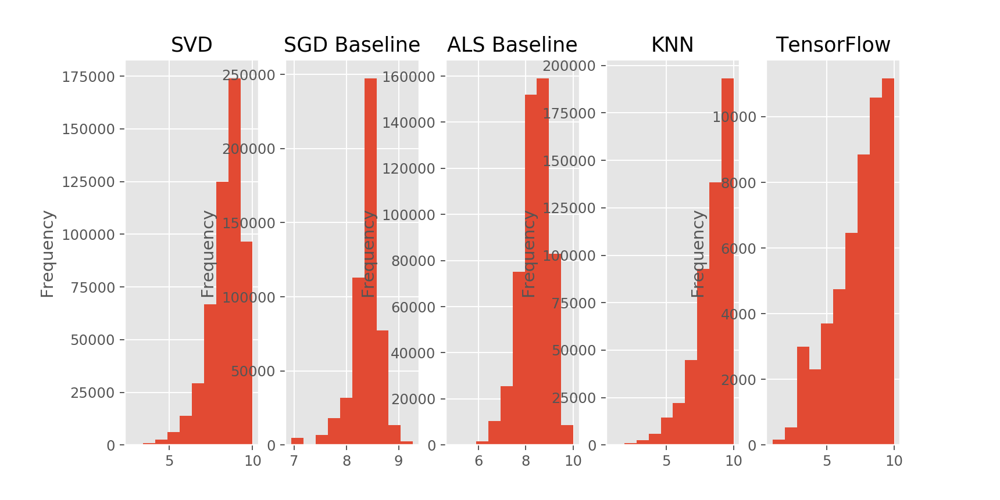

In [87]:
# How different are the predictions from both algorithms ?
# Let's count the number of predictions for each rating value

import matplotlib.pyplot as plt
import matplotlib
%matplotlib notebook
matplotlib.style.use('ggplot')
figure, (ax1, ax2, ax3, ax4, ax5) = plt.subplots(1, 5)

df_svd.est.plot(kind='hist', title='SVD', ax=ax1)
df_sgd_baseline.est.plot(kind='hist', title='SGD Baseline', ax=ax2)
df_als.est.plot(kind='hist', title='ALS Baseline', ax=ax3)
df_KNN.est.plot(kind='hist', title='KNN', ax=ax4)
df_tensorflow.est.plot(kind='hist', title='TensorFlow', ax=ax5)

# As expected, one of the drawbacks of the NN algorithms is that their predictions are often
# quite concentrated around the mean. The SVD algorithm seems more confortable predicting extreme rating values.

<a id="Part7b"></a>
## Modelling and Evaluation 4

Above we plot the comparision of errors accross various algorithm. We can see that Surpise lib have given better RMSE as compared to Tensorflow. SGD baseline seems to give best results. But KNN based alogorithm is something we can use to get hotel to hotel predictions.

-------------------------------------------------------------------------------------------------------------------
-------------------------------------------------------------------------------------------------------------------

<a id="Part8"></a>
## Deployment
The model that we have used to create a recommendation system is using just User, Hotel and Rating that too for the hotels in Europe where the majority of the Users providing the reviews were from UK. This model can be used for similar dataset as the data on which its trained is not representative of all the hotels in the world, though the code provided can be used to train models for vast population but amongst all models that we have, which will perform better is hard to tell. Though we have used cross validation to verify how good the model is when generalized, but the global viewpoint is still missing.
Below are the various limitations of the model:-
1. The model is not giving more weightage to recent comments and less weightage to old comments as with time, the hotel services are expected to change. Though we had the date, comments were recorded but as of this study, we have not considered any timeseries dependence.
2. The model constructed is not considering the number of words that were mentioned in the positive and negative comments. We think that the model should be fine even without including the word count as based on the graphs that we constructed in the Data Understanding 2, we have already proved that the rating impacted by the number of words mentioned in the comments i.e. rating already incorporates the number of words that the user writes in the review (Both positive and Negative)
3. On scanning through the dataset, we found that the comments were only in English. It may be possible that the application that was used to collect the reviews has limitation of having just users who know English. So the model is biased in that sense because it does not include the view point or feedback from non-english speaking individuals.
4. The user ID's that we have created are not accurate. This we have created as accurate as we could but for the users who have more then 1 comments, User ID's are highly unlikely to be accurate. We dont expect that much variation in the result as most of the users have provided only one comments. (Total_Number_of_Reviews_Reviewer_Has_Given has 25 percentile value as 1 and 50 percentile value as 3). But we still believe that if we had the accurate user information, then the results might differ.
5. Since there was no specific user information, we didnt had any way to analyze the user data and find if the user is a verified user or is a fake user who just provided the review to increase the rating of the Hotel.

The negative rating of hotel can be temporary like in cases when hotel is having renovation or places around hotel is having some construction, then reviewers are more likely to give negative ratings due to the noise and other reasons which would mean that retraining of the model is required more frequently. In travel-industry jargon, the year is divided into three seasons: peak season (roughly mid-June through August), shoulder season (April through mid-June and September through October), and off-season (November through March). So we would suggest that the model should be retrained at least at the beginning of every season.

Other information that would give to more deep and accurate analysis would be fields like:-
1. Number of days of stay of the user: - The larger the number of days of stay is, the rating given by the user would be more closer to the reality.
2. User ID (not the PII information) using which the users can be uniquely distinguished.
3. Kind of trip the reviewer had - Individual, Couple or Family:- By this, its possible to recommend the hotels based on the number of individuals accompanying the main guest.
4. Purpose of the stay - Tourism, Professional (Meetings, seminars), Business:- Since the expectation of the individual changes as per the purpose of the travel, it would be nice to know this information as well since this would give a clear view of how good the hotel is depending on the purpose.
5. If possible, the rate information or information like expensive, moderate or low would also be a great information to have so that the suggestions can be made as per the budget of the individual.

<a id="Part9"></a>
## Exceptional Work
As a part of this project, we have created recommendation systems by using various algorithms from the libraries like Graphlabs, Surpriselib and TensorFLow. We have discussed the performance and gave the model description based on the various parameters.
In addition to that, below are few layman techniques which can be used to determine the recommendations.

### Recommending based on counts
This though is not a recommended approach, but could be a starting point. The more number of reviews the hotel is having, its more likely that the more number of persons have stayed at hotel suggesting more popular the hotel is and good likelyhood of the hotel being a desent one.<br>
Below are the top 5 hotels as per the count of reviews.

In [42]:
review_count = pd.DataFrame(df_hotel_review.groupby(['Hotel_ID','Hotel_Name','Hotel_Address'])['Reviewer_Score'].count())
review_count.sort_values('Reviewer_Score', ascending=False).head()

,,,Reviewer_Score
Hotel_ID,Hotel_Name,Hotel_Address,
00187,Britannia International Hotel Canary Wharf,163 Marsh Wall Docklands Tower Hamlets London E14 9SJ United Kingdom,4786
00487,Strand Palace Hotel,372 Strand Westminster Borough London WC2R 0JJ United Kingdom,4250
01481,Park Plaza Westminster Bridge London,Westminster Bridge Road Lambeth London SE1 7UT United Kingdom,4167
01272,Copthorne Tara Hotel London Kensington,Scarsdale Place Kensington Kensington and Chelsea London W8 5SY United Kingdom,3577
00690,DoubleTree by Hilton Hotel London Tower of London,7 Pepys Street City of London London EC3N 4AF United Kingdom,3207


### Recommendation based on Average review score and number of reviews
The below method shows another layman way in which we can group the data based on the various hotels and get average reviewer rating. The reviewer rating can be used with the number of users who have provided the rating to the hotel. The higher the rating is with higher number of individuals commneting gives an indication of a better hotel to look for.<br>
Like in the output below, the hotel with ID 00003 appears to be a good hotel as it has been reviewed by 1037 times but then too its rating is very high.

In [109]:
rating = pd.DataFrame(df_hotel_review.groupby('Hotel_ID')['Reviewer_Score'].mean())
rating['count'] = pd.DataFrame(df_hotel_review.groupby('Hotel_ID')['Reviewer_Score'].count())
rating.head()

,Reviewer_Score,count
Hotel_ID,,
00001,7.836296,405
00002,8.602827,566
00003,9.298843,1037
00004,7.713469,1767
00005,8.848571,35


### Recommendation based on Correlation
This is another trival method where based on the hotel the user is currently looking into, the algorithm will recommend the hotels similar to the hotel currently searched for. This algorithm use correlation metrix.

Step 1:- Create User-Item matrix

In [ ]:
rating_crosstab = df_hotel_review.pivot_table(values='Reviewer_Score', index='User_ID', columns='Hotel_ID', fill_value=0)

Step 2: Convert the User-Item matrix to Item-User Matrix

In [158]:
X = rating_crosstab.T
print(rating_crosstab.shape)
print(X.shape)

(142655, 1494)
(1494, 142655)


Step 3: Reduce the number of Dimensions of the Item-User matrix. Since this is very sparse matrix, use the SVD (Singular-Value decomposition) algorithm for parameter reduction.

In [159]:
import sklearn
from sklearn.decomposition import TruncatedSVD

In [160]:
SVD = TruncatedSVD(n_components=12, random_state=17)

resultant_matrix = SVD.fit_transform(X)

resultant_matrix.shape

(1494, 12)

Step 4: Generate the correlation matrix which uses the SVD parameters to compute how similar various hotels are.

In [161]:
corr_mat = np.corrcoef(resultant_matrix)
corr_mat.shape

(1494, 1494)

Lets suppose that the user is searching for hotel with ID 00087. So to that user, we can recommend the hotels which are highly correlated with this hotel.

In [162]:
hotels_id = list(rating_crosstab.columns)
index_hotel_00087 = hotels_id.index('00087')
corr_hotel_00087 = corr_mat[index_hotel_00087]


In [167]:
print(rating_crosstab.columns[(corr_hotel_00087<1.0) & (corr_hotel_00087>0.98)])

Index(['00073', '00096', '00097', '00098', '00101', '00105', '00107', '00111',
       '00113', '00117', '00118', '00121', '00125', '00126', '00127', '00128',
       '00132', '00136', '00137', '00158'],
      dtype='object', name='Hotel_ID')


In [167]:
print(rating_crosstab.columns[(corr_hotel_00087<1.0) & (corr_hotel_00087>0.98)])

Index(['00073', '00096', '00097', '00098', '00101', '00105', '00107', '00111',
       '00113', '00117', '00118', '00121', '00125', '00126', '00127', '00128',
       '00132', '00136', '00137', '00158'],
      dtype='object', name='Hotel_ID')


** Compare this result with the list of hotels obtained from KNN. **

In [223]:
import sklearn
from sklearn.neighbors import NearestNeighbors

In [247]:
nbrs = NearestNeighbors(n_neighbors=16).fit(resultant_matrix)
nbrs.kneighbors([resultant_matrix[index_hotel_00087]])[1]

array([[ 86, 104,  95, 106,  78, 108, 136, 113, 162, 114, 109, 139, 129,
        110,  89, 121]], dtype=int64)

Since the Hotels are ordered by their ID's, the above indixes + 1 would represent the hotel ID's.
So the hotels_ids of hotels similar to hoteld 00087 are :
00087 00105 00096 00107 00079 00109 00137 00114 00163 00115 00110 00140 00130 00111 00090 00122

These are different then what the method using correlation showed. This is because of the difference in the two algorithms.
KNN is very matured as compared to the correlation.